# How well can an LLM recognize that the graph of an EBM depicts a well-known function?

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os

import t2ebm

import t2ebm.graphs as graphs

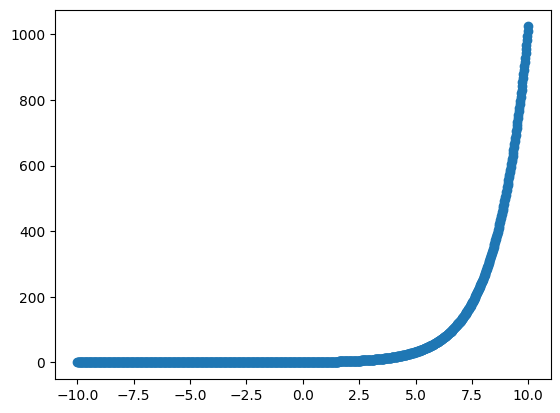

In [26]:
# for each, function draw 1000 samples from a uniform distribution and plot the function
function_points = []
x = np.linspace(-10, 10, 1000)
y = 2 ** x
plt.scatter(x, y)
plt.show()

# 50 well-known Functions

50


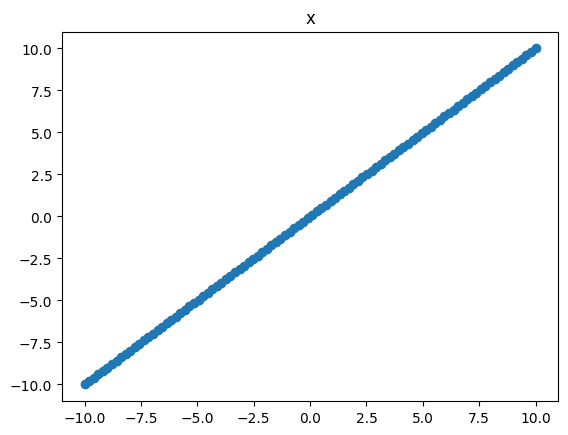

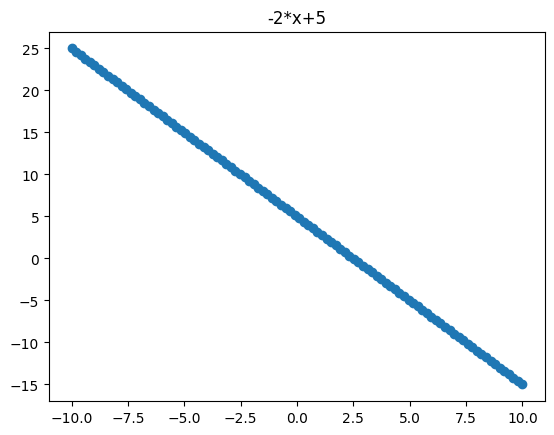

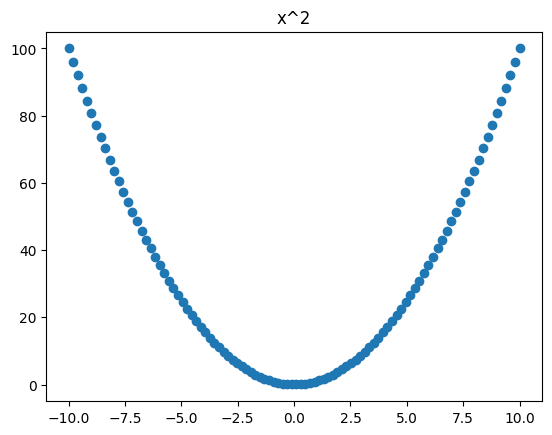

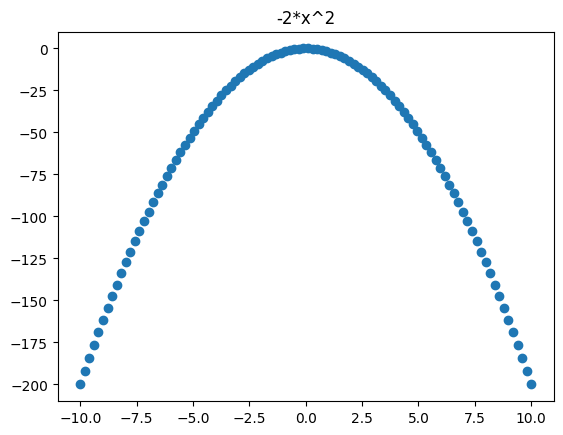

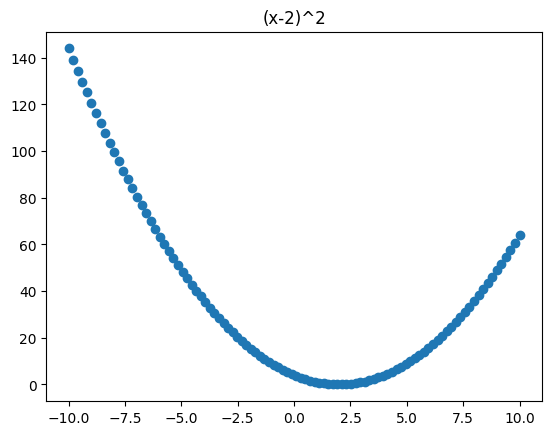

...

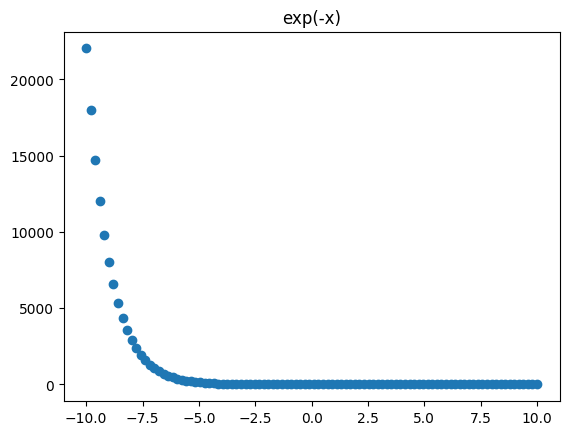

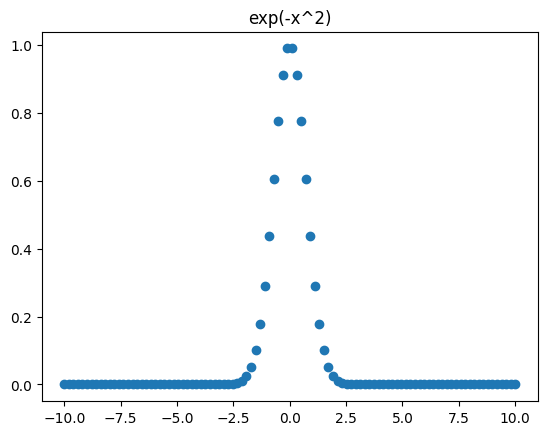

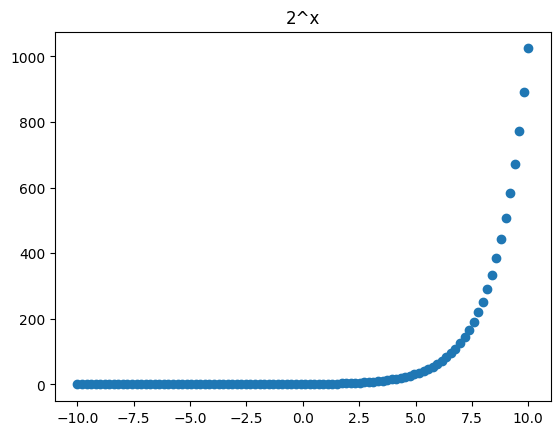

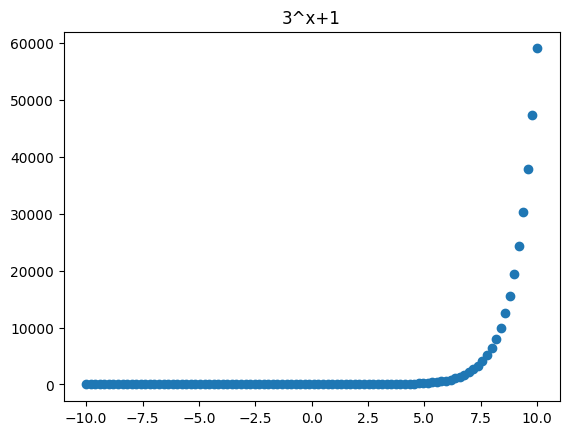

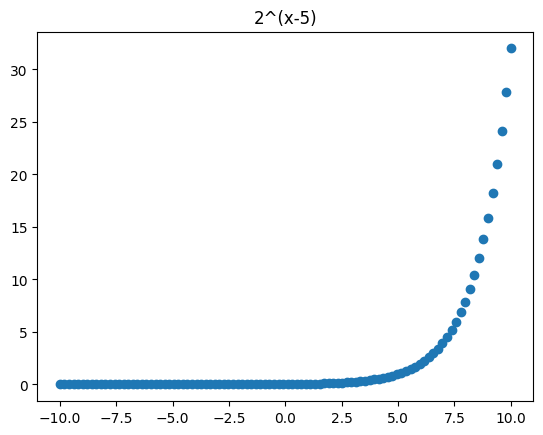

/tmp/ipykernel_101807/3910453938.py:46: RuntimeWarning: divide by zero encountered in log
  (lambda x: np.log(x+10), 'log(x+10)'),


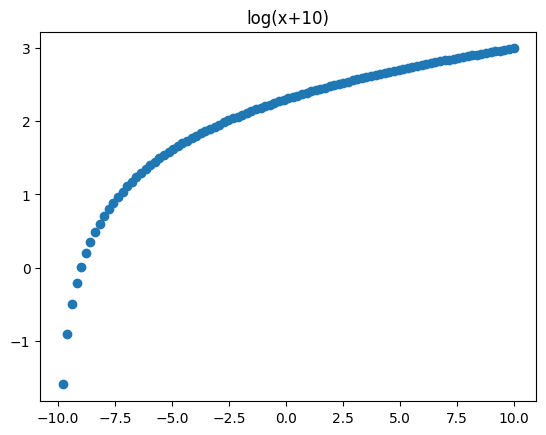

/tmp/ipykernel_101807/3910453938.py:47: RuntimeWarning: divide by zero encountered in log
  (lambda x: -np.log(x+10), '-log(x+10)'),


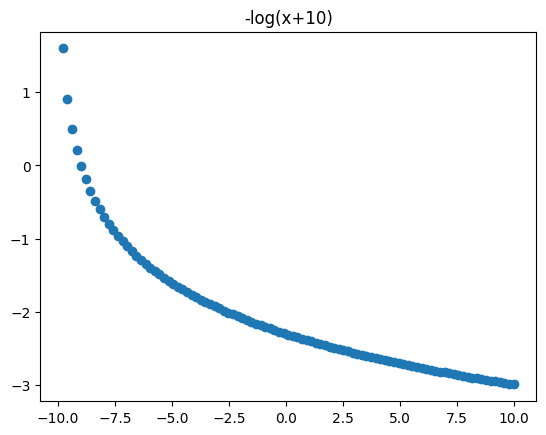

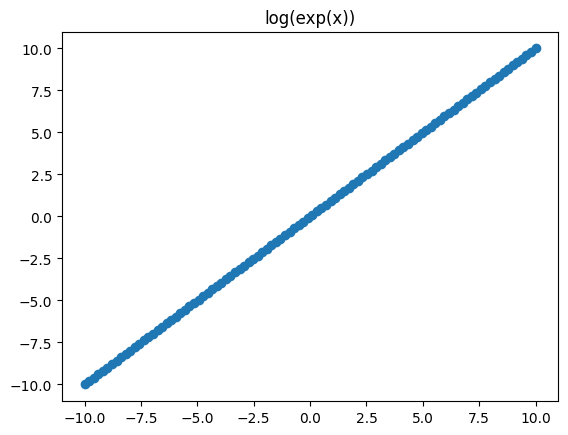

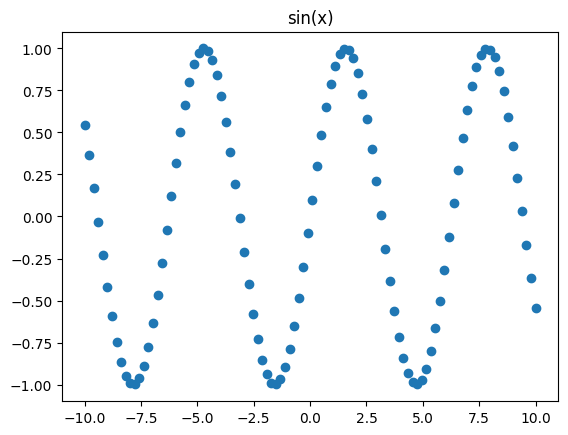

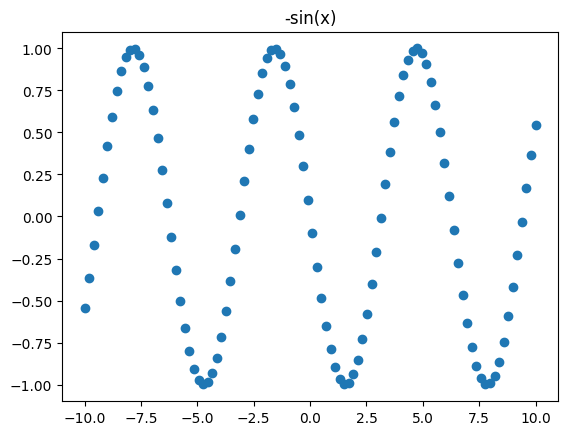

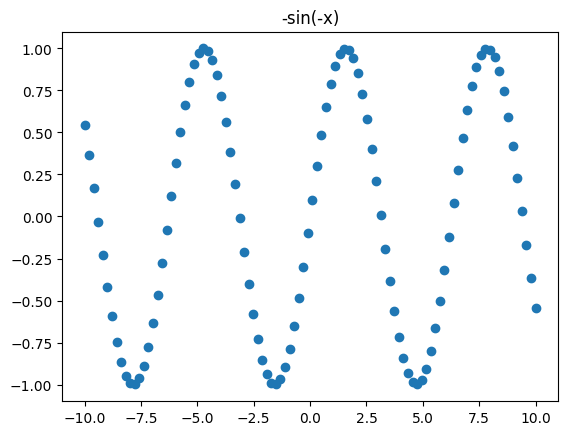

...

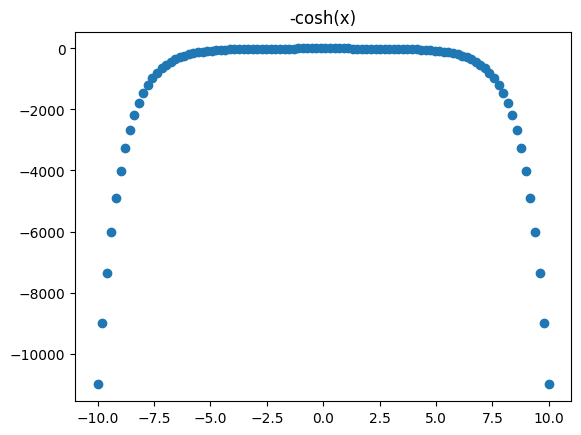

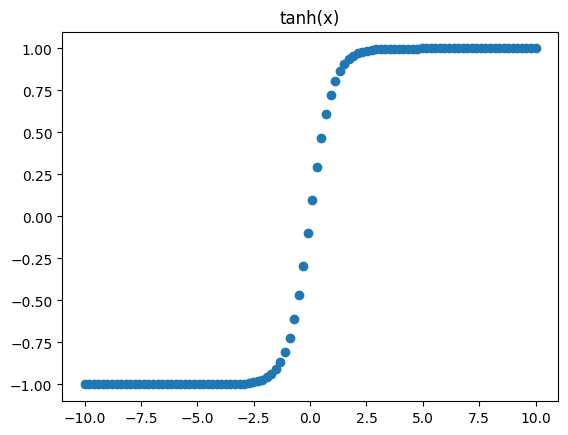

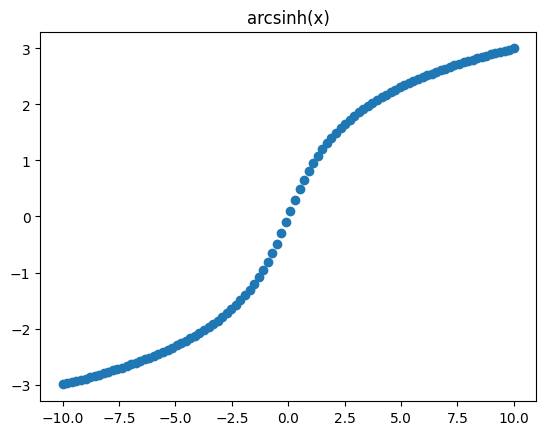

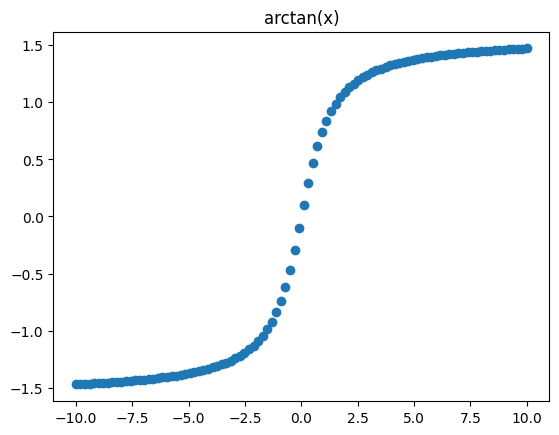

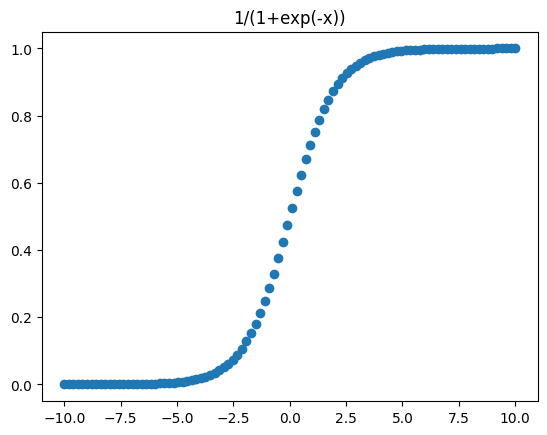

In [37]:
fbench = [
    # polynomials
    (lambda x: x, 'x'),
    (lambda x: -2*x+5, '-2*x+5'),
    (lambda x: x**2, 'x^2'),
    (lambda x: -2*x**2, '-2*x^2'),
    (lambda x: (x-2)**2, '(x-2)^2'),
    (lambda x: (x-1)*(x+1), '(x-1)*(x+1)'),
    (lambda x: x**2+3*x-1, 'x^2+3*x-1'),
    (lambda x: x**3, 'x^3'),
    (lambda x: -3*x**3, '-3*x^3'),
    (lambda x: x ** 4, 'x^4'),
    (lambda x: (x + 4) ** 4, '-(x + 4)^4'),
    (lambda x: x ** 5, 'x^5'),
    (lambda x: -x ** 5, '-x^5'),

    # sign
    (lambda x: np.sign(x), 'sign(x)'),
    (lambda x: -np.sign(x), '-sign(x)'),
    (lambda x: -np.sign(-x), '-sign(-x)'),
    (lambda x: np.sign(x+3), 'sign(x+3)'),
    (lambda x: np.sign(x-1), 'sign(x-1)'),

    # abs
    (lambda x: np.abs(x), '|x|'),
    (lambda x: -np.abs(x), '-|x|'),
    (lambda x: -np.abs(-x), '-|-x|'),
    (lambda x: np.abs(2*x+5), '|2*x+4|'),
    (lambda x: np.abs(x ** 3), '|x^3|'),

    # root
    (lambda x: np.sqrt(x+10), 'sqrt(x+10)'),
    (lambda x: -np.sqrt(x+10), '-sqrt(x+10)'),
    (lambda x: np.sqrt(x ** 2 + 3*x + 5), 'sqrt(x ** 2 + 3*x +5)'),

    # exponential
    (lambda x: np.exp(x), 'exp(x)'),
    (lambda x: -np.exp(x), '-exp(x)'),
    (lambda x: np.exp(-x), 'exp(-x)'),
    (lambda x: np.exp(-x**2), 'exp(-x^2)'),
    (lambda x: 2 ** x, '2^x'),
    (lambda x: 3 ** x, '3^x+1'),
    (lambda x: 2 ** (x-5), '2^(x-5)'),

    # logarithm
    (lambda x: np.log(x+10), 'log(x+10)'),
    (lambda x: -np.log(x+10), '-log(x+10)'),
    (lambda x: np.log(np.exp(x)), 'log(exp(x))'),

    # trigonometric
    (lambda x: np.sin(x), 'sin(x)'),
    (lambda x: -np.sin(x), '-sin(x)'),
    (lambda x: -np.sin(-x), '-sin(-x)'),
    (lambda x: np.sin(x+2)+2, 'sin(x+2)+2'),
    (lambda x: np.cos(x), 'cos(x)'),
    (lambda x: 1/2*np.cos(x-2), '1/2*cos(x-2)'),
    (lambda x: np.sinh(x), 'sinh(x)'),
    (lambda x: -np.sinh(x), '-sinh(x)'),
    (lambda x: np.cosh(x), 'cosh(x)'),
    (lambda x: -np.cosh(x), '-cosh(x)'),
    (lambda x: np.tanh(x), 'tanh(x)'),
    (lambda x: np.arcsinh(x), 'arcsinh(x)'),
    (lambda x: np.arctan(x), 'arctan(x)'),


    # sigmoid
    (lambda x: 1/(1+np.exp(-x)), '1/(1+exp(-x))'),
]

print(len(fbench))

# for each, function draw 1000 samples from a uniform distribution and plot the function
x = np.linspace(-10, 10, 100)
for f, n in fbench:
    y = f(x)
    plt.scatter(x, y)
    plt.title(n)
    plt.show()

### Generate mulitple choice questions. graphs are combined so that the correct option has a fairly unique shape among all options

In [44]:
fbench_questions[9]

([9, 40, 26, 25, 7], 9)

Question  0


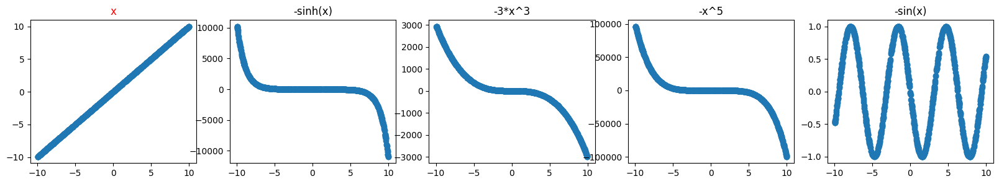

Question  1


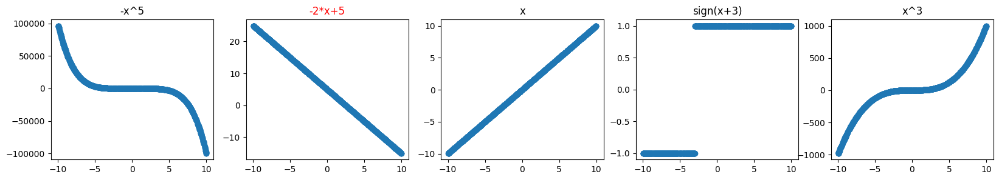

Question  2


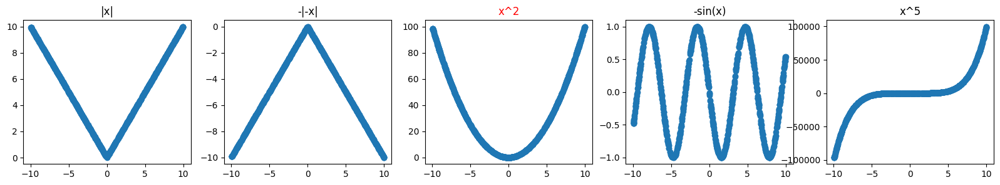

Question  3


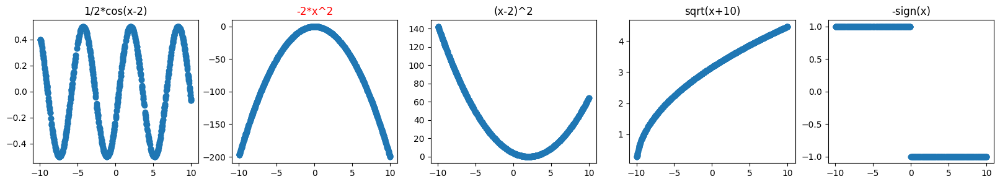

Question  4


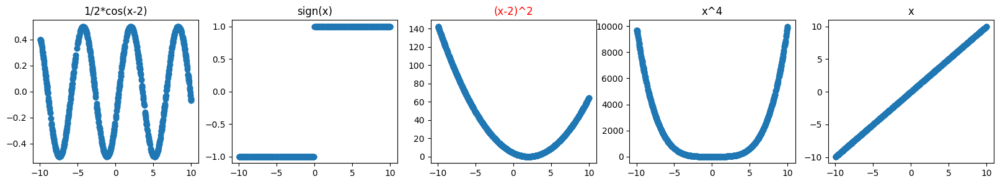

Question  5


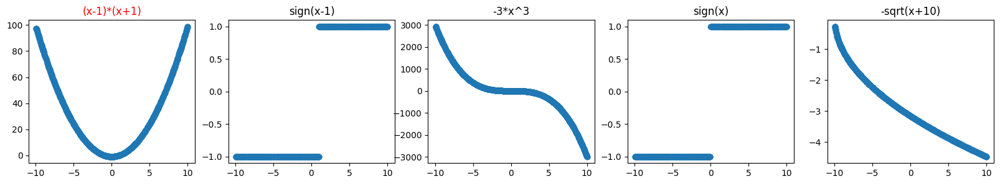

Question  6


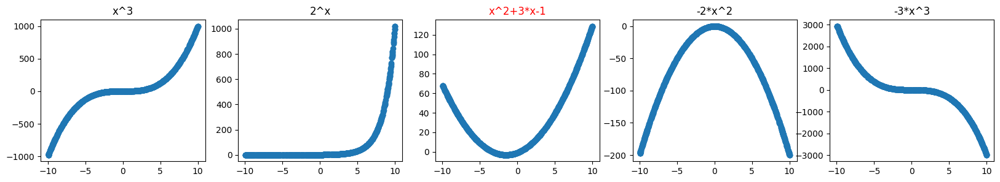

Question  7


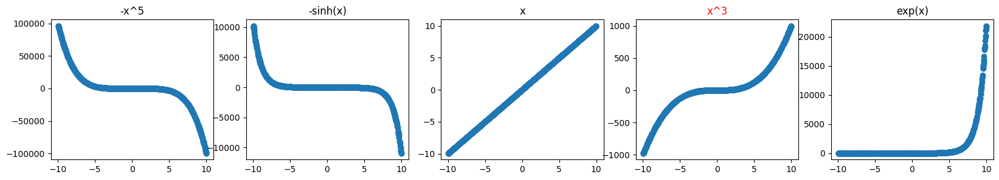

Question  8


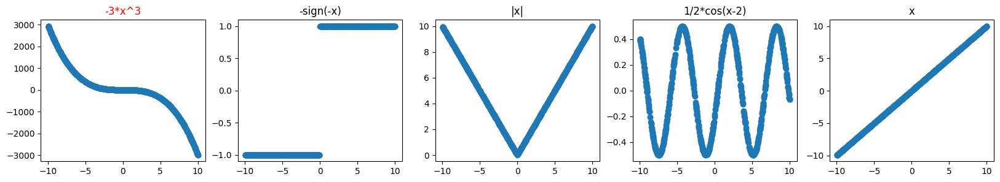

Question  9


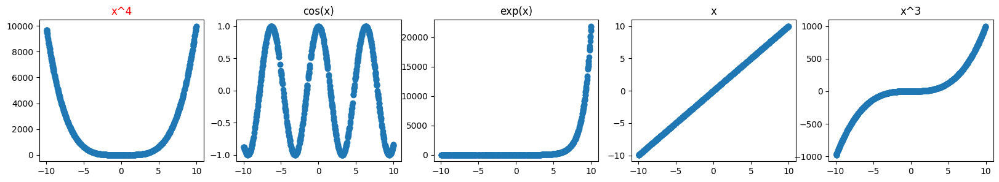

Question  10


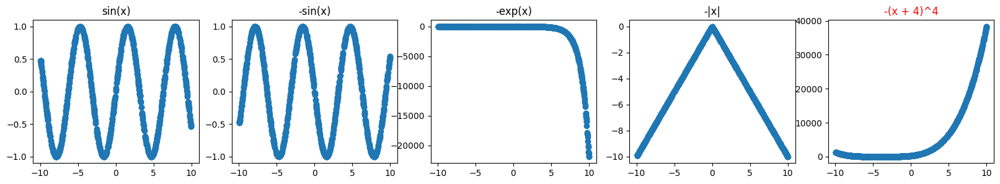

Question  11


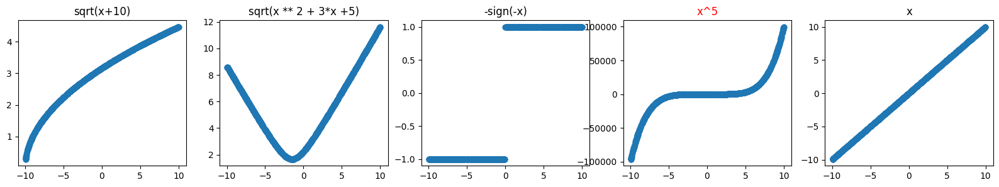

Question  12


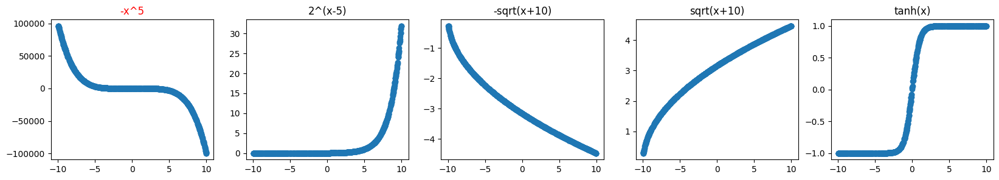

Question  13


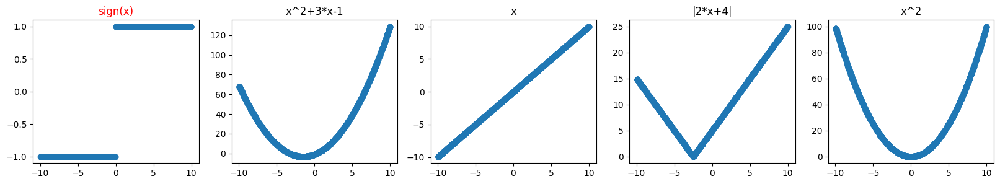

Question  14


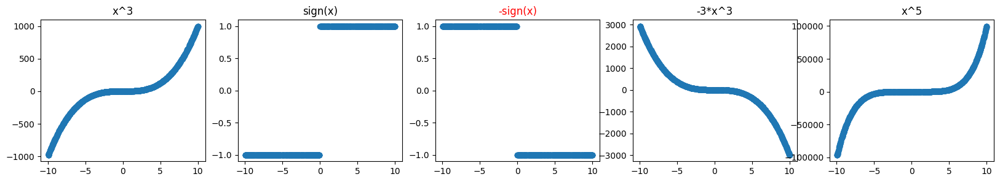

Question  15


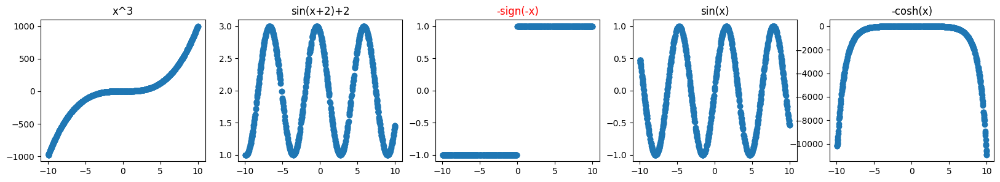

Question  16


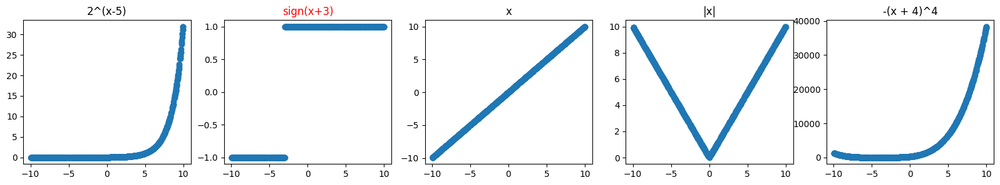

Question  17


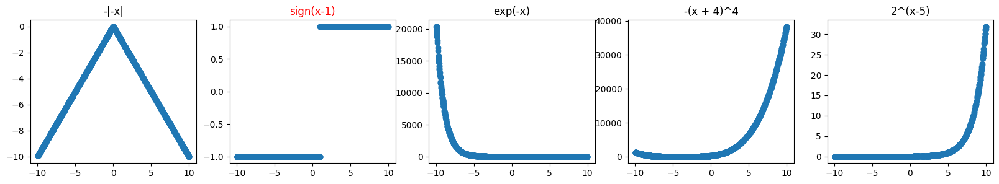

Question  18


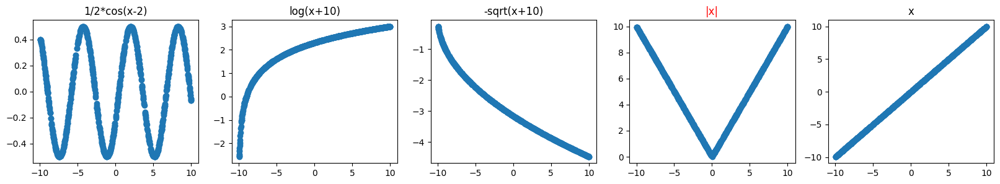

Question  19


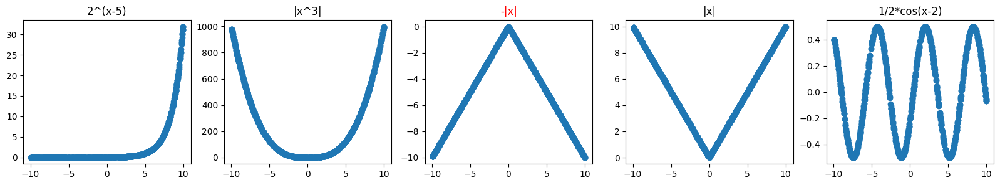

Question  20


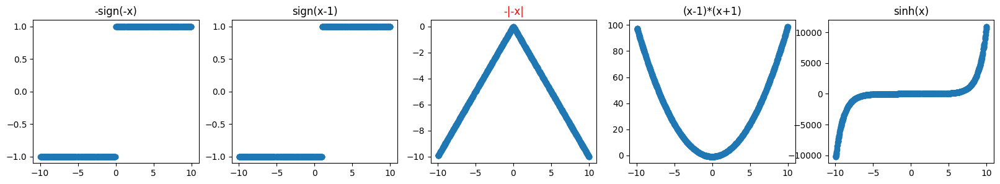

Question  21


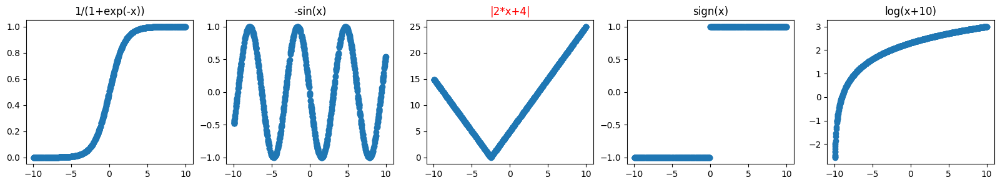

Question  22


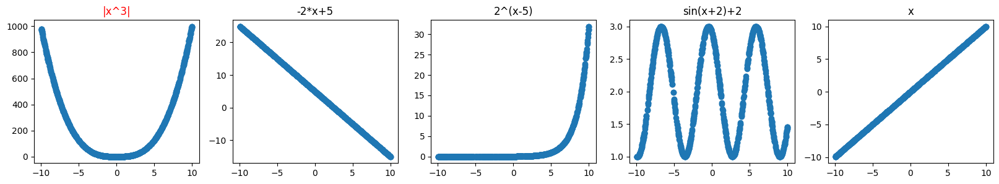

Question  23


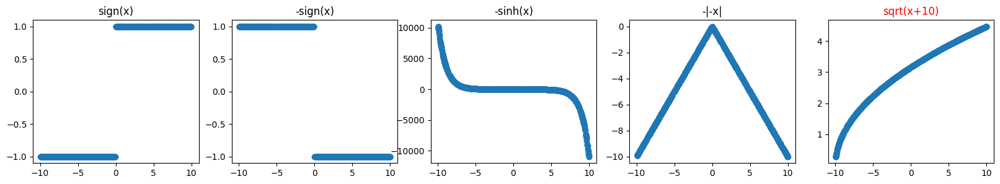

Question  24


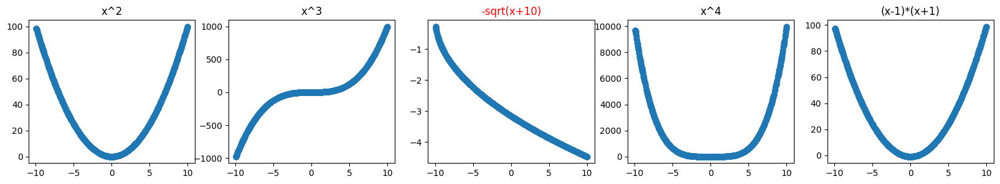

Question  25


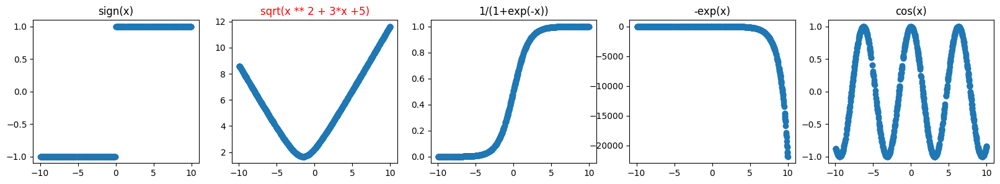

Question  26


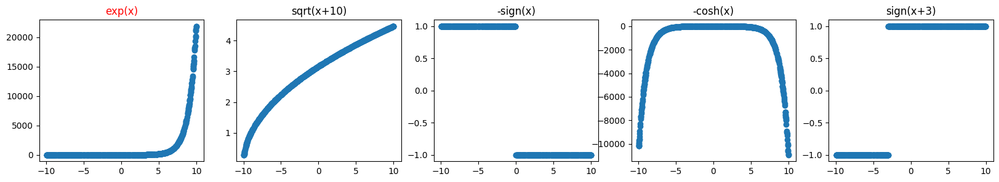

Question  27


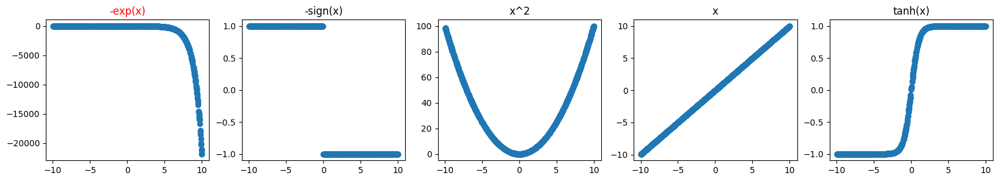

Question  28


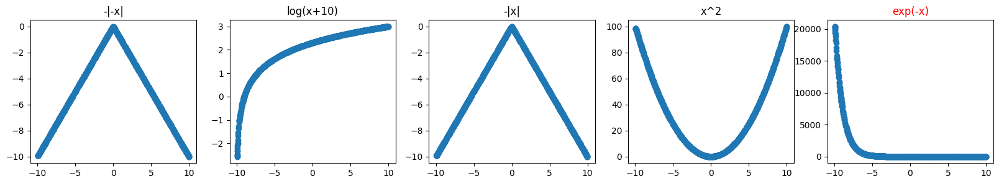

Question  29


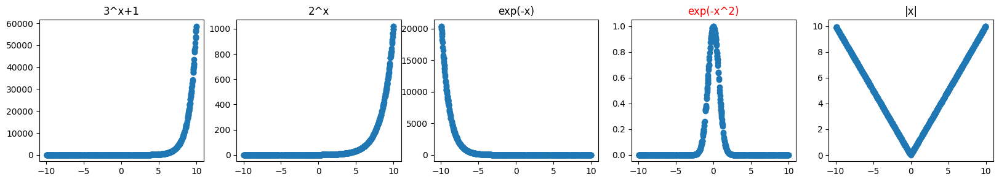

Question  30


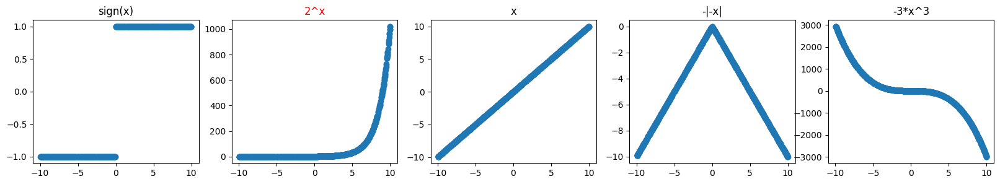

Question  31


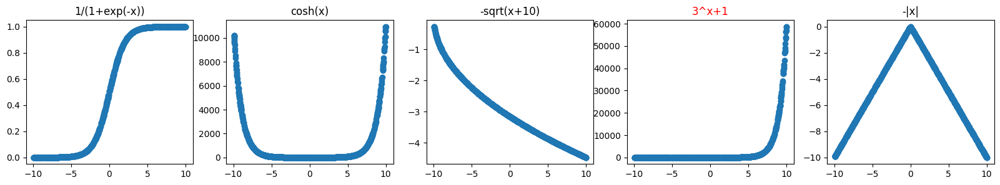

Question  32


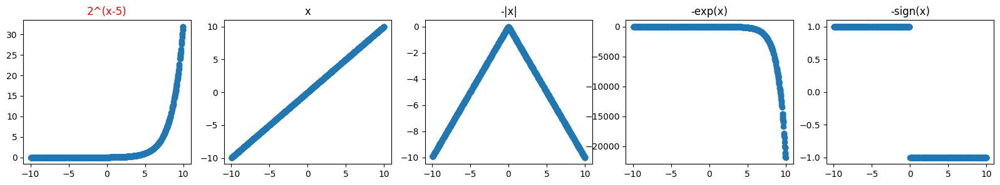

Question  33


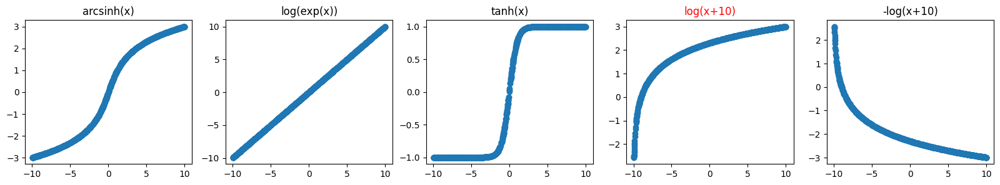

Question  34


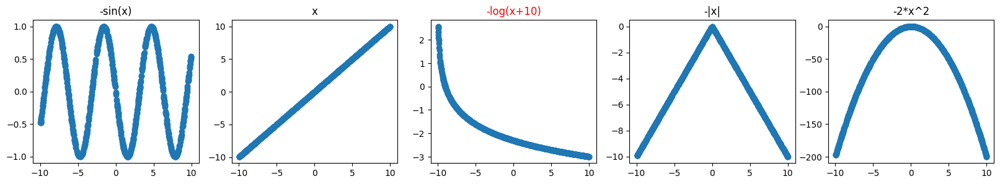

Question  35


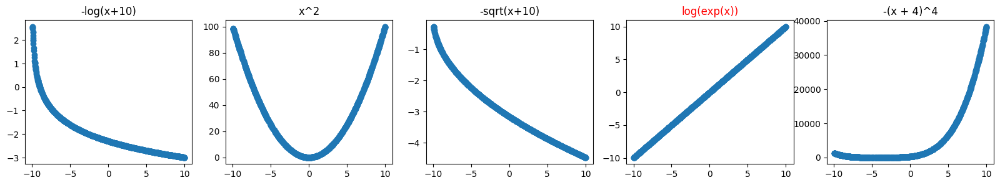

Question  36


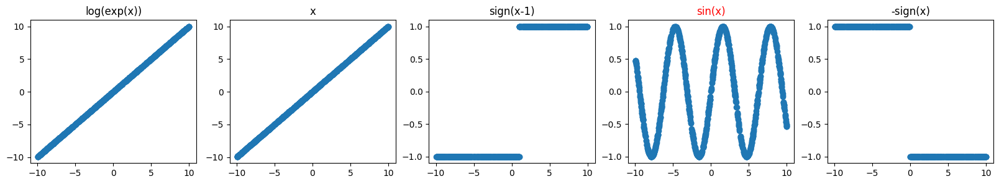

Question  37


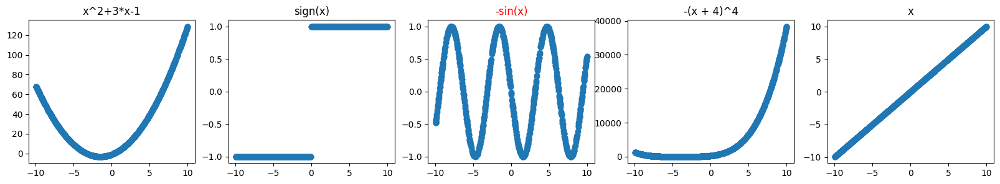

Question  38


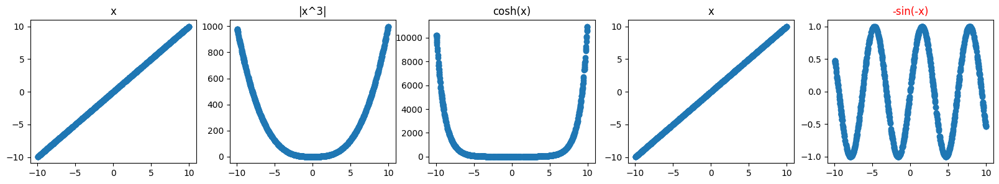

Question  39


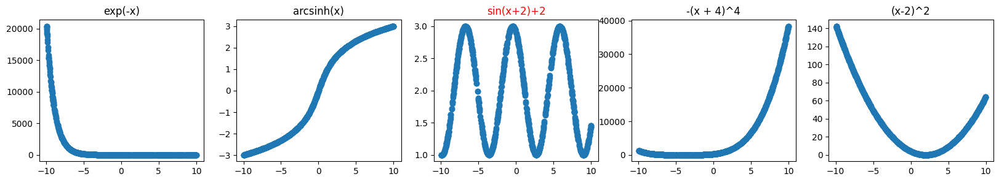

Question  40


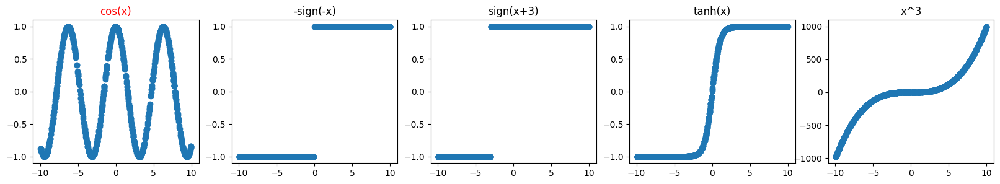

Question  41


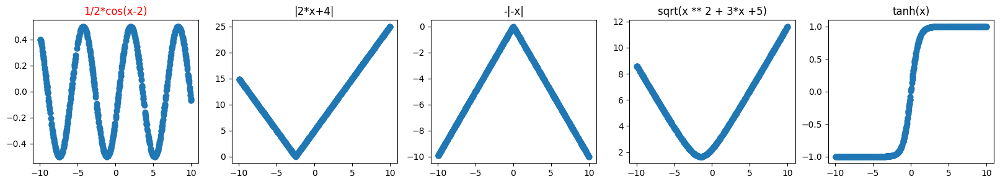

Question  42


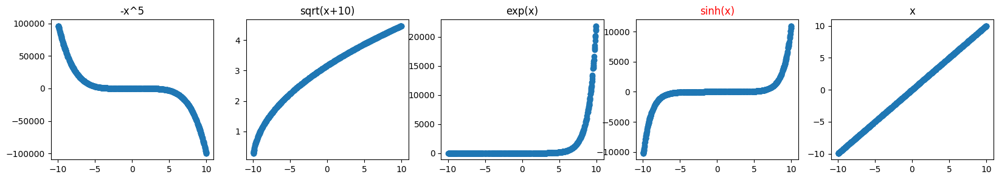

Question  43


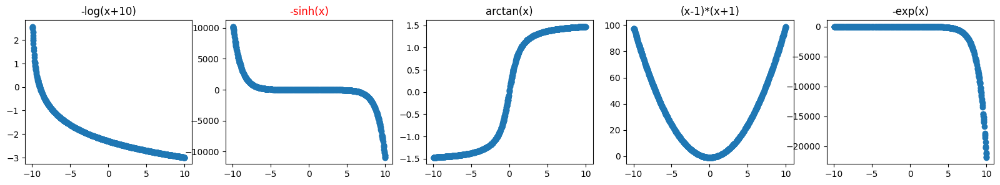

Question  44


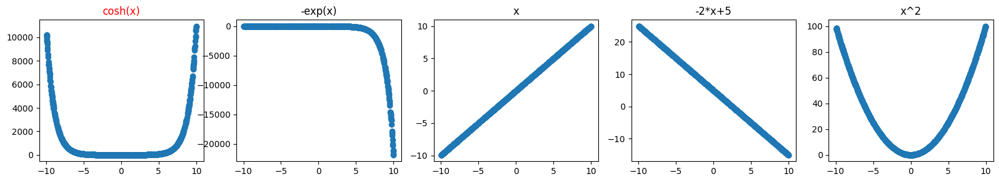

Question  45


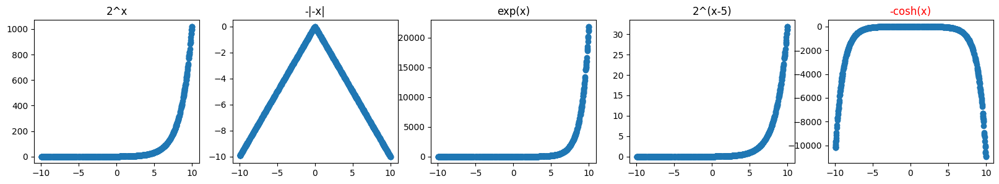

Question  46


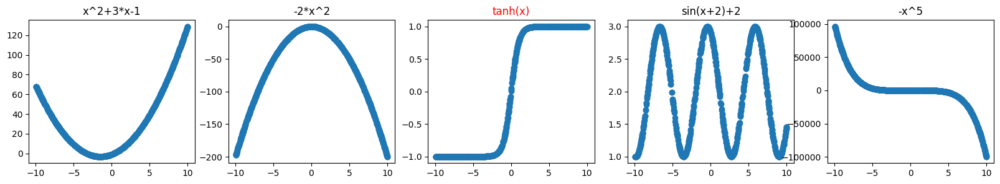

Question  47


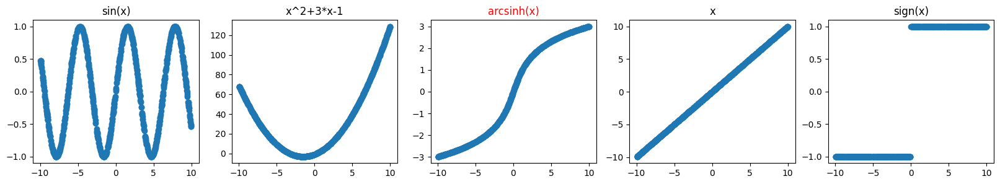

Question  48


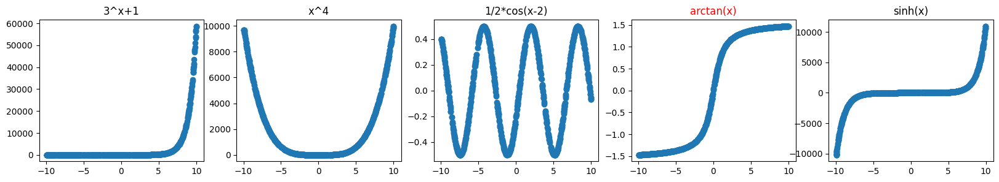

Question  49


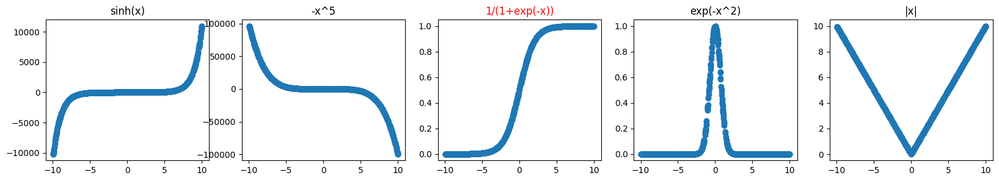

In [88]:
# first, randomly select the other multiple choice options
np.random.seed(1)
fbench_questions = []
for idx, _ in enumerate(fbench):
    mc_options = [idx]
    # select 4 more random functions
    for _ in range(4):
        random_idx = np.random.randint(0, len(fbench))
        while random_idx in mc_options:
            random_idx = np.random.randint(0, len(fbench))
        mc_options.append(random_idx)
    # shuffle options
    np.random.shuffle(mc_options)
    # store the options and the correct answer
    fbench_questions.append((mc_options, idx))

# assure that the shape of the correct answer is unique among the mc options
def replace(q, i, v):
    question = fbench_questions[q]
    options = list(question[0])
    options[i] = v
    fbench_questions[q] = (options, question[1])
    
replace(4, 4, 0)
replace(7, 2, 0)
replace(9, 3, 0)
replace(11, 4, 0)
replace(16, 2, 0)
replace(18, 4, 0)
replace(22, 4, 0)
replace(22, 1, 1)
replace(30, 2, 0)
replace(32, 1, 0)
replace(34, 1, 0)
replace(36, 1, 0)
replace(37, 4, 0)
replace(38, 0, 0)
replace(42, 4, 0)
replace(44, 2, 0)
replace(44, 3, 1)
replace(44, 4, 2)
replace(47, 3, 0)

# plot the 5 functions for each question
# make a 1x5 grid of plots
for idx, (options, correct) in enumerate(fbench_questions):
    fig, axes = plt.subplots(1, 5, figsize=(20, 3))
    print('Question ', idx)
    for i, ax in enumerate(axes):
        f, n = fbench[options[i]]
        y = f(x)
        ax.scatter(x, y)
        ax.set_title(n)
        # if it is the correct one, set the title color to red
        if options[i] == correct:
            ax.title.set_color('red')
    plt.show()

# F-Bench (Hard subset with less well-known functions)

30


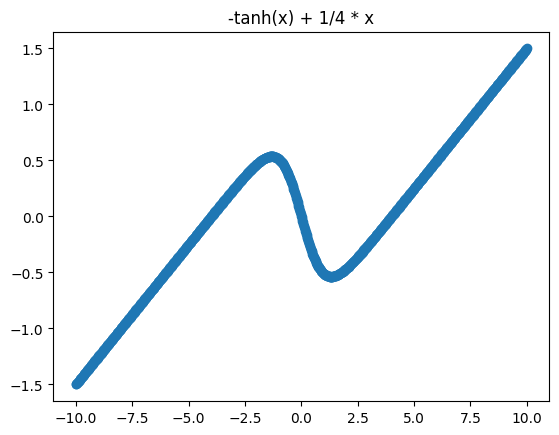

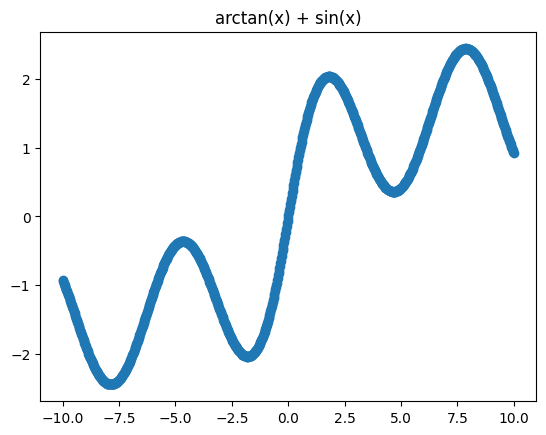

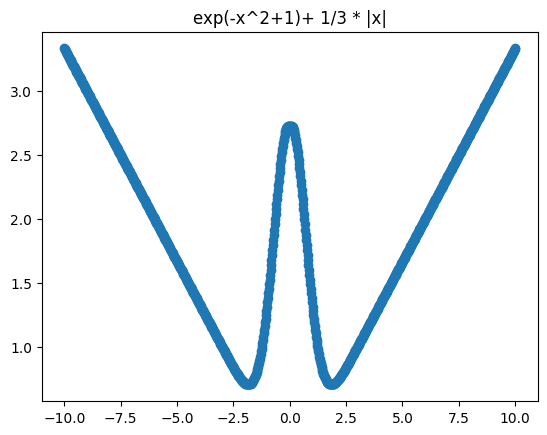

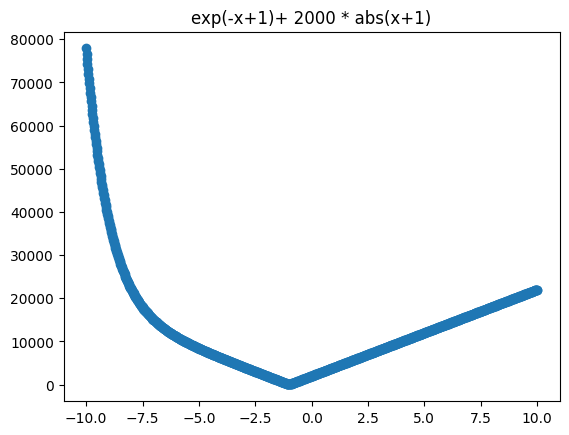

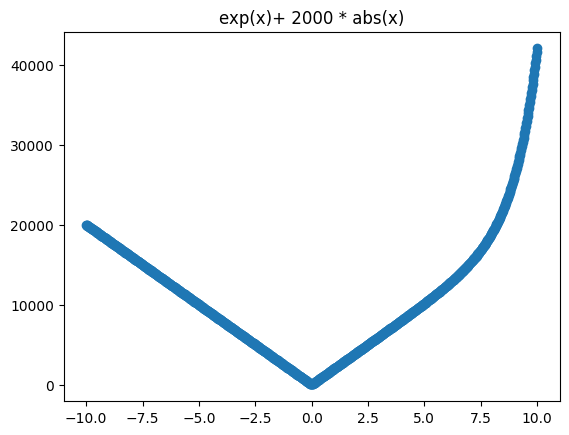

...

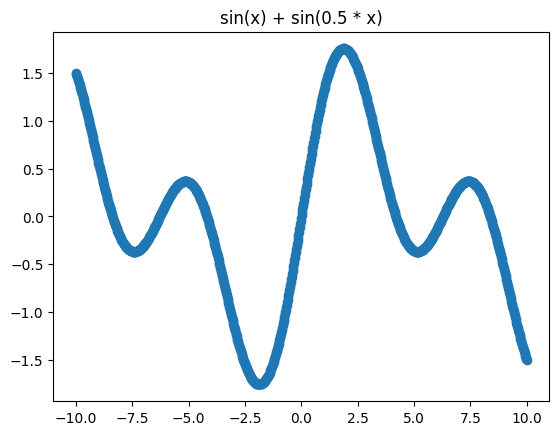

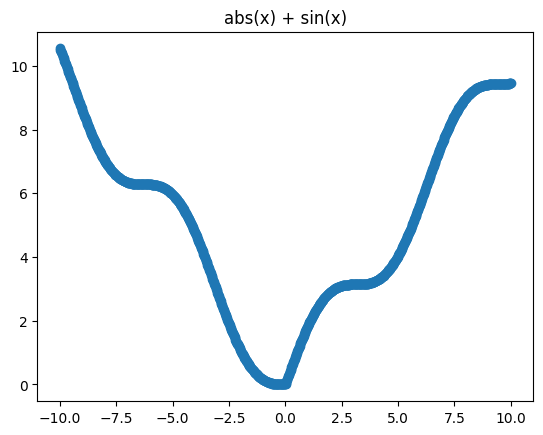

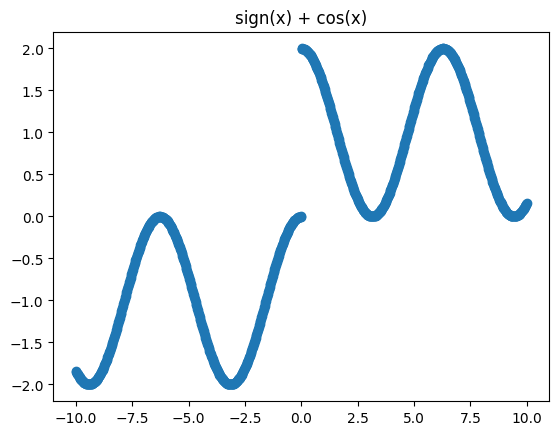

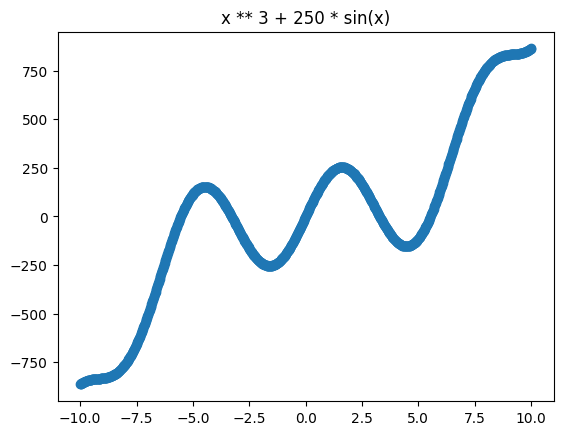

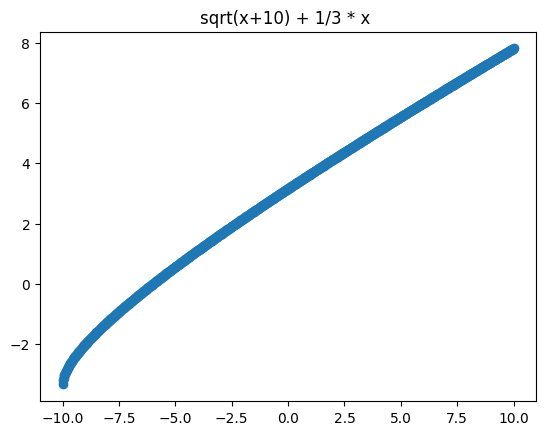

/tmp/ipykernel_101807/1061528540.py:26: RuntimeWarning: divide by zero encountered in log
  (lambda x: np.log(x+10) + 1/3 * x , 'log(x+10) + 1/3 * x '),


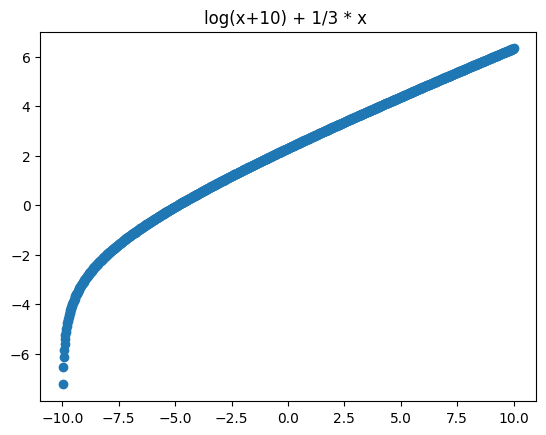

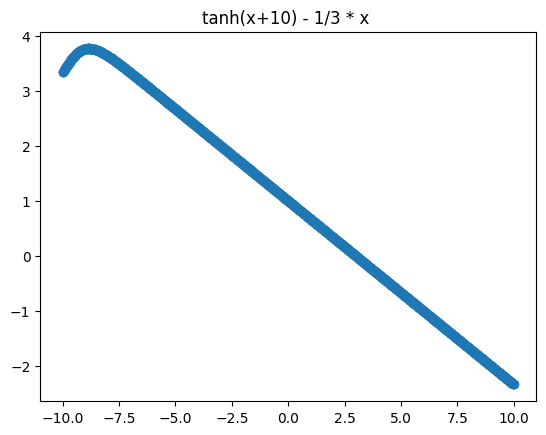

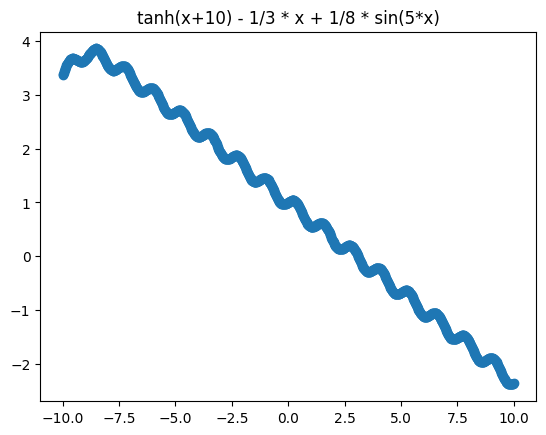

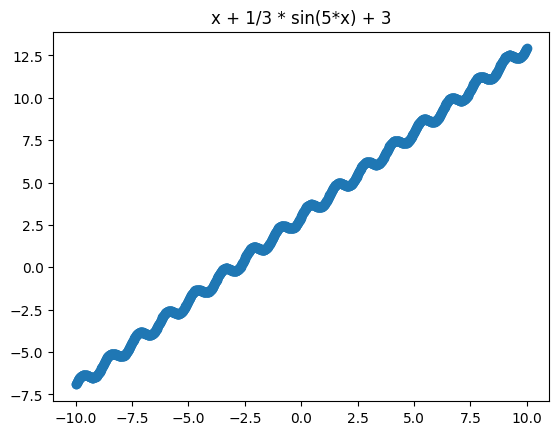

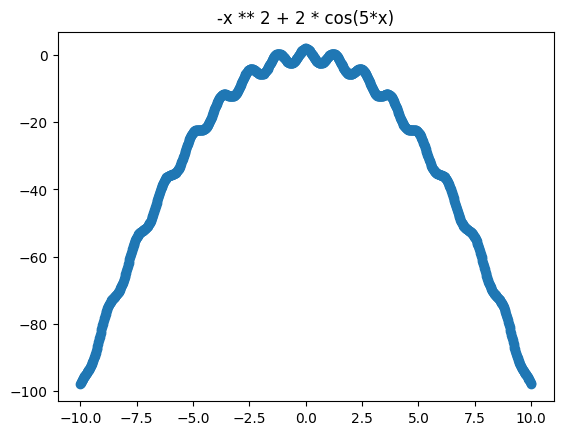

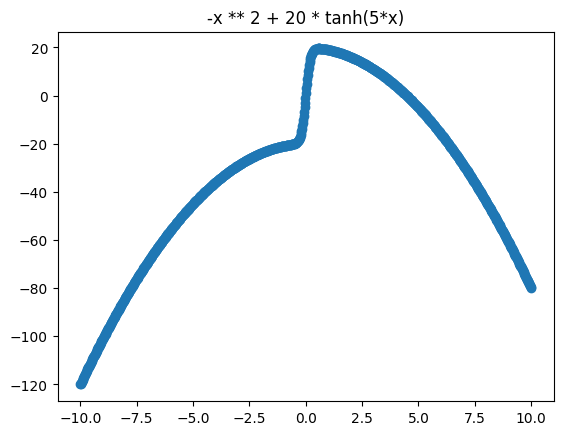

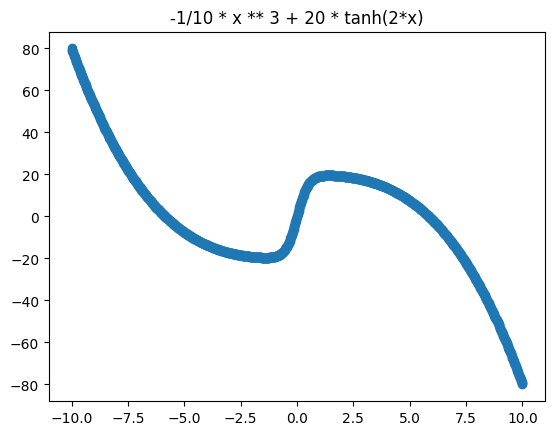

In [117]:
fbench_hard = [
    # composite functions
    (lambda x: -np.tanh(x) + 1/4 * x, '-tanh(x) + 1/4 * x'),
    (lambda x: np.arctan(x) + np.sin(x), 'arctan(x) + sin(x)'),
    (lambda x: np.exp(-x**2+1) + 1/3*np.abs(x), 'exp(-x^2+1)+ 1/3 * |x|'),
    (lambda x: np.exp(-x+1) + 2000* np.abs(x+1), 'exp(-x+1)+ 2000 * abs(x+1)'),
    (lambda x: np.exp(x) + 2000* np.abs(x), 'exp(x)+ 2000 * abs(x)'),
    (lambda x: np.exp(x) + 4000* np.sign(x), 'exp(x)+ 4000 * sign(x)'),
    (lambda x: np.sin(x) + np.cos(x), 'sin(x)+cos(x)'),
    (lambda x: np.abs(np.sin(x/2)), '|sin(x/2)|'),
    (lambda x: np.exp(x) + 4000* np.sin(x), 'exp(x) + 4000* sin(x)'),
    (lambda x: np.sign(np.sin(x)), 'sign(sin(x))'),
    (lambda x: np.sign(np.cos(x)), 'sign(cos(x))'),
    (lambda x: np.sin(x) + np.sin(2*x), 'sin(x)+sin(2*x)'),
    (lambda x: 1/2 * (x+1) ** 4 - 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1, '1/2 * (x+1) ** 4 - 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1'),
    (lambda x: -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1, '-1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1'),
    (lambda x: np.sign(x ** 2 - 15), 'sign(x ** 2 - 15)'),
    (lambda x: np.abs(x ** 2 - 20), 'abs(x ** 2 - 20)'),
    (lambda x: np.abs(x) ** (1/10), 'abs(x) ** (1/10)'),
    (lambda x: np.sin(x) + np.sin(3*x), 'sin(x) + sin(3*x)'),
    (lambda x: np.sin(x) + np.sin(0.5 * x), 'sin(x) + sin(0.5 * x)'),
    (lambda x: np.abs(x) + np.sin(x), 'abs(x) + sin(x)'),
    (lambda x: np.sign(x) + np.cos(x), 'sign(x) + cos(x)'),
    (lambda x: x ** 3 + 250 * np.sin(x), 'x ** 3 + 250 * sin(x)'),
    (lambda x: np.sqrt(x+10) + 1/3 * x , 'sqrt(x+10) + 1/3 * x '),
    (lambda x: np.log(x+10) + 1/3 * x , 'log(x+10) + 1/3 * x '),
    (lambda x: np.tanh(x+10) - 1/3 * x , 'tanh(x+10) - 1/3 * x '),
    (lambda x: np.tanh(x+10) - 1/3 * x + 1/8 * np.sin(5*x), 'tanh(x+10) - 1/3 * x + 1/8 * sin(5*x)'),
    (lambda x: x + 1/3 * np.sin(5*x) + 3, 'x + 1/3 * sin(5*x) + 3'),
    (lambda x: -x ** 2 + 2 * np.cos(5*x), '-x ** 2 + 2 * cos(5*x)'),
    (lambda x: -x ** 2 + 20 * np.tanh(5*x), '-x ** 2 + 20 * tanh(5*x)'),
    (lambda x: -1/10 * x ** 3 + 20 * np.tanh(2*x), '-1/10 * x ** 3 + 20 * tanh(2*x)'),
]

print(len(fbench_hard))

# for each, function draw 1000 samples from a uniform distribution and plot the function
function_points = []
x = np.linspace(-10, 10, 1000)
for f, n in fbench_hard:
    y = f(x)
    plt.scatter(x, y)
    plt.title(n)
    plt.show()

### Generate multiple choice questions

Question  0


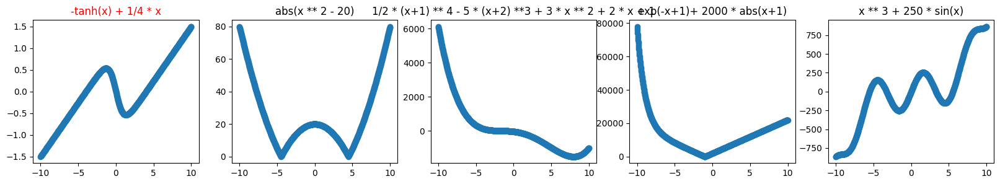

Question  1


/tmp/ipykernel_101807/1061528540.py:26: RuntimeWarning: divide by zero encountered in log
  (lambda x: np.log(x+10) + 1/3 * x , 'log(x+10) + 1/3 * x '),


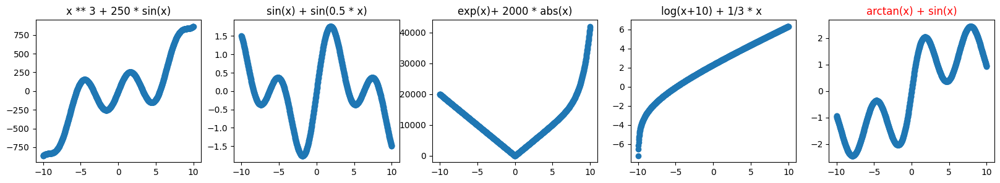

Question  2


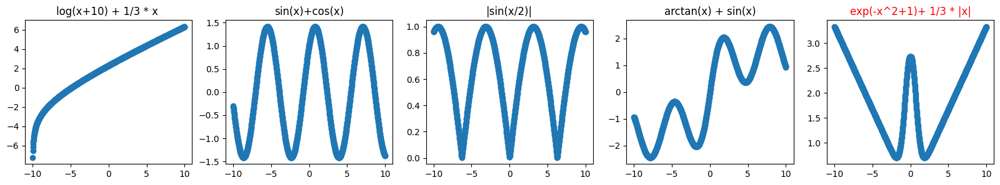

Question  3


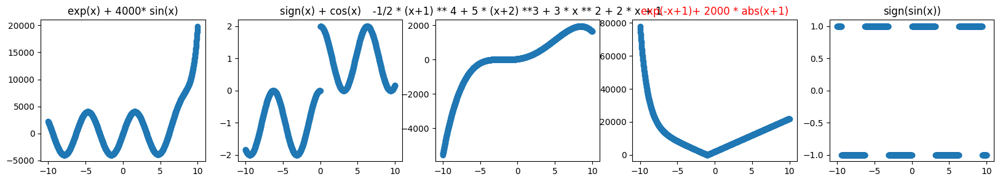

Question  4


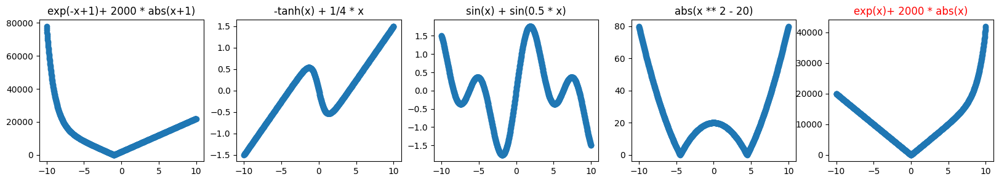

Question  5


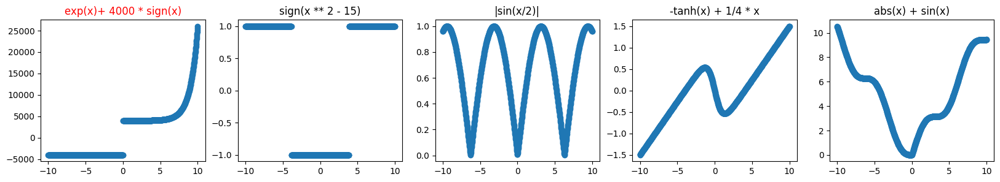

Question  6


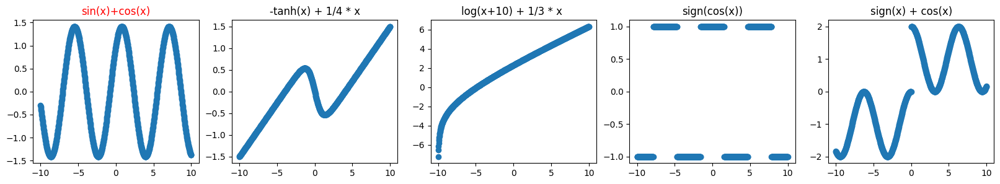

Question  7


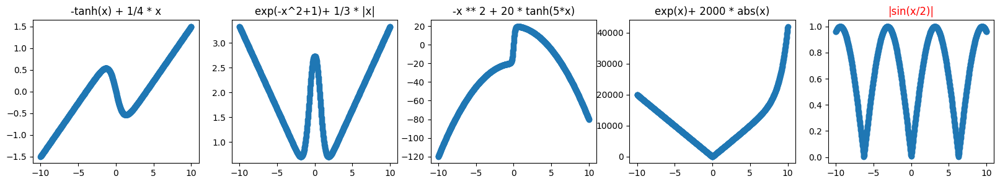

Question  8


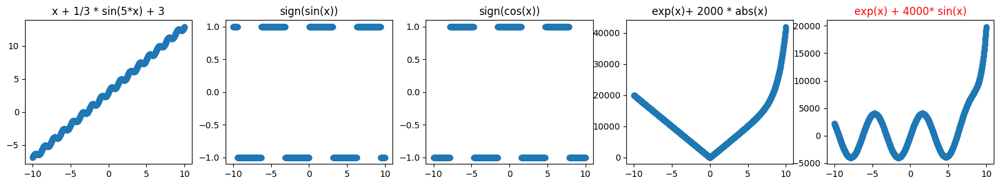

Question  9


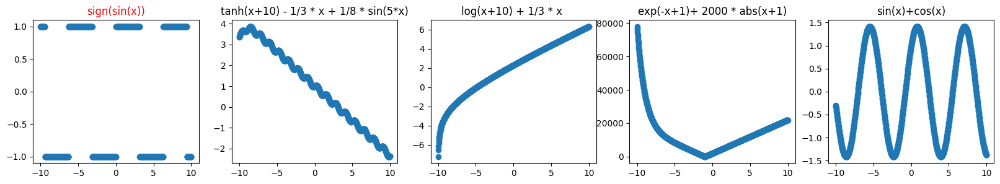

Question  10


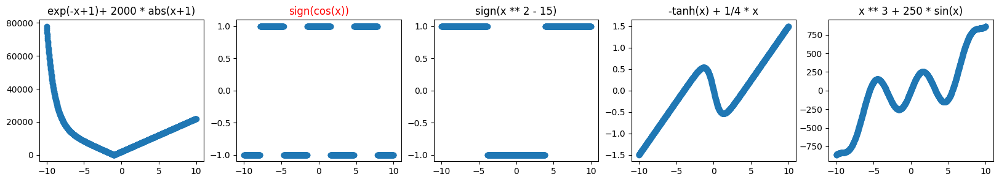

Question  11


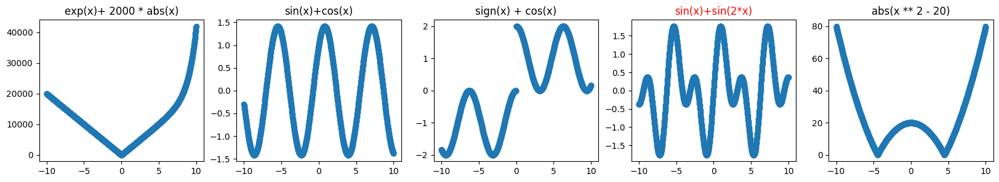

Question  12


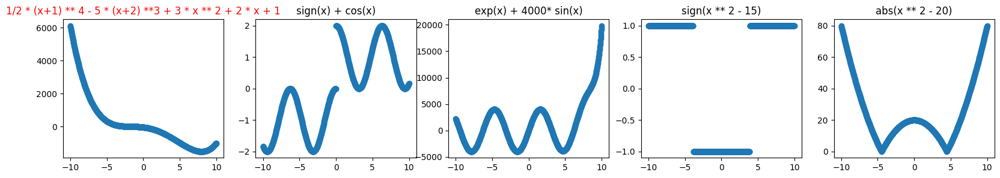

Question  13


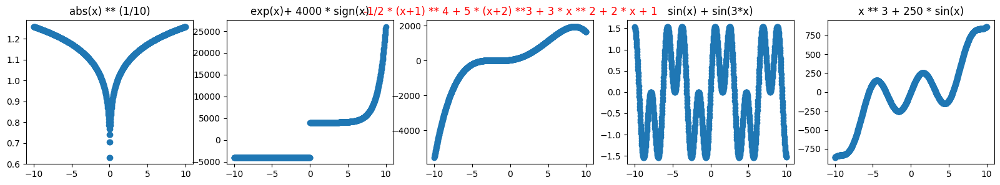

Question  14


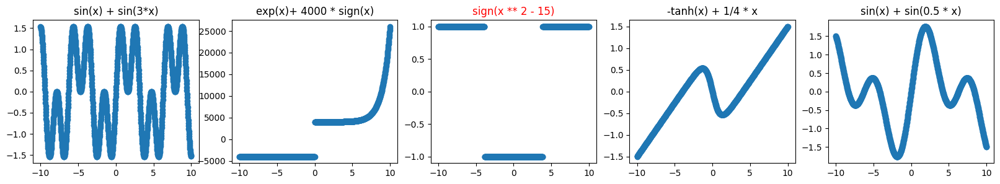

Question  15


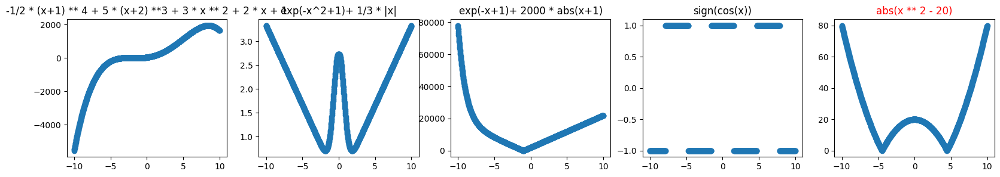

Question  16


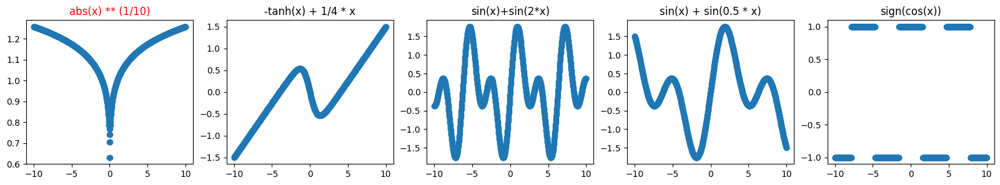

Question  17


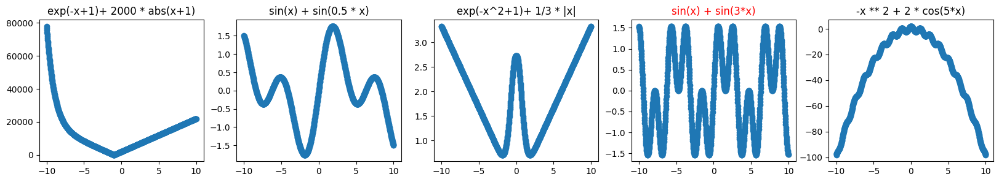

Question  18


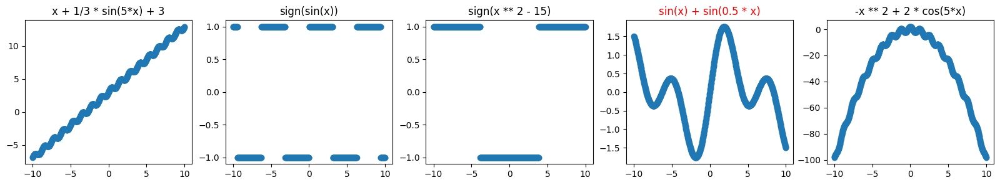

Question  19


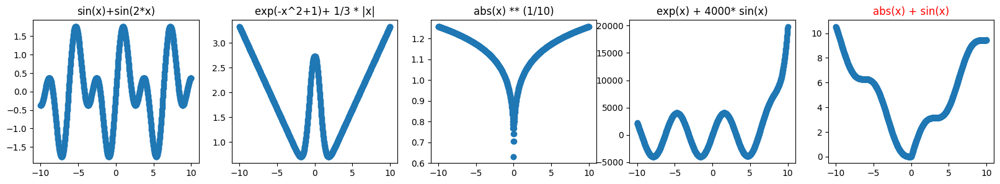

Question  20


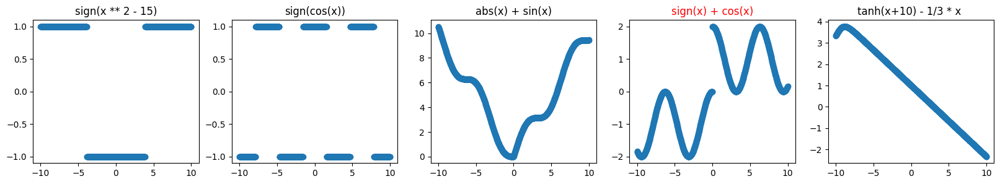

Question  21


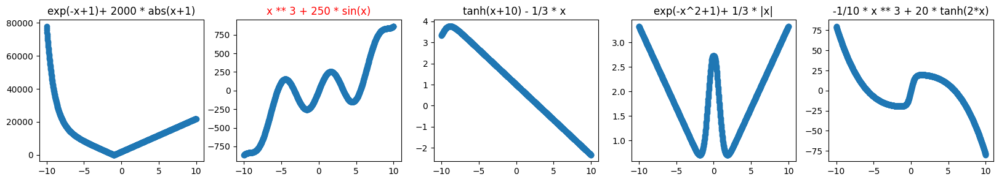

Question  22


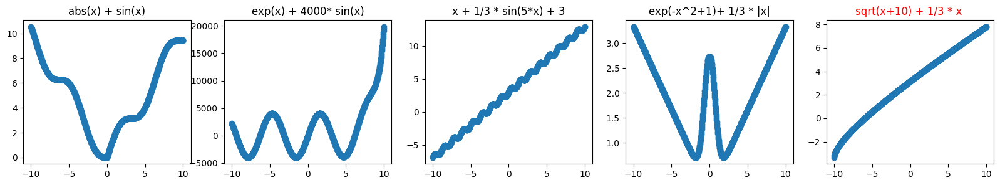

Question  23


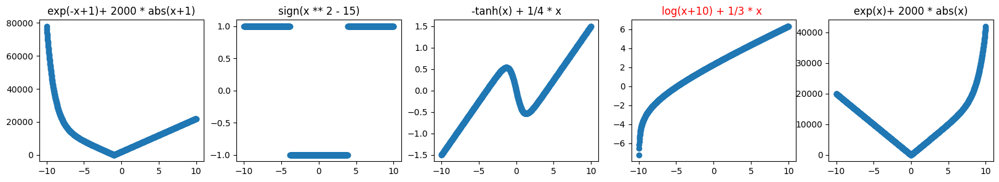

Question  24


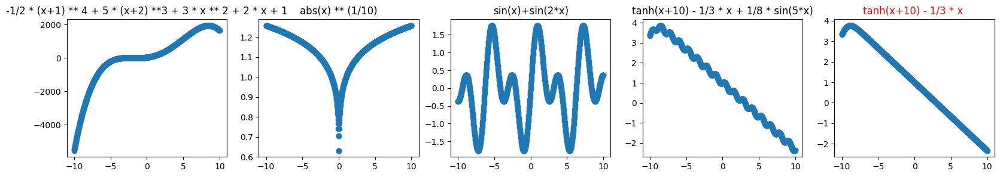

Question  25


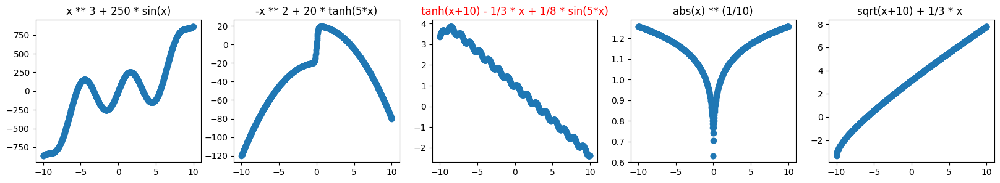

Question  26


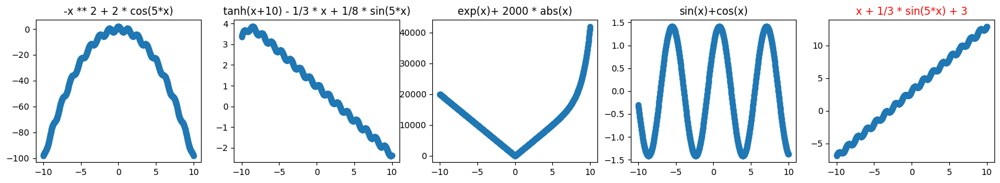

Question  27


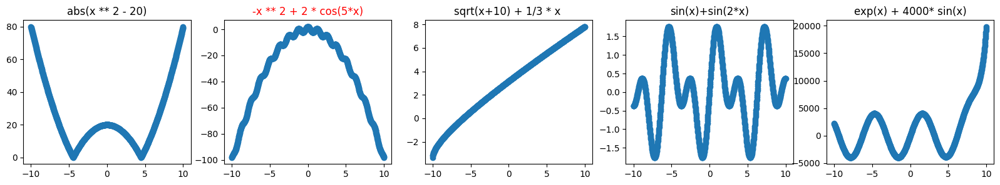

Question  28


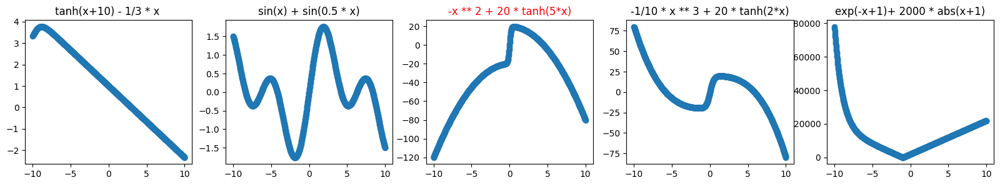

Question  29


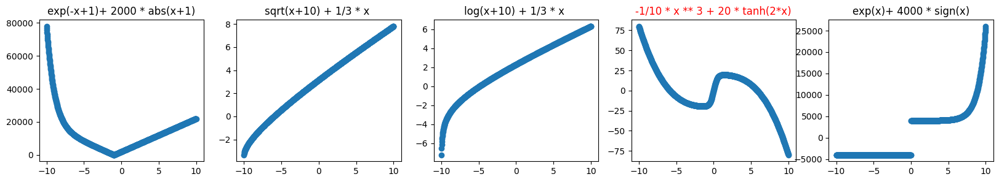

In [118]:
# first, randomly select the other multiple choice options
np.random.seed(0)
fbench_hard_questions = []
for idx, _ in enumerate(fbench_hard):
    mc_options = [idx]
    # select 4 more random functions
    for _ in range(4):
        random_idx = np.random.randint(0, len(fbench_hard))
        while random_idx in mc_options:
            random_idx = np.random.randint(0, len(fbench_hard))
        mc_options.append(random_idx)
    # shuffle options
    np.random.shuffle(mc_options)
    # store the options and the correct answer
    fbench_hard_questions.append((mc_options, idx))

# plot the 5 functions for each question
# make a 1x5 grid of plots
for idx, (options, correct) in enumerate(fbench_hard_questions):
    fig, axes = plt.subplots(1, 5, figsize=(20, 3))
    print('Question ', idx)
    for i, ax in enumerate(axes):
        f, n = fbench_hard[options[i]]
        y = f(x)
        ax.scatter(x, y)
        ax.set_title(n)
        # if it is the correct one, set the title color to red
        if options[i] == correct:
            ax.title.set_color('red')
    plt.show()

# Fit EBMs to the functions and convert the EBM graphs to text

In [119]:
# run this for hard, otherwise standard
fbench = fbench_hard
fbench_questions = fbench_hard_questions

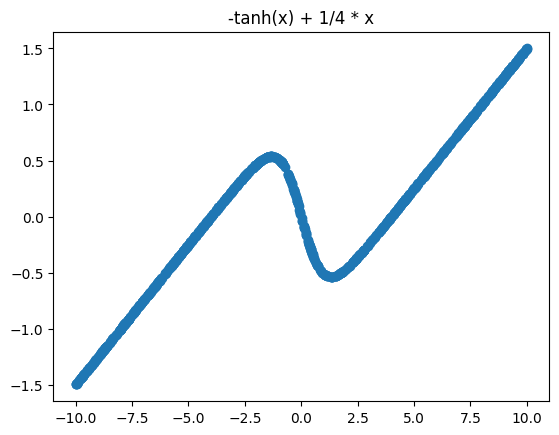

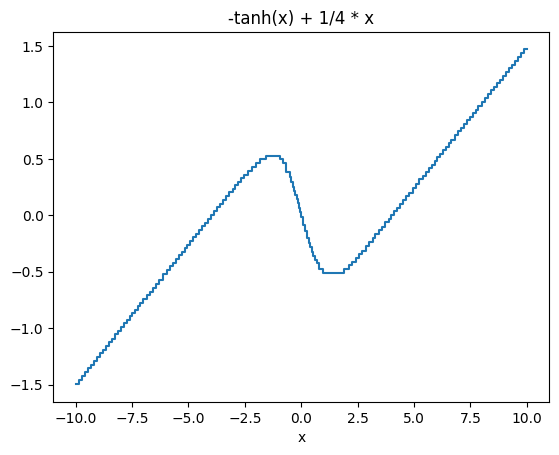

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.99, -9.87)": -1.497, "(-9.87, -9.71)": -1.461, "(-9.71, -9.58)": -1.423, "(-9.58, -9.45)": -1.393, "(-9.45, -9.32)": -1.358, "(-9.32, -9.17)": -1.326, "(-9.17, -9.05)": -1.287, "(-9.05, -8.9)": -1.257, "(-8.9, -8.79)": -1.223, "(-8.79, -8.67)": -1.193, "(-8.67, -8.54)": -1.163, "(-8.54, -8.38)": -1.126, "(-8.38, -8.25)": -1.095, "(-8.25, -8.13)": -1.054, "(-8.13, -7.97)": -1.023, "(-7.97, -7.84)": -0.989, "(-7.84, -7.72)": -0.958, "(-7.72, -7.6)": -0.927, "(-7.6, -7.49)": -0.896, "(-7.49, -7.35)": -0.866, "(-7.35, -7.24)": -0.836, "(-7.24, -7.13)": -0.806, "(-7.13, -7.0)": -0.776, "(-7.0, -6.84)": -0.746, "(-6.84, -6.72)": -0.707, "(-6.72, -6.59)": -0.676, "(-6.59, -6.44)": -0.643, "(-6.44, -6.29)": -0.608, "(-6.29, -6.12)": -0.574, "(-6.12, -5.97)": -0.521, "(-5.97, -5.82)": -0.485, "(-5.82, -

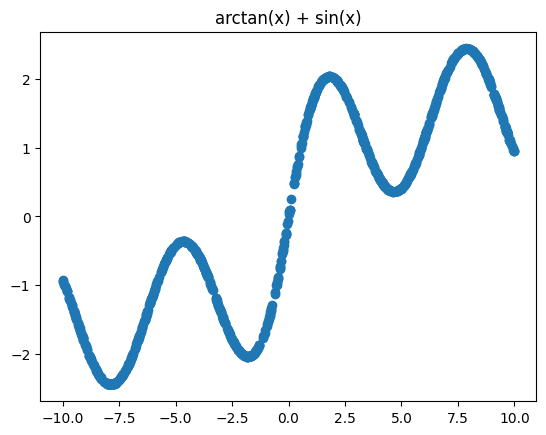

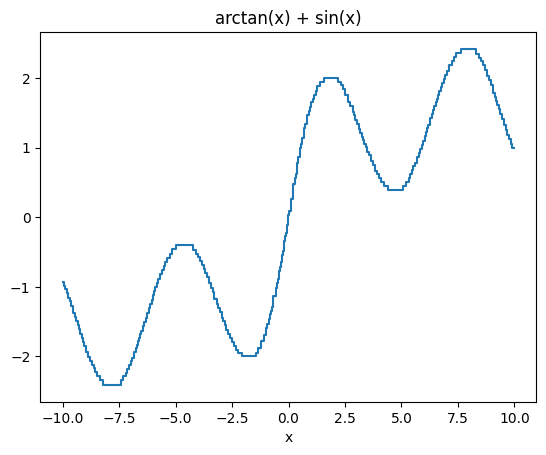

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-10.0, -9.95)": -0.937, "(-9.95, -9.89)": -0.986, "(-9.89, -9.82)": -1.035, "(-9.82, -9.77)": -1.088, "(-9.77, -9.69)": -1.157, "(-9.69, -9.62)": -1.211, "(-9.62, -9.54)": -1.282, "(-9.54, -9.46)": -1.374, "(-9.46, -9.41)": -1.434, "(-9.41, -9.34)": -1.493, "(-9.34, -9.29)": -1.55, "(-9.29, -9.23)": -1.603, "(-9.23, -9.16)": -1.671, "(-9.16, -9.1)": -1.729, "(-9.1, -9.05)": -1.79, "(-9.05, -8.95)": -1.854, "(-8.95, -8.88)": -1.932, "(-8.88, -8.78)": -2.008, "(-8.78, -8.72)": -2.07, "(-8.72, -8.63)": -2.119, "(-8.63, -8.59)": -2.172, "(-8.59, -8.46)": -2.221, "(-8.46, -8.36)": -2.284, "(-8.36, -8.22)": -2.334, "(-8.22, -7.43)": -2.403, "(-7.43, -7.32)": -2.339, "(-7.32, -7.22)": -2.288, "(-7.22, -7.15)": -2.231, "(-7.15, -7.06)": -2.178, "(-7.06, -6.98)": -2.126, "(-6.98, -6.92)": -2.068, "(-6.92, 

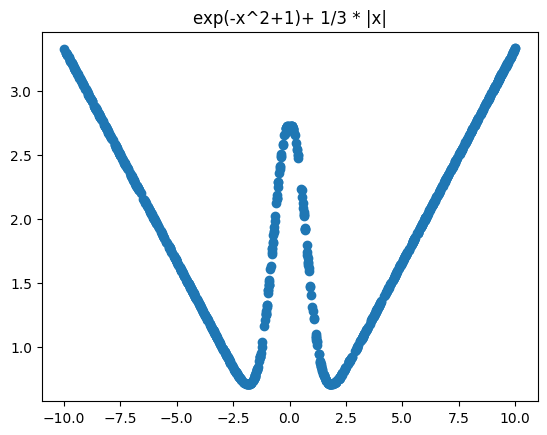

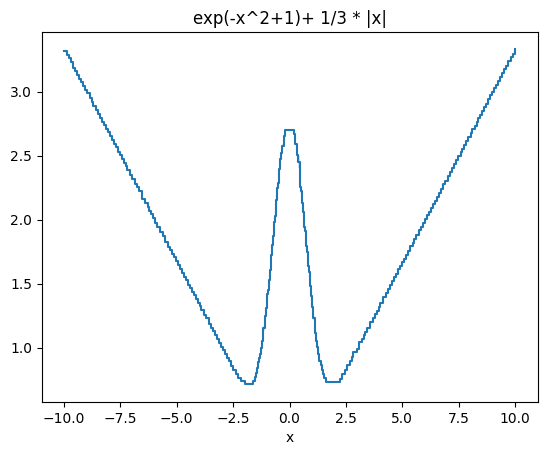

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.87)": 3.314, "(-9.87, -9.79)": 3.286, "(-9.79, -9.7)": 3.26, "(-9.7, -9.59)": 3.228, "(-9.59, -9.49)": 3.187, "(-9.49, -9.4)": 3.159, "(-9.4, -9.31)": 3.131, "(-9.31, -9.23)": 3.099, "(-9.23, -9.14)": 3.072, "(-9.14, -9.04)": 3.044, "(-9.04, -8.97)": 3.012, "(-8.97, -8.86)": 2.985, "(-8.86, -8.77)": 2.949, "(-8.77, -8.7)": 2.916, "(-8.7, -8.58)": 2.887, "(-8.58, -8.47)": 2.855, "(-8.47, -8.39)": 2.825, "(-8.39, -8.3)": 2.795, "(-8.3, -8.22)": 2.762, "(-8.22, -8.14)": 2.735, "(-8.14, -8.05)": 2.708, "(-8.05, -7.97)": 2.681, "(-7.97, -7.89)": 2.653, "(-7.89, -7.8)": 2.624, "(-7.8, -7.7)": 2.591, "(-7.7, -7.61)": 2.564, "(-7.61, -7.52)": 2.532, "(-7.52, -7.42)": 2.504, "(-7.42, -7.33)": 2.473, "(-7.33, -7.26)": 2.445, "(-7.26, -7.18)": 2.415, "(-7.18, -7.06)": 2.387, "(-7.06, -6.97)": 2.347

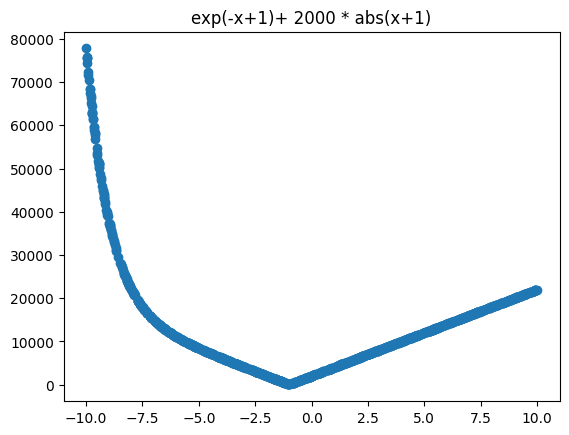

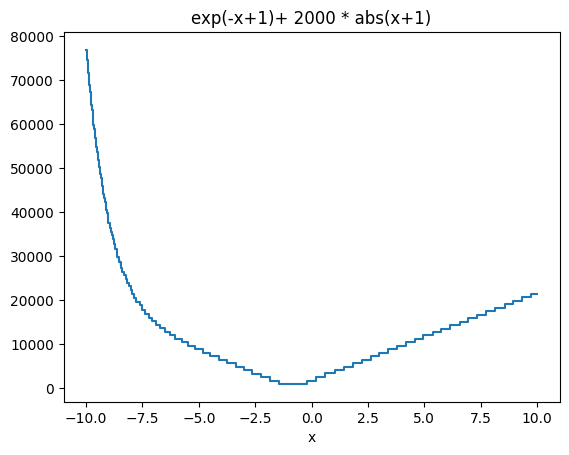

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-10.0, -9.96)": 76762.2, "(-9.96, -9.95)": 75826.3, "(-9.95, -9.92)": 74501.1, "(-9.92, -9.9)": 72352.3, "(-9.9, -9.89)": 71545.1, "(-9.89, -9.86)": 70589.9, "(-9.86, -9.83)": 68904.8, "(-9.83, -9.8)": 67406.0, "(-9.8, -9.78)": 66299.7, "(-9.78, -9.76)": 65251.4, "(-9.76, -9.74)": 64255.3, "(-9.74, -9.71)": 63153.3, "(-9.71, -9.67)": 61481.3, "(-9.67, -9.64)": 59819.7, "(-9.64, -9.62)": 58864.1, "(-9.62, -9.6)": 58094.2, "(-9.6, -9.56)": 56863.7, "(-9.56, -9.52)": 54777.6, "(-9.52, -9.48)": 53718.5, "(-9.48, -9.45)": 51928.8, "(-9.45, -9.42)": 51156.2, "(-9.42, -9.39)": 50275.9, "(-9.39, -9.36)": 48774.3, "(-9.36, -9.31)": 47849.6, "(-9.31, -9.27)": 46019.8, "(-9.27, -9.24)": 45048.1, "(-9.24, -9.2)": 44105.6, "(-9.2, -9.18)": 43202.1, "(-9.18, -9.12)": 42291.4, "(-9.12, -9.07)": 40595.1, "(-9.07,

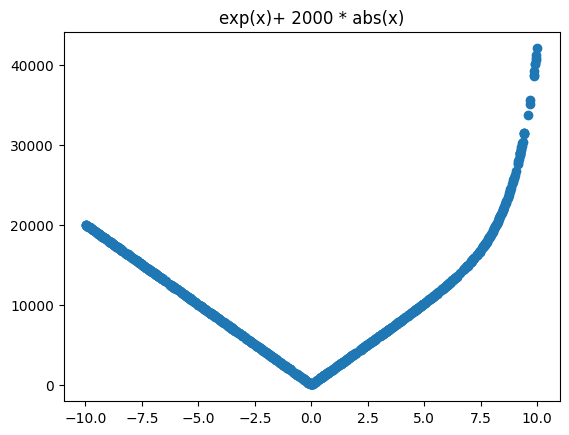

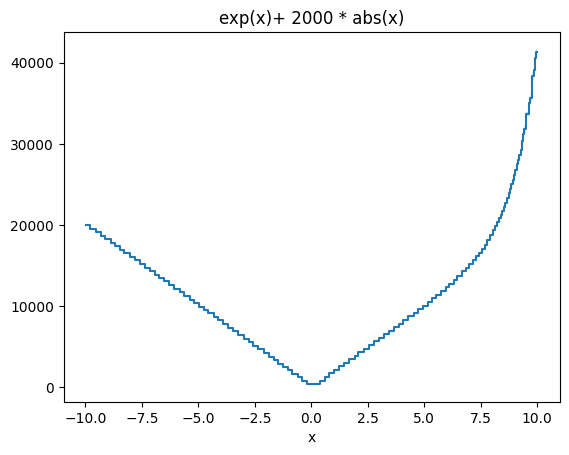

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.97, -9.79)": 19943.2, "(-9.79, -9.55)": 19525.0, "(-9.55, -9.33)": 19072.4, "(-9.33, -9.12)": 18627.6, "(-9.12, -8.89)": 18205.0, "(-8.89, -8.7)": 17779.6, "(-8.7, -8.48)": 17356.8, "(-8.48, -8.28)": 16942.0, "(-8.28, -8.04)": 16477.6, "(-8.04, -7.82)": 16049.9, "(-7.82, -7.6)": 15621.4, "(-7.6, -7.38)": 15192.4, "(-7.38, -7.16)": 14732.2, "(-7.16, -6.93)": 14296.5, "(-6.93, -6.74)": 13856.0, "(-6.74, -6.53)": 13437.0, "(-6.53, -6.28)": 13015.5, "(-6.28, -6.06)": 12536.5, "(-6.06, -5.83)": 12099.9, "(-5.83, -5.62)": 11652.4, "(-5.62, -5.39)": 11214.6, "(-5.39, -5.18)": 10783.3, "(-5.18, -4.96)": 10352.6, "(-4.96, -4.75)": 9916.8, "(-4.75, -4.55)": 9495.8, "(-4.55, -4.32)": 9079.7, "(-4.32, -4.11)": 8630.5, "(-4.11, -3.89)": 8201.0, "(-3.89, -3.67)": 7765.7, "(-3.67, -3.46)": 7315.9, "(-3.46, -3

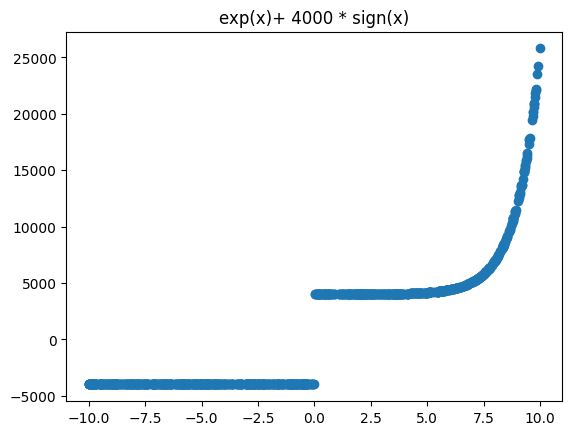

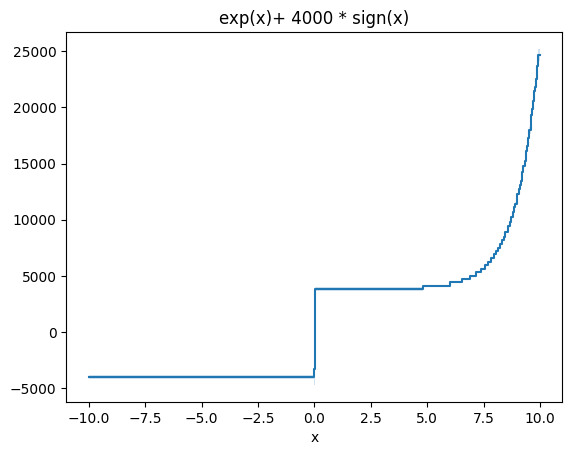

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.99, -0.02)": -4014.4, "(-0.02, 0.02)": -3307.1, "(0.02, 0.04)": 3335.1, "(0.04, 4.81)": 3842.4, "(4.81, 6.03)": 4130.5, "(6.03, 6.55)": 4430.9, "(6.55, 6.89)": 4727.1, "(6.89, 7.18)": 5022.4, "(7.18, 7.38)": 5326.1, "(7.38, 7.56)": 5627.0, "(7.56, 7.72)": 5942.1, "(7.72, 7.82)": 6233.0, "(7.82, 7.97)": 6564.7, "(7.97, 8.06)": 6904.3, "(8.06, 8.15)": 7214.2, "(8.15, 8.23)": 7521.4, "(8.23, 8.33)": 7820.8, "(8.33, 8.4)": 8153.8, "(8.4, 8.47)": 8474.6, "(8.47, 8.58)": 8903.5, "(8.58, 8.66)": 9470.1, "(8.66, 8.73)": 9804.3, "(8.73, 8.8)": 10280.5, "(8.8, 8.84)": 10671.8, "(8.84, 8.91)": 11120.7, "(8.91, 8.97)": 11411.5, "(8.97, 9.06)": 12273.1, "(9.06, 9.1)": 12727.8, "(9.1, 9.14)": 13109.7, "(9.14, 9.21)": 13492.2, "(9.21, 9.26)": 14207.0, "(9.26, 9.31)": 14778.9, "(9.31, 9.36)": 15225.2, "(9.36, 

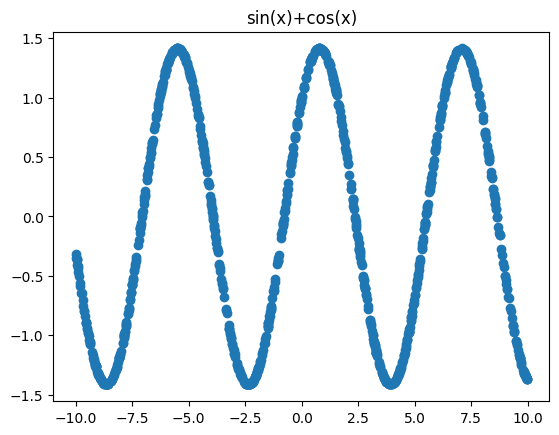

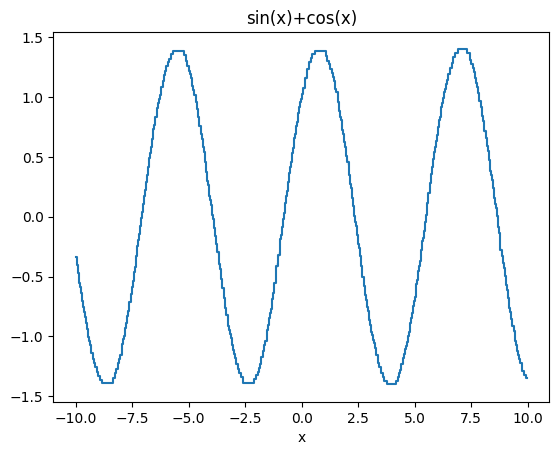

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.95)": -0.338, "(-9.95, -9.93)": -0.373, "(-9.93, -9.9)": -0.406, "(-9.9, -9.88)": -0.439, "(-9.88, -9.86)": -0.468, "(-9.86, -9.83)": -0.499, "(-9.83, -9.79)": -0.553, "(-9.79, -9.76)": -0.587, "(-9.76, -9.71)": -0.641, "(-9.71, -9.67)": -0.704, "(-9.67, -9.63)": -0.752, "(-9.63, -9.59)": -0.795, "(-9.59, -9.55)": -0.835, "(-9.55, -9.5)": -0.887, "(-9.5, -9.46)": -0.939, "(-9.46, -9.43)": -0.976, "(-9.43, -9.4)": -1.008, "(-9.4, -9.36)": -1.037, "(-9.36, -9.31)": -1.071, "(-9.31, -9.23)": -1.138, "(-9.23, -9.17)": -1.189, "(-9.17, -9.12)": -1.22, "(-9.12, -9.06)": -1.256, "(-9.06, -9.0)": -1.301, "(-9.0, -8.92)": -1.331, "(-8.92, -8.84)": -1.361, "(-8.84, -8.36)": -1.389, "(-8.36, -8.27)": -1.351, "(-8.27, -8.2)": -1.304, "(-8.2, -8.14)": -1.27, "(-8.14, -8.07)": -1.226, "(-8.07, -8.03)"

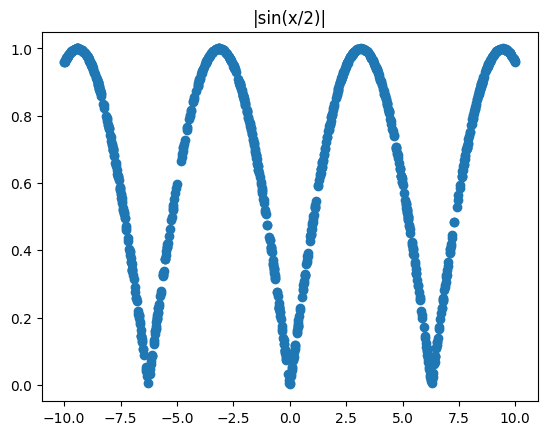

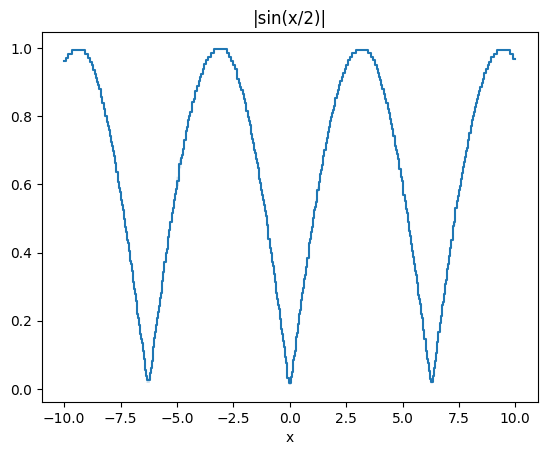

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-10.0, -9.91)": 0.9613, "(-9.91, -9.81)": 0.9715, "(-9.81, -9.67)": 0.9825, "(-9.67, -9.07)": 0.993, "(-9.07, -8.96)": 0.9825, "(-8.96, -8.86)": 0.9714, "(-8.86, -8.79)": 0.9597, "(-8.79, -8.72)": 0.9488, "(-8.72, -8.65)": 0.9355, "(-8.65, -8.59)": 0.9241, "(-8.59, -8.54)": 0.912, "(-8.54, -8.48)": 0.9006, "(-8.48, -8.44)": 0.8902, "(-8.44, -8.39)": 0.8794, "(-8.39, -8.36)": 0.8675, "(-8.36, -8.3)": 0.8567, "(-8.3, -8.23)": 0.8373, "(-8.23, -8.17)": 0.8218, "(-8.17, -8.1)": 0.7993, "(-8.1, -8.05)": 0.783, "(-8.05, -8.02)": 0.7717, "(-8.02, -7.99)": 0.7602, "(-7.99, -7.92)": 0.7426, "(-7.92, -7.87)": 0.7256, "(-7.87, -7.84)": 0.712, "(-7.84, -7.81)": 0.6988, "(-7.81, -7.75)": 0.6841, "(-7.75, -7.71)": 0.6618, "(-7.71, -7.68)": 0.65, "(-7.68, -7.63)": 0.6373, "(-7.63, -7.6)": 0.6228, "(-7.6, -7.57)"

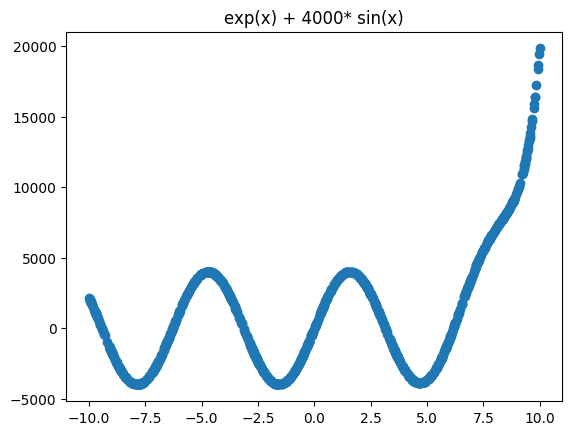

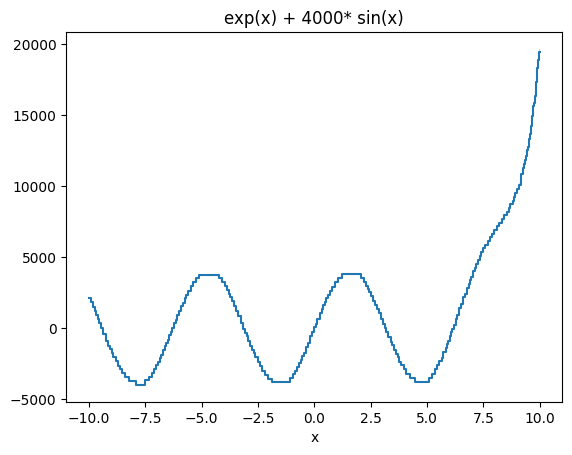

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.99, -9.9)": 2087.2, "(-9.9, -9.82)": 1818.5, "(-9.82, -9.73)": 1469.3, "(-9.73, -9.67)": 1182.0, "(-9.67, -9.6)": 932.1, "(-9.6, -9.52)": 657.2, "(-9.52, -9.45)": 310.8, "(-9.45, -9.35)": 11.0, "(-9.35, -9.24)": -400.9, "(-9.24, -9.14)": -957.3, "(-9.14, -9.04)": -1253.3, "(-9.04, -8.98)": -1501.7, "(-8.98, -8.91)": -1744.7, "(-8.91, -8.8)": -2052.9, "(-8.8, -8.71)": -2345.5, "(-8.71, -8.61)": -2681.5, "(-8.61, -8.51)": -2929.4, "(-8.51, -8.38)": -3210.3, "(-8.38, -8.22)": -3471.7, "(-8.22, -7.9)": -3758.0, "(-7.9, -7.49)": -3997.2, "(-7.49, -7.32)": -3689.3, "(-7.32, -7.2)": -3445.9, "(-7.2, -7.1)": -3150.4, "(-7.1, -7.01)": -2889.1, "(-7.01, -6.93)": -2625.1, "(-6.93, -6.86)": -2389.3, "(-6.86, -6.78)": -2144.2, "(-6.78, -6.72)": -1879.5, "(-6.72, -6.63)": -1556.4, "(-6.63, -6.56)": -1306.4, 

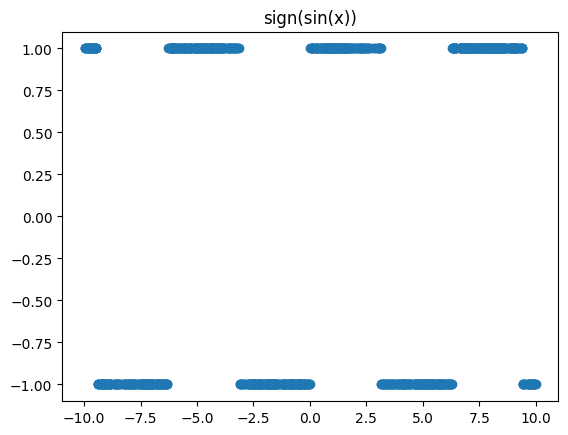

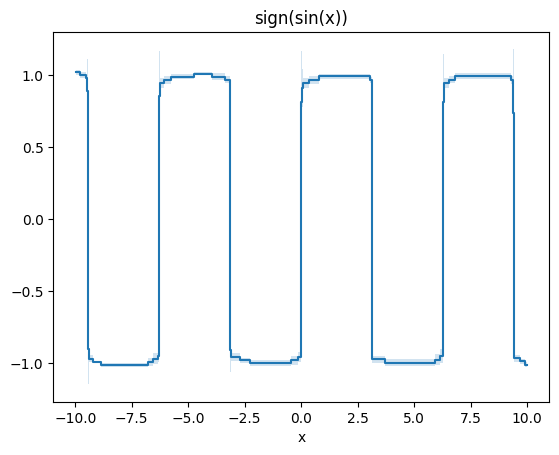

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.97, -9.8)": 1.023, "(-9.8, -9.54)": 1.002, "(-9.54, -9.48)": 0.98, "(-9.48, -9.46)": 0.953, "(-9.46, -9.43)": 0.889, "(-9.43, -9.4)": -0.897, "(-9.4, -9.23)": -0.968, "(-9.23, -8.85)": -0.99, "(-8.85, -6.78)": -1.01, "(-6.78, -6.55)": -0.989, "(-6.55, -6.36)": -0.968, "(-6.36, -6.32)": -0.947, "(-6.32, -6.29)": -0.877, "(-6.29, -6.26)": 0.86, "(-6.26, -6.23)": 0.903, "(-6.23, -6.09)": 0.947, "(-6.09, -5.78)": 0.97, "(-5.78, -4.76)": 0.991, "(-4.76, -3.95)": 1.013, "(-3.95, -3.38)": 0.992, "(-3.38, -3.16)": 0.971, "(-3.16, -3.13)": 0.637, "(-3.13, -3.1)": -0.905, "(-3.1, -2.7)": -0.955, "(-2.7, -2.27)": -0.978, "(-2.27, -0.45)": -1.0, "(-0.45, -0.13)": -0.978, "(-0.13, -0.03)": -0.957, "(-0.03, -0.02)": -0.832, "(-0.02, -0.0)": -0.639, "(-0.0, 0.01)": 0.816, "(0.01, 0.05)": 0.882, "(0.05, 0.08)"

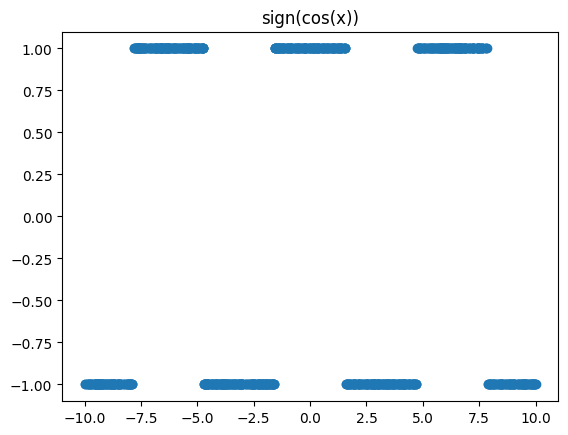

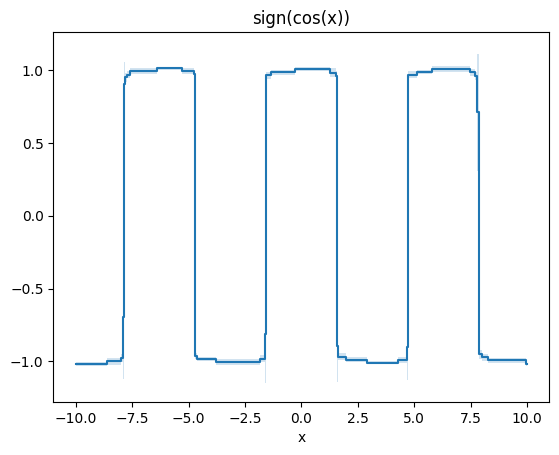

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-10.0, -8.6)": -1.018, "(-8.6, -8.0)": -0.998, "(-8.0, -7.93)": -0.977, "(-7.93, -7.9)": -0.956, "(-7.9, -7.89)": -0.918, "(-7.89, -7.85)": -0.692, "(-7.85, -7.8)": 0.905, "(-7.8, -7.71)": 0.948, "(-7.71, -7.62)": 0.969, "(-7.62, -6.42)": 0.99, "(-6.42, -5.31)": 1.011, "(-5.31, -4.77)": 0.99, "(-4.77, -4.73)": 0.97, "(-4.73, -4.72)": 0.578, "(-4.72, -4.71)": -0.913, "(-4.71, -4.61)": -0.962, "(-4.61, -3.77)": -0.982, "(-3.77, -1.82)": -1.002, "(-1.82, -1.62)": -0.982, "(-1.62, -1.59)": -0.958, "(-1.59, -1.57)": -0.814, "(-1.57, -1.56)": 0.894, "(-1.56, -1.35)": 0.962, "(-1.35, -0.29)": 0.983, "(-0.29, 1.28)": 1.003, "(1.28, 1.55)": 0.982, "(1.55, 1.57)": 0.959, "(1.57, 1.6)": -0.652, "(1.6, 1.62)": -0.897, "(1.62, 1.64)": -0.933, "(1.64, 1.96)": -0.967, "(1.96, 2.9)": -0.987, "(2.9, 4.3)": -1.008,

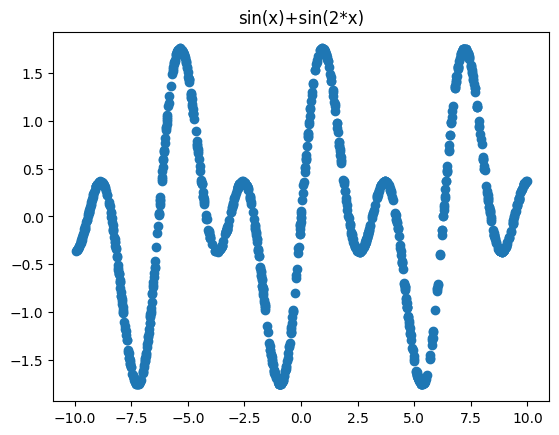

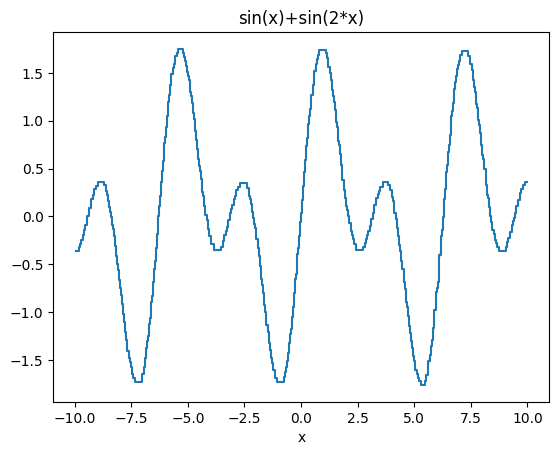

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.94, -9.83)": -0.36, "(-9.83, -9.75)": -0.322, "(-9.75, -9.7)": -0.286, "(-9.7, -9.64)": -0.249, "(-9.64, -9.58)": -0.192, "(-9.58, -9.53)": -0.137, "(-9.53, -9.47)": -0.094, "(-9.47, -9.44)": -0.037, "(-9.44, -9.38)": 0.009, "(-9.38, -9.35)": 0.049, "(-9.35, -9.29)": 0.092, "(-9.29, -9.26)": 0.136, "(-9.26, -9.19)": 0.177, "(-9.19, -9.12)": 0.226, "(-9.12, -9.05)": 0.282, "(-9.05, -8.96)": 0.318, "(-8.96, -8.69)": 0.36, "(-8.69, -8.63)": 0.324, "(-8.63, -8.58)": 0.271, "(-8.58, -8.52)": 0.225, "(-8.52, -8.47)": 0.158, "(-8.47, -8.43)": 0.103, "(-8.43, -8.39)": 0.046, "(-8.39, -8.35)": -0.005, "(-8.35, -8.33)": -0.055, "(-8.33, -8.31)": -0.093, "(-8.31, -8.27)": -0.132, "(-8.27, -8.23)": -0.21, "(-8.23, -8.21)": -0.263, "(-8.21, -8.18)": -0.309, "(-8.18, -8.16)": -0.345, "(-8.16, -8.12)": -0.416

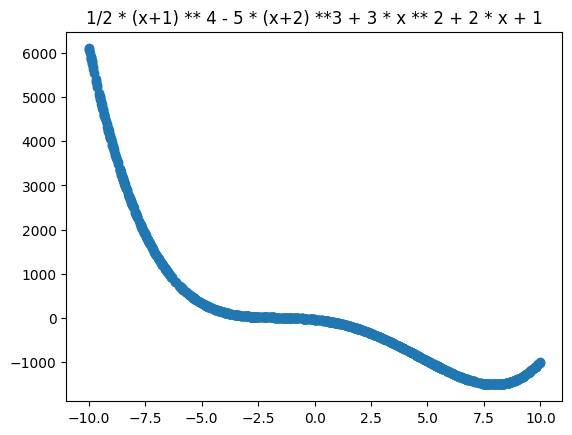

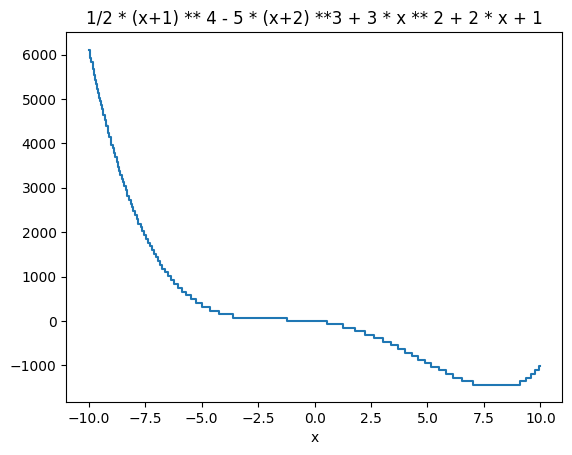

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.99, -9.97)": 6104.5, "(-9.97, -9.93)": 6007.9, "(-9.93, -9.88)": 5921.3, "(-9.88, -9.83)": 5827.6, "(-9.83, -9.78)": 5678.9, "(-9.78, -9.73)": 5535.0, "(-9.73, -9.67)": 5427.1, "(-9.67, -9.63)": 5335.7, "(-9.63, -9.59)": 5229.9, "(-9.59, -9.53)": 5125.3, "(-9.53, -9.49)": 5024.0, "(-9.49, -9.46)": 4944.5, "(-9.46, -9.41)": 4862.1, "(-9.41, -9.36)": 4768.2, "(-9.36, -9.3)": 4635.8, "(-9.3, -9.24)": 4521.1, "(-9.24, -9.17)": 4398.8, "(-9.17, -9.13)": 4311.9, "(-9.13, -9.09)": 4223.6, "(-9.09, -9.04)": 4138.0, "(-9.04, -9.01)": 4055.5, "(-9.01, -8.95)": 3971.1, "(-8.95, -8.9)": 3885.3, "(-8.9, -8.84)": 3778.7, "(-8.84, -8.78)": 3690.5, "(-8.78, -8.72)": 3572.9, "(-8.72, -8.67)": 3466.6, "(-8.67, -8.6)": 3385.1, "(-8.6, -8.53)": 3290.3, "(-8.53, -8.48)": 3202.0, "(-8.48, -8.43)": 3122.9, "(-8.43, -

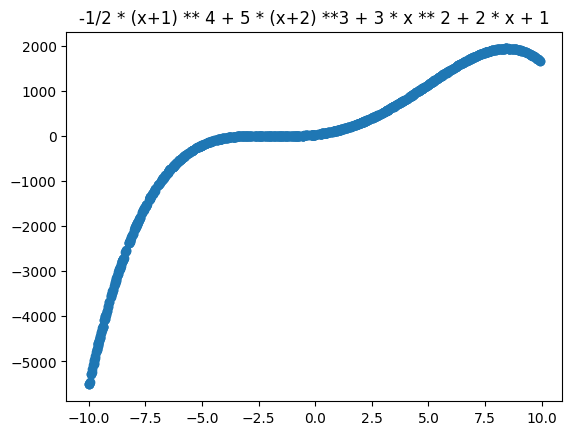

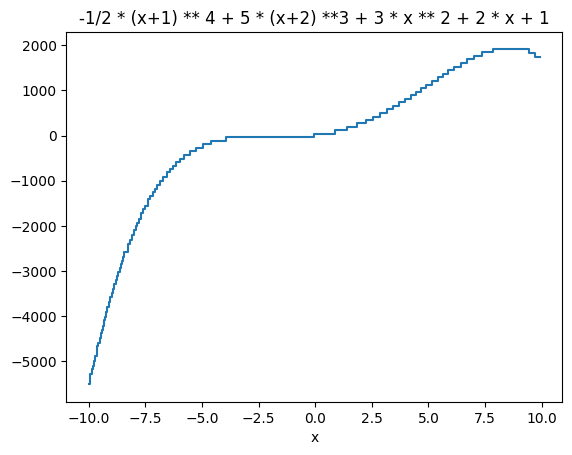

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.92)": -5507.9, "(-9.92, -9.85)": -5293.4, "(-9.85, -9.81)": -5177.9, "(-9.81, -9.76)": -5098.0, "(-9.76, -9.71)": -4999.9, "(-9.71, -9.65)": -4874.7, "(-9.65, -9.61)": -4764.6, "(-9.61, -9.57)": -4672.9, "(-9.57, -9.52)": -4598.0, "(-9.52, -9.47)": -4482.5, "(-9.47, -9.43)": -4384.3, "(-9.43, -9.38)": -4303.4, "(-9.38, -9.34)": -4219.4, "(-9.34, -9.28)": -4097.4, "(-9.28, -9.22)": -4016.0, "(-9.22, -9.17)": -3903.1, "(-9.17, -9.11)": -3794.3, "(-9.11, -9.05)": -3697.8, "(-9.05, -8.98)": -3584.8, "(-8.98, -8.93)": -3480.1, "(-8.93, -8.86)": -3402.0, "(-8.86, -8.8)": -3283.9, "(-8.8, -8.75)": -3193.9, "(-8.75, -8.69)": -3102.0, "(-8.69, -8.63)": -3024.1, "(-8.63, -8.57)": -2940.6, "(-8.57, -8.51)": -2845.5, "(-8.51, -8.47)": -2770.0, "(-8.47, -8.42)": -2689.2, "(-8.42, -8.28)": -2580.3, "(

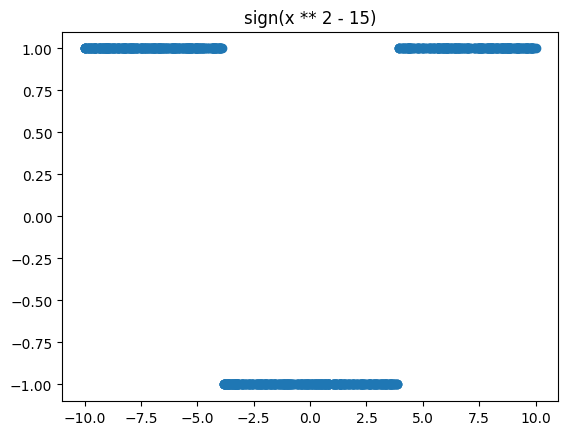

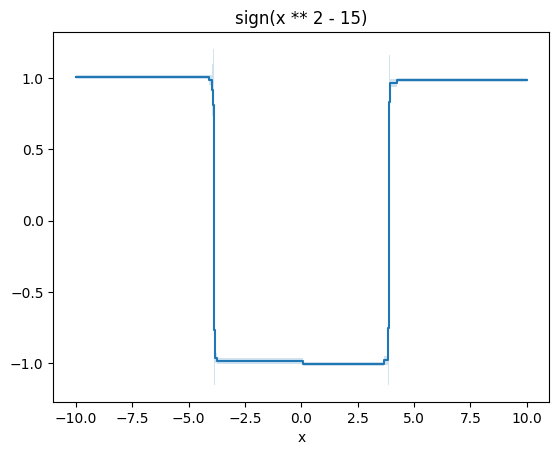

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-10.0, -4.08)": 1.006, "(-4.08, -3.97)": 0.986, "(-3.97, -3.94)": 0.917, "(-3.94, -3.87)": 0.808, "(-3.87, -3.82)": -0.767, "(-3.82, -3.74)": -0.964, "(-3.74, 0.09)": -0.986, "(0.09, 3.67)": -1.006, "(3.67, 3.86)": -0.98, "(3.86, 3.87)": -0.96, "(3.87, 3.9)": -0.755, "(3.9, 3.94)": 0.835, "(3.94, 4.22)": 0.967, "(4.22, 10.0)": 0.988}



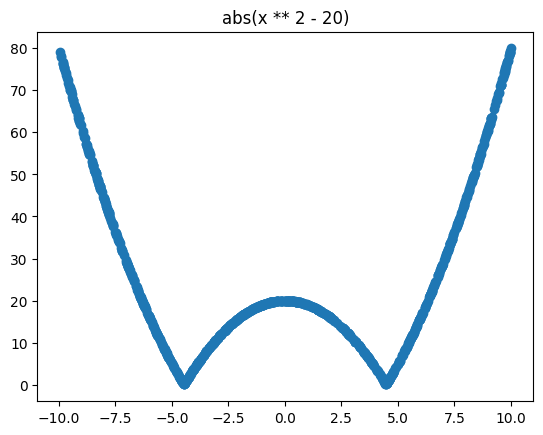

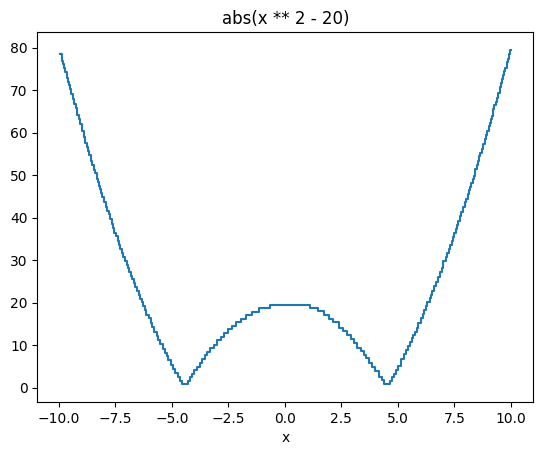

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.96, -9.86)": 78.59, "(-9.86, -9.81)": 76.87, "(-9.81, -9.76)": 76.02, "(-9.76, -9.71)": 75.17, "(-9.71, -9.65)": 74.14, "(-9.65, -9.6)": 72.89, "(-9.6, -9.56)": 71.88, "(-9.56, -9.49)": 71.08, "(-9.49, -9.45)": 70.17, "(-9.45, -9.39)": 69.02, "(-9.39, -9.34)": 67.86, "(-9.34, -9.27)": 66.82, "(-9.27, -9.21)": 65.68, "(-9.21, -9.13)": 64.23, "(-9.13, -9.07)": 63.29, "(-9.07, -9.0)": 62.01, "(-9.0, -8.91)": 60.27, "(-8.91, -8.83)": 58.93, "(-8.83, -8.76)": 57.42, "(-8.76, -8.7)": 56.59, "(-8.7, -8.65)": 55.66, "(-8.65, -8.59)": 54.8, "(-8.59, -8.52)": 53.38, "(-8.52, -8.46)": 52.43, "(-8.46, -8.4)": 51.26, "(-8.4, -8.33)": 50.4, "(-8.33, -8.27)": 49.12, "(-8.27, -8.21)": 48.31, "(-8.21, -8.17)": 47.51, "(-8.17, -8.13)": 46.7, "(-8.13, -8.07)": 45.74, "(-8.07, -7.99)": 44.74, "(-7.99, -7.92)": 43.

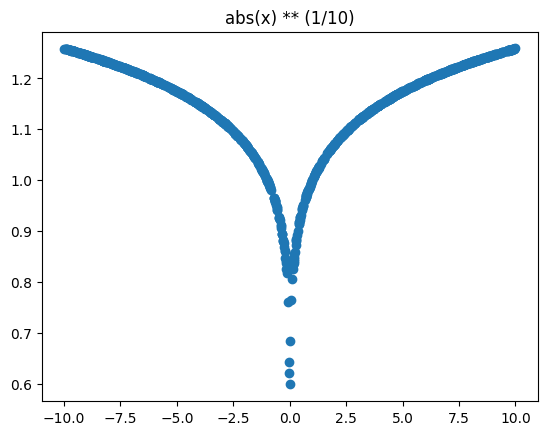

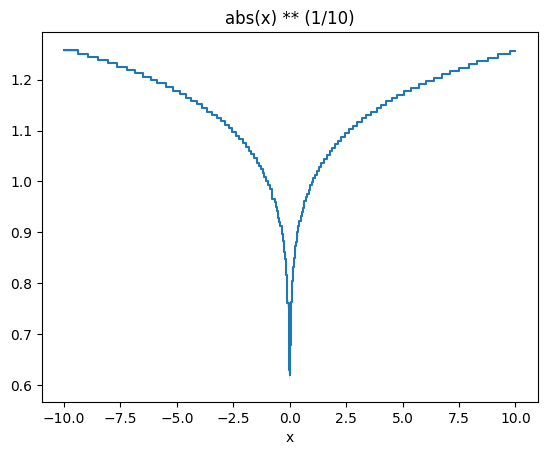

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.39)": 1.2574, "(-9.39, -8.92)": 1.251, "(-8.92, -8.48)": 1.2444, "(-8.48, -8.05)": 1.238, "(-8.05, -7.65)": 1.2316, "(-7.65, -7.22)": 1.2251, "(-7.22, -6.84)": 1.2184, "(-6.84, -6.5)": 1.212, "(-6.5, -6.16)": 1.2055, "(-6.16, -5.86)": 1.1991, "(-5.86, -5.49)": 1.1925, "(-5.49, -5.16)": 1.1846, "(-5.16, -4.86)": 1.1779, "(-4.86, -4.61)": 1.1713, "(-4.61, -4.36)": 1.1645, "(-4.36, -4.1)": 1.158, "(-4.1, -3.88)": 1.1511, "(-3.88, -3.65)": 1.1447, "(-3.65, -3.42)": 1.1372, "(-3.42, -3.23)": 1.1305, "(-3.23, -3.06)": 1.1241, "(-3.06, -2.88)": 1.1177, "(-2.88, -2.71)": 1.111, "(-2.71, -2.54)": 1.1041, "(-2.54, -2.38)": 1.0972, "(-2.38, -2.24)": 1.0901, "(-2.24, -2.08)": 1.0827, "(-2.08, -1.95)": 1.0757, "(-1.95, -1.82)": 1.0686, "(-1.82, -1.69)": 1.06, "(-1.69, -1.59)": 1.0536, "(-1.59, -1.46)

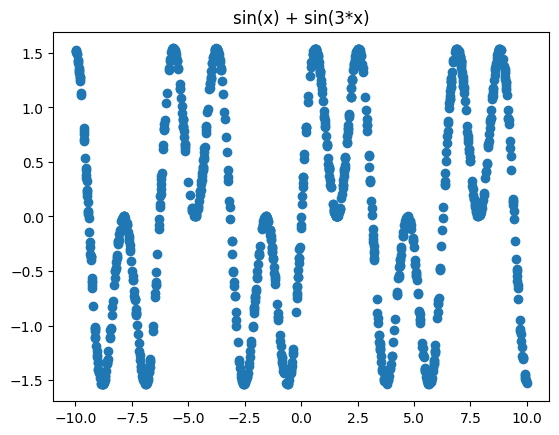

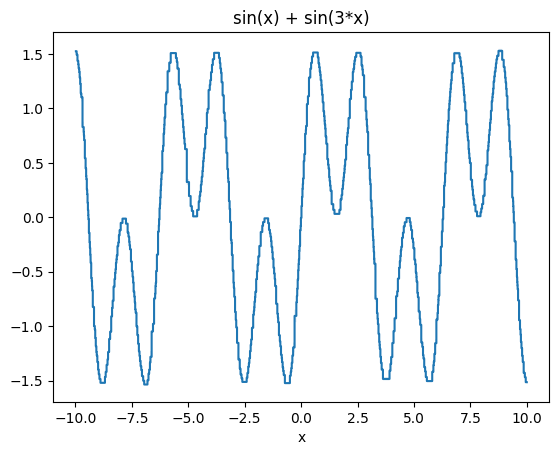

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.95)": 1.524, "(-9.95, -9.91)": 1.492, "(-9.91, -9.88)": 1.436, "(-9.88, -9.86)": 1.404, "(-9.86, -9.83)": 1.368, "(-9.83, -9.81)": 1.334, "(-9.81, -9.79)": 1.281, "(-9.79, -9.77)": 1.225, "(-9.77, -9.74)": 1.138, "(-9.74, -9.69)": 1.102, "(-9.69, -9.63)": 0.829, "(-9.63, -9.63)": 0.784, "(-9.63, -9.62)": 0.752, "(-9.62, -9.58)": 0.709, "(-9.58, -9.55)": 0.542, "(-9.55, -9.53)": 0.448, "(-9.53, -9.52)": 0.381, "(-9.52, -9.5)": 0.349, "(-9.5, -9.48)": 0.254, "(-9.48, -9.46)": 0.212, "(-9.46, -9.45)": 0.133, "(-9.45, -9.43)": 0.067, "(-9.43, -9.43)": 0.021, "(-9.43, -9.4)": -0.018, "(-9.4, -9.38)": -0.142, "(-9.38, -9.36)": -0.229, "(-9.36, -9.35)": -0.281, "(-9.35, -9.33)": -0.342, "(-9.33, -9.33)": -0.373, "(-9.33, -9.3)": -0.417, "(-9.3, -9.28)": -0.557, "(-9.28, -9.27)": -0.588, "(-9.27

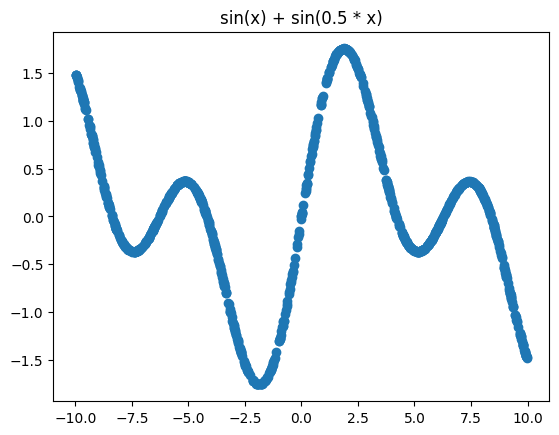

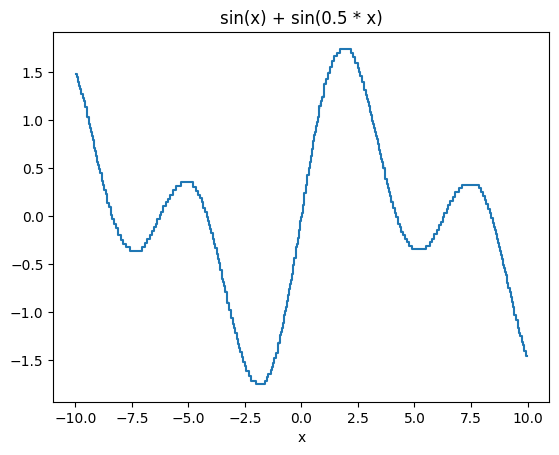

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.97, -9.93)": 1.486, "(-9.93, -9.88)": 1.449, "(-9.88, -9.84)": 1.404, "(-9.84, -9.77)": 1.362, "(-9.77, -9.73)": 1.324, "(-9.73, -9.67)": 1.277, "(-9.67, -9.63)": 1.236, "(-9.63, -9.59)": 1.198, "(-9.59, -9.49)": 1.138, "(-9.49, -9.41)": 1.034, "(-9.41, -9.36)": 0.96, "(-9.36, -9.32)": 0.919, "(-9.32, -9.27)": 0.875, "(-9.27, -9.23)": 0.839, "(-9.23, -9.19)": 0.8, "(-9.19, -9.15)": 0.755, "(-9.15, -9.12)": 0.716, "(-9.12, -9.08)": 0.679, "(-9.08, -9.03)": 0.626, "(-9.03, -8.98)": 0.57, "(-8.98, -8.94)": 0.535, "(-8.94, -8.9)": 0.491, "(-8.9, -8.83)": 0.455, "(-8.83, -8.77)": 0.369, "(-8.77, -8.72)": 0.328, "(-8.72, -8.66)": 0.277, "(-8.66, -8.62)": 0.232, "(-8.62, -8.58)": 0.186, "(-8.58, -8.51)": 0.142, "(-8.51, -8.44)": 0.1, "(-8.44, -8.36)": 0.018, "(-8.36, -8.28)": -0.032, "(-8.28, -8.22)":

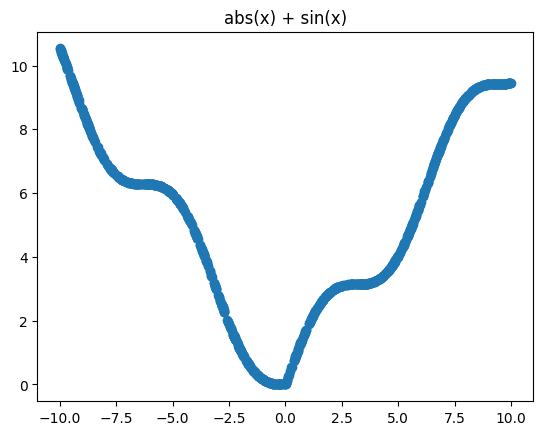

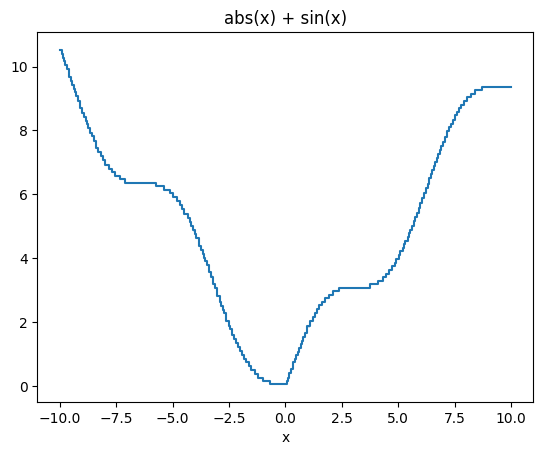

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-10.0, -9.92)": 10.52, "(-9.92, -9.86)": 10.39, "(-9.86, -9.81)": 10.28, "(-9.81, -9.75)": 10.17, "(-9.75, -9.68)": 10.06, "(-9.68, -9.6)": 9.93, "(-9.6, -9.5)": 9.68, "(-9.5, -9.44)": 9.55, "(-9.44, -9.37)": 9.44, "(-9.37, -9.32)": 9.31, "(-9.32, -9.27)": 9.21, "(-9.27, -9.2)": 9.09, "(-9.2, -9.09)": 8.93, "(-9.09, -9.0)": 8.7, "(-9.0, -8.92)": 8.54, "(-8.92, -8.85)": 8.42, "(-8.85, -8.8)": 8.31, "(-8.8, -8.74)": 8.19, "(-8.74, -8.66)": 8.09, "(-8.66, -8.59)": 7.94, "(-8.59, -8.5)": 7.82, "(-8.5, -8.38)": 7.66, "(-8.38, -8.29)": 7.45, "(-8.29, -8.17)": 7.33, "(-8.17, -8.07)": 7.2, "(-8.07, -7.98)": 7.07, "(-7.98, -7.82)": 6.93, "(-7.82, -7.69)": 6.81, "(-7.69, -7.55)": 6.69, "(-7.55, -7.34)": 6.57, "(-7.34, -7.1)": 6.47, "(-7.1, -5.73)": 6.36, "(-5.73, -5.38)": 6.25, "(-5.38, -5.12)": 6.15, "(-5.

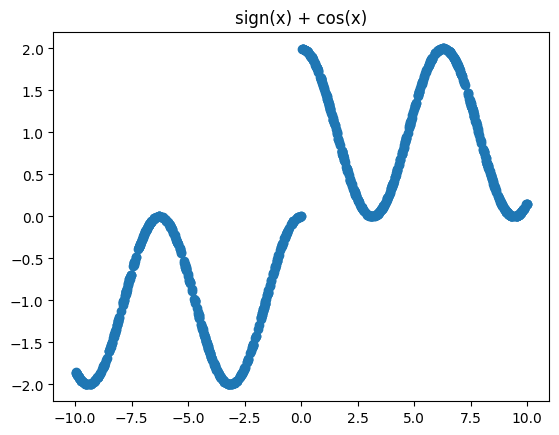

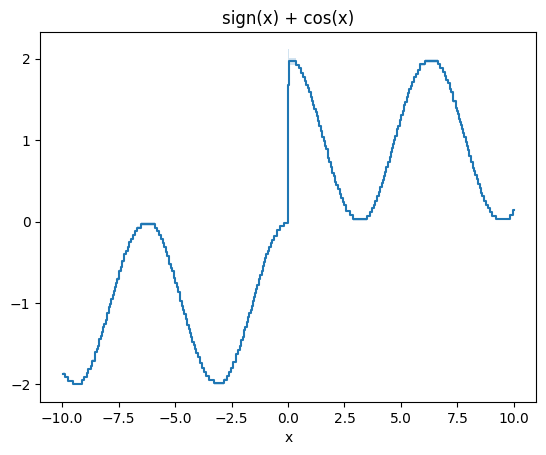

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.97, -9.86)": -1.868, "(-9.86, -9.73)": -1.913, "(-9.73, -9.53)": -1.955, "(-9.53, -9.12)": -1.995, "(-9.12, -9.01)": -1.952, "(-9.01, -8.91)": -1.909, "(-8.91, -8.84)": -1.863, "(-8.84, -8.74)": -1.813, "(-8.74, -8.67)": -1.77, "(-8.67, -8.55)": -1.712, "(-8.55, -8.46)": -1.606, "(-8.46, -8.41)": -1.565, "(-8.41, -8.35)": -1.524, "(-8.35, -8.27)": -1.446, "(-8.27, -8.22)": -1.404, "(-8.22, -8.18)": -1.351, "(-8.18, -8.13)": -1.296, "(-8.13, -8.07)": -1.254, "(-8.07, -8.02)": -1.205, "(-8.02, -7.94)": -1.129, "(-7.94, -7.87)": -1.056, "(-7.87, -7.82)": -1.008, "(-7.82, -7.76)": -0.953, "(-7.76, -7.72)": -0.908, "(-7.72, -7.66)": -0.851, "(-7.66, -7.61)": -0.805, "(-7.61, -7.56)": -0.753, "(-7.56, -7.49)": -0.703, "(-7.49, -7.4)": -0.602, "(-7.4, -7.34)": -0.556, "(-7.34, -7.25)": -0.489, "(-7.25

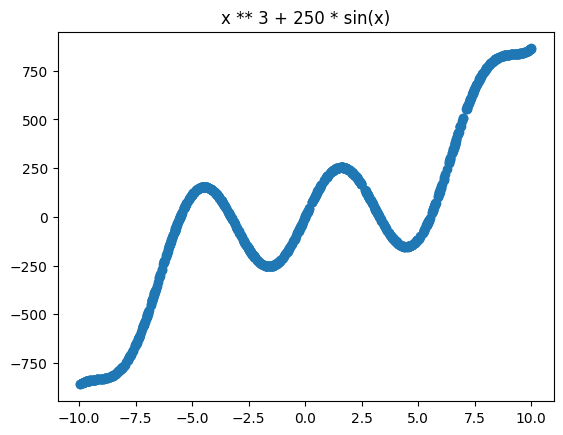

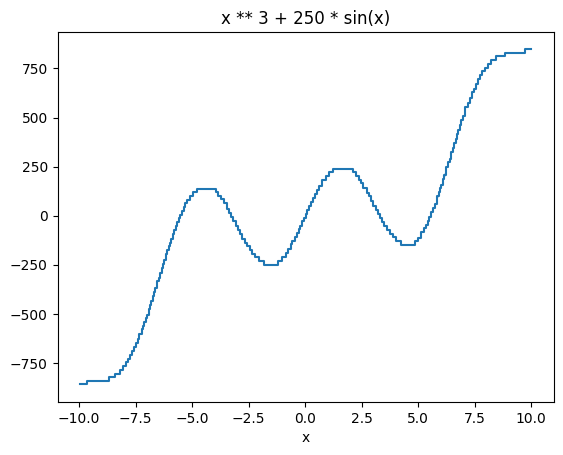

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.96, -9.64)": -859.8, "(-9.64, -8.69)": -842.0, "(-8.69, -8.43)": -823.5, "(-8.43, -8.2)": -805.8, "(-8.2, -8.06)": -786.0, "(-8.06, -7.95)": -764.6, "(-7.95, -7.84)": -746.1, "(-7.84, -7.74)": -728.3, "(-7.74, -7.64)": -710.2, "(-7.64, -7.57)": -687.1, "(-7.57, -7.48)": -666.7, "(-7.48, -7.41)": -649.5, "(-7.41, -7.33)": -627.9, "(-7.33, -7.24)": -603.7, "(-7.24, -7.17)": -578.1, "(-7.17, -7.11)": -559.4, "(-7.11, -7.06)": -540.3, "(-7.06, -6.99)": -522.5, "(-6.99, -6.93)": -503.8, "(-6.93, -6.88)": -477.3, "(-6.88, -6.81)": -453.9, "(-6.81, -6.73)": -433.8, "(-6.73, -6.67)": -409.2, "(-6.67, -6.63)": -391.3, "(-6.63, -6.54)": -369.9, "(-6.54, -6.49)": -334.9, "(-6.49, -6.42)": -315.2, "(-6.42, -6.34)": -290.3, "(-6.34, -6.31)": -267.9, "(-6.31, -6.23)": -243.7, "(-6.23, -6.16)": -223.6, "(-6.1

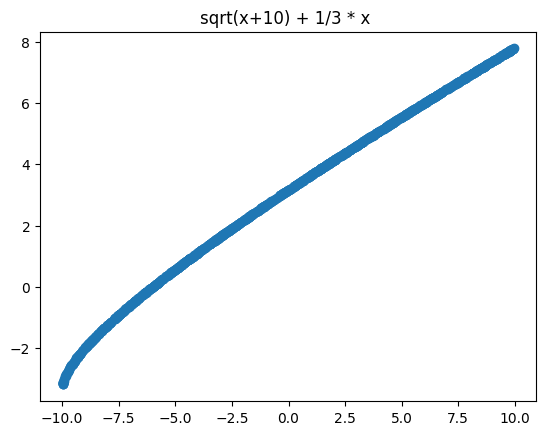

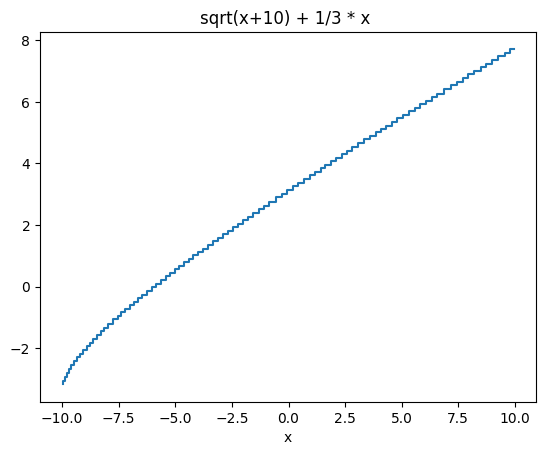

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.94)": -3.18, "(-9.94, -9.89)": -3.06, "(-9.89, -9.81)": -2.93, "(-9.81, -9.7)": -2.81, "(-9.7, -9.59)": -2.67, "(-9.59, -9.47)": -2.54, "(-9.47, -9.35)": -2.42, "(-9.35, -9.21)": -2.29, "(-9.21, -9.07)": -2.18, "(-9.07, -8.92)": -2.05, "(-8.92, -8.79)": -1.94, "(-8.79, -8.64)": -1.82, "(-8.64, -8.47)": -1.71, "(-8.47, -8.3)": -1.57, "(-8.3, -8.14)": -1.45, "(-8.14, -7.96)": -1.34, "(-7.96, -7.77)": -1.21, "(-7.77, -7.55)": -1.07, "(-7.55, -7.4)": -0.95, "(-7.4, -7.21)": -0.84, "(-7.21, -7.02)": -0.72, "(-7.02, -6.83)": -0.61, "(-6.83, -6.64)": -0.49, "(-6.64, -6.45)": -0.38, "(-6.45, -6.27)": -0.26, "(-6.27, -6.05)": -0.15, "(-6.05, -5.84)": -0.02, "(-5.84, -5.65)": 0.09, "(-5.65, -5.43)": 0.21, "(-5.43, -5.21)": 0.33, "(-5.21, -5.02)": 0.44, "(-5.02, -4.83)": 0.56, "(-4.83, -4.61)": 0.6

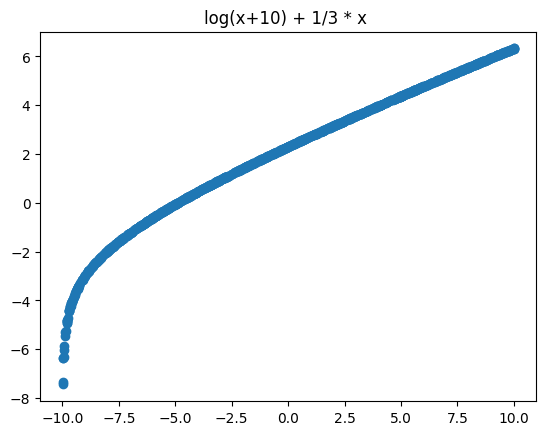

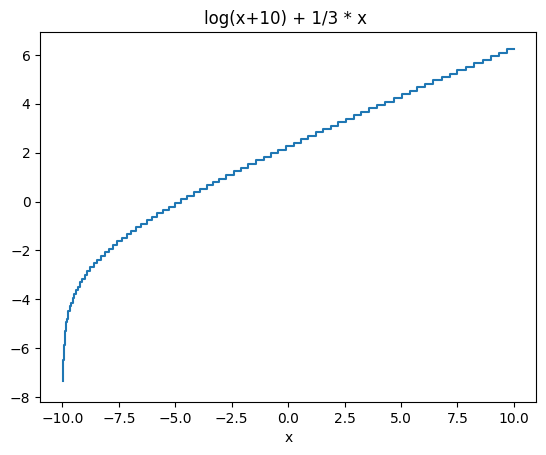

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.97)": -7.32, "(-9.97, -9.95)": -6.48, "(-9.95, -9.94)": -6.27, "(-9.94, -9.93)": -6.03, "(-9.93, -9.9)": -5.86, "(-9.9, -9.87)": -5.49, "(-9.87, -9.84)": -5.3, "(-9.84, -9.79)": -4.94, "(-9.79, -9.73)": -4.79, "(-9.73, -9.67)": -4.46, "(-9.67, -9.62)": -4.28, "(-9.62, -9.55)": -4.13, "(-9.55, -9.47)": -3.95, "(-9.47, -9.41)": -3.76, "(-9.41, -9.32)": -3.63, "(-9.32, -9.22)": -3.48, "(-9.22, -9.11)": -3.3, "(-9.11, -9.01)": -3.16, "(-9.01, -8.89)": -3.0, "(-8.89, -8.77)": -2.84, "(-8.77, -8.61)": -2.67, "(-8.61, -8.47)": -2.53, "(-8.47, -8.31)": -2.38, "(-8.31, -8.13)": -2.24, "(-8.13, -7.95)": -2.07, "(-7.95, -7.77)": -1.93, "(-7.77, -7.58)": -1.78, "(-7.58, -7.37)": -1.63, "(-7.37, -7.15)": -1.49, "(-7.15, -6.96)": -1.33, "(-6.96, -6.74)": -1.19, "(-6.74, -6.5)": -1.05, "(-6.5, -6.27)":

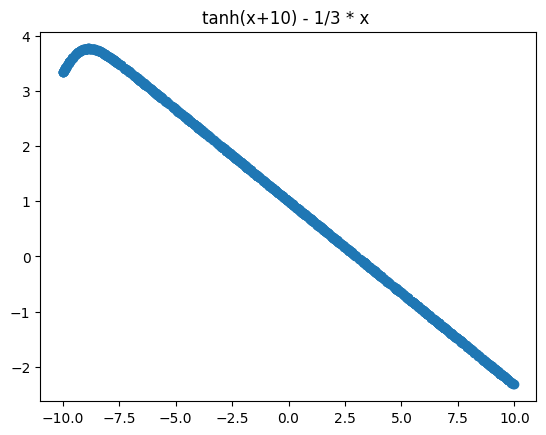

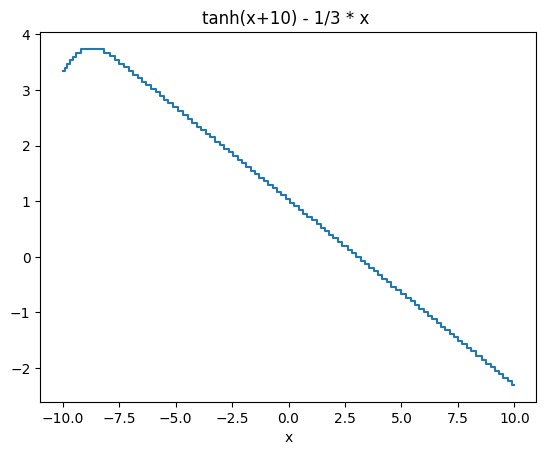

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.99, -9.9)": 3.341, "(-9.9, -9.81)": 3.405, "(-9.81, -9.69)": 3.474, "(-9.69, -9.56)": 3.538, "(-9.56, -9.42)": 3.603, "(-9.42, -9.2)": 3.67, "(-9.2, -8.16)": 3.734, "(-8.16, -7.91)": 3.668, "(-7.91, -7.7)": 3.606, "(-7.7, -7.48)": 3.543, "(-7.48, -7.27)": 3.477, "(-7.27, -7.08)": 3.414, "(-7.08, -6.89)": 3.352, "(-6.89, -6.67)": 3.279, "(-6.67, -6.47)": 3.216, "(-6.47, -6.29)": 3.152, "(-6.29, -6.08)": 3.089, "(-6.08, -5.88)": 3.026, "(-5.88, -5.69)": 2.959, "(-5.69, -5.52)": 2.898, "(-5.52, -5.32)": 2.829, "(-5.32, -5.09)": 2.761, "(-5.09, -4.9)": 2.696, "(-4.9, -4.69)": 2.629, "(-4.69, -4.46)": 2.552, "(-4.46, -4.25)": 2.487, "(-4.25, -4.04)": 2.408, "(-4.04, -3.85)": 2.343, "(-3.85, -3.65)": 2.279, "(-3.65, -3.46)": 2.215, "(-3.46, -3.25)": 2.149, "(-3.25, -3.04)": 2.073, "(-3.04, -2.85)": 2

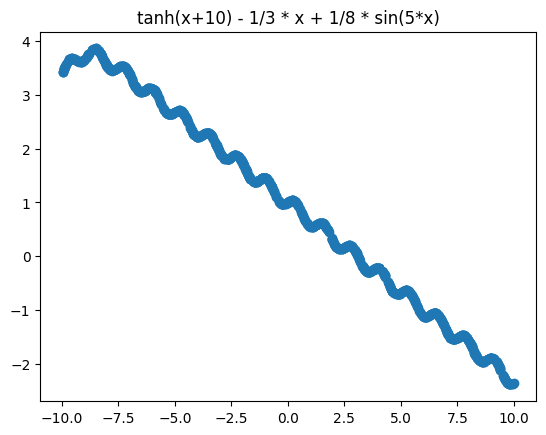

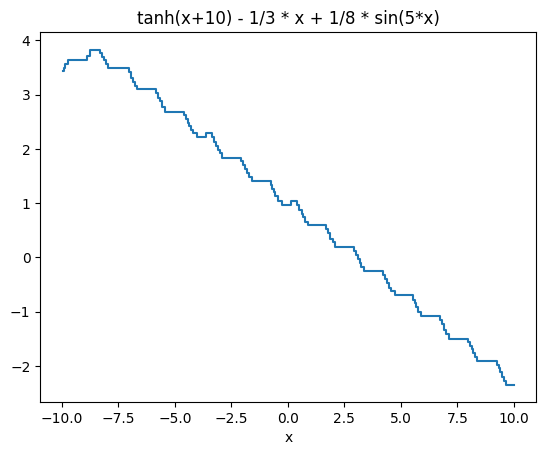

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.96, -9.89)": 3.433, "(-9.89, -9.83)": 3.497, "(-9.83, -9.73)": 3.571, "(-9.73, -8.89)": 3.642, "(-8.89, -8.74)": 3.719, "(-8.74, -8.29)": 3.829, "(-8.29, -8.21)": 3.767, "(-8.21, -8.13)": 3.699, "(-8.13, -8.04)": 3.629, "(-8.04, -7.94)": 3.562, "(-7.94, -7.05)": 3.496, "(-7.05, -6.94)": 3.413, "(-6.94, -6.86)": 3.298, "(-6.86, -6.76)": 3.227, "(-6.76, -6.66)": 3.161, "(-6.66, -5.82)": 3.094, "(-5.82, -5.75)": 3.024, "(-5.75, -5.67)": 2.946, "(-5.67, -5.56)": 2.874, "(-5.56, -5.43)": 2.767, "(-5.43, -4.59)": 2.686, "(-4.59, -4.49)": 2.618, "(-4.49, -4.42)": 2.546, "(-4.42, -4.38)": 2.483, "(-4.38, -4.29)": 2.42, "(-4.29, -4.2)": 2.356, "(-4.2, -4.02)": 2.288, "(-4.02, -3.63)": 2.225, "(-3.63, -3.36)": 2.293, "(-3.36, -3.25)": 2.225, "(-3.25, -3.16)": 2.126, "(-3.16, -3.08)": 2.056, "(-3.08, -3.0

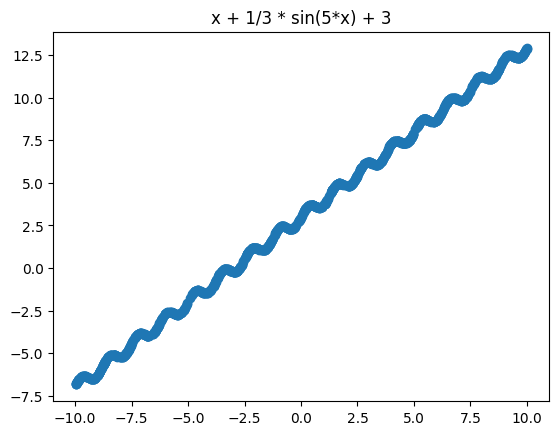

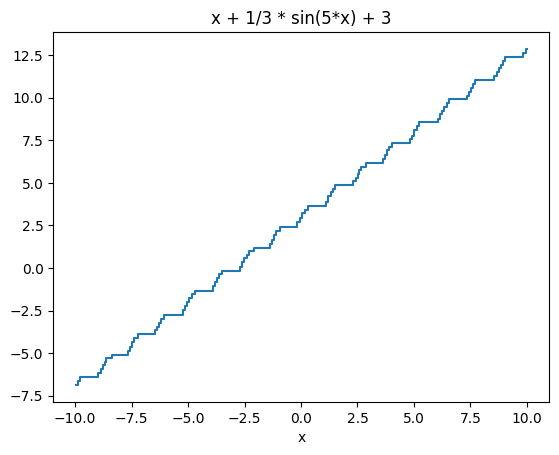

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.97, -9.89)": -6.85, "(-9.89, -9.78)": -6.64, "(-9.78, -8.97)": -6.42, "(-8.97, -8.87)": -6.19, "(-8.87, -8.78)": -5.94, "(-8.78, -8.69)": -5.72, "(-8.69, -8.62)": -5.52, "(-8.62, -8.38)": -5.3, "(-8.38, -7.68)": -5.1, "(-7.68, -7.59)": -4.87, "(-7.59, -7.48)": -4.62, "(-7.48, -7.39)": -4.36, "(-7.39, -7.23)": -4.1, "(-7.23, -6.45)": -3.9, "(-6.45, -6.36)": -3.66, "(-6.36, -6.28)": -3.45, "(-6.28, -6.18)": -3.23, "(-6.18, -6.08)": -2.99, "(-6.08, -5.23)": -2.75, "(-5.23, -5.12)": -2.47, "(-5.12, -5.04)": -2.22, "(-5.04, -4.98)": -1.99, "(-4.98, -4.83)": -1.77, "(-4.83, -4.67)": -1.54, "(-4.67, -3.91)": -1.35, "(-3.91, -3.8)": -1.08, "(-3.8, -3.72)": -0.83, "(-3.72, -3.61)": -0.59, "(-3.61, -3.5)": -0.38, "(-3.5, -2.71)": -0.17, "(-2.71, -2.6)": 0.04, "(-2.6, -2.51)": 0.34, "(-2.51, -2.4)": 0.57,

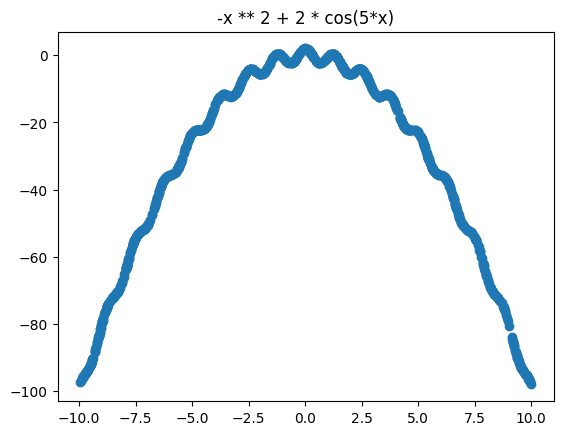

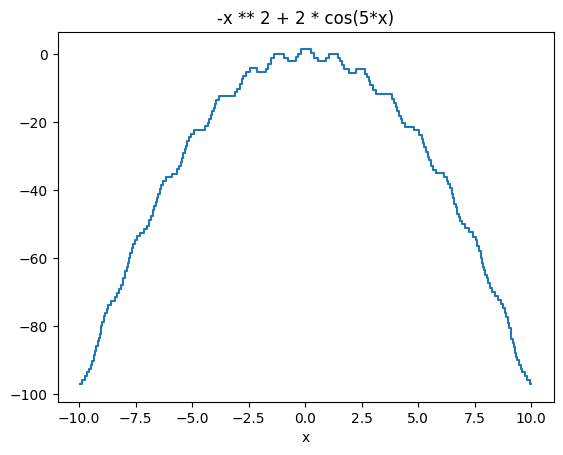

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.95, -9.85)": -96.98, "(-9.85, -9.74)": -95.94, "(-9.74, -9.63)": -94.8, "(-9.63, -9.56)": -93.65, "(-9.56, -9.47)": -92.65, "(-9.47, -9.41)": -91.44, "(-9.41, -9.35)": -90.41, "(-9.35, -9.29)": -88.54, "(-9.29, -9.23)": -87.51, "(-9.23, -9.17)": -86.02, "(-9.17, -9.13)": -84.45, "(-9.13, -9.09)": -83.41, "(-9.09, -9.05)": -82.37, "(-9.05, -9.01)": -81.27, "(-9.01, -8.97)": -80.15, "(-8.97, -8.91)": -78.95, "(-8.91, -8.85)": -77.18, "(-8.85, -8.77)": -76.12, "(-8.77, -8.71)": -74.93, "(-8.71, -8.59)": -73.81, "(-8.59, -8.43)": -72.61, "(-8.43, -8.3)": -71.49, "(-8.3, -8.24)": -70.38, "(-8.24, -8.14)": -69.26, "(-8.14, -8.06)": -67.86, "(-8.06, -7.96)": -66.05, "(-7.96, -7.9)": -63.79, "(-7.9, -7.86)": -62.77, "(-7.86, -7.8)": -61.37, "(-7.8, -7.74)": -59.93, "(-7.74, -7.68)": -58.47, "(-7.68, -7

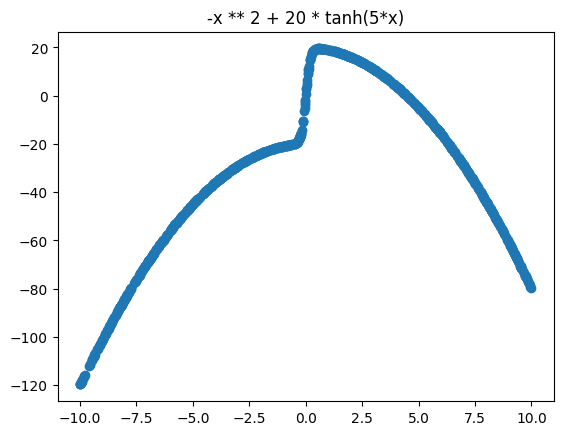

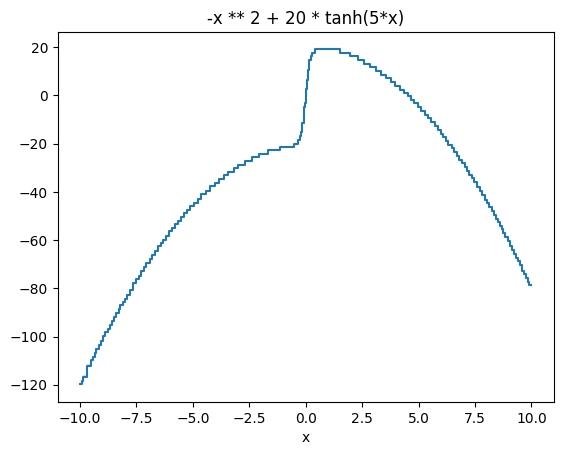

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.92)": -119.8, "(-9.92, -9.86)": -118.3, "(-9.86, -9.69)": -116.7, "(-9.69, -9.51)": -112.0, "(-9.51, -9.42)": -109.8, "(-9.42, -9.33)": -108.4, "(-9.33, -9.27)": -106.7, "(-9.27, -9.15)": -105.3, "(-9.15, -9.07)": -103.4, "(-9.07, -8.96)": -101.8, "(-8.96, -8.87)": -99.9, "(-8.87, -8.78)": -98.3, "(-8.78, -8.68)": -96.9, "(-8.68, -8.58)": -95.1, "(-8.58, -8.48)": -93.4, "(-8.48, -8.39)": -91.9, "(-8.39, -8.29)": -90.1, "(-8.29, -8.2)": -88.5, "(-8.2, -8.1)": -87.1, "(-8.1, -8.02)": -85.7, "(-8.02, -7.92)": -84.2, "(-7.92, -7.8)": -82.6, "(-7.8, -7.66)": -80.6, "(-7.66, -7.51)": -77.8, "(-7.51, -7.4)": -76.3, "(-7.4, -7.29)": -74.8, "(-7.29, -7.15)": -72.7, "(-7.15, -7.05)": -71.0, "(-7.05, -6.92)": -69.3, "(-6.92, -6.81)": -67.7, "(-6.81, -6.69)": -66.2, "(-6.69, -6.56)": -64.5, "(-6.56,

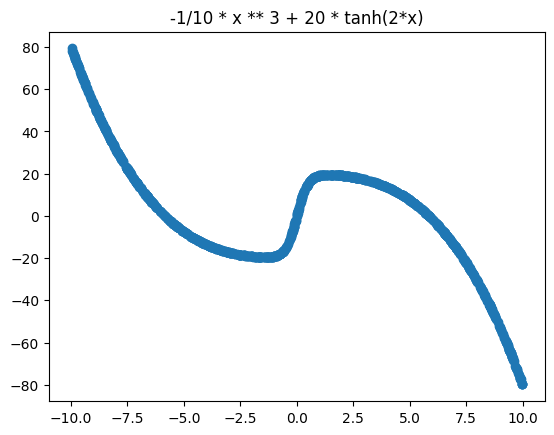

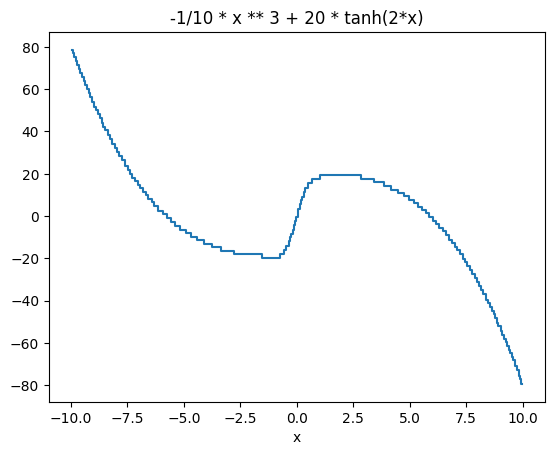

This graph represents a continuous-valued feature. The keys are intervals that represent ranges where the function predicts the same value.

Feature Name: x
Feature Type: continuous
Means: {"(-9.98, -9.91)": 78.7, "(-9.91, -9.85)": 77.0, "(-9.85, -9.79)": 75.3, "(-9.79, -9.72)": 73.5, "(-9.72, -9.65)": 71.4, "(-9.65, -9.58)": 69.7, "(-9.58, -9.51)": 67.6, "(-9.51, -9.44)": 65.8, "(-9.44, -9.38)": 63.9, "(-9.38, -9.3)": 62.1, "(-9.3, -9.23)": 60.1, "(-9.23, -9.14)": 58.1, "(-9.14, -9.07)": 56.1, "(-9.07, -8.97)": 53.9, "(-8.97, -8.89)": 51.7, "(-8.89, -8.82)": 50.1, "(-8.82, -8.73)": 48.4, "(-8.73, -8.64)": 46.3, "(-8.64, -8.56)": 44.2, "(-8.56, -8.48)": 42.3, "(-8.48, -8.38)": 40.7, "(-8.38, -8.27)": 38.3, "(-8.27, -8.17)": 36.4, "(-8.17, -8.06)": 34.2, "(-8.06, -7.97)": 32.1, "(-7.97, -7.86)": 30.3, "(-7.86, -7.76)": 28.5, "(-7.76, -7.62)": 26.3, "(-7.62, -7.48)": 23.5, "(-7.48, -7.37)": 21.6, "(-7.37, -7.29)": 19.8, "(-7.29, -7.18)": 18.2, "(-7.18, -7.05)": 16.6, "(-7.05, -6.95)": 14

In [120]:
from interpret.glassbox import ExplainableBoostingRegressor

fbench_functions_as_text = []
for f, n in fbench:
    x = np.random.uniform(-10, 10, 1000)
    y = f(x)
    ebm = ExplainableBoostingRegressor(feature_names=['x'])  
    ebm.fit(x.reshape(-1, 1), y)
    ebm_global = ebm.explain_global()

    # plot the function
    plt.scatter(x, y)
    plt.title(n)
    plt.show()

    graph = graphs.extract_graph(ebm, 0)
    # add the intercept
    graph.scores = [x + ebm.intercept_ for x in graph.scores]
    #graphs.plot_graph(graph)
    graph = t2ebm.graphs.simplify_graph(graph, min_variation_per_cent=0.01)
    graphs.plot_graph(graph)
    plt.title(n)    
    plt.show()

    graph_as_text = graphs.graph_to_text(graph, max_tokens=10000, x_axis_precision=2, confidence_bounds=False)
    print(graph_as_text)
    fbench_functions_as_text.append(graph_as_text)

In [121]:
# remove the 'preamble' from the text
fbench_functions_as_text = [x[141:] for x in fbench_functions_as_text]

In [122]:
# replace "means" with "graph"
fbench_functions_as_text = [x.replace("Means", "Graph") for x in fbench_functions_as_text]

In [123]:
fbench_functions_as_text

['Feature Name: x\nFeature Type: continuous\nGraph: {"(-9.99, -9.87)": -1.497, "(-9.87, -9.71)": -1.461, "(-9.71, -9.58)": -1.423, "(-9.58, -9.45)": -1.393, "(-9.45, -9.32)": -1.358, "(-9.32, -9.17)": -1.326, "(-9.17, -9.05)": -1.287, "(-9.05, -8.9)": -1.257, "(-8.9, -8.79)": -1.223, "(-8.79, -8.67)": -1.193, "(-8.67, -8.54)": -1.163, "(-8.54, -8.38)": -1.126, "(-8.38, -8.25)": -1.095, "(-8.25, -8.13)": -1.054, "(-8.13, -7.97)": -1.023, "(-7.97, -7.84)": -0.989, "(-7.84, -7.72)": -0.958, "(-7.72, -7.6)": -0.927, "(-7.6, -7.49)": -0.896, "(-7.49, -7.35)": -0.866, "(-7.35, -7.24)": -0.836, "(-7.24, -7.13)": -0.806, "(-7.13, -7.0)": -0.776, "(-7.0, -6.84)": -0.746, "(-6.84, -6.72)": -0.707, "(-6.72, -6.59)": -0.676, "(-6.59, -6.44)": -0.643, "(-6.44, -6.29)": -0.608, "(-6.29, -6.12)": -0.574, "(-6.12, -5.97)": -0.521, "(-5.97, -5.82)": -0.485, "(-5.82, -5.69)": -0.453, "(-5.69, -5.57)": -0.422, "(-5.57, -5.44)": -0.39, "(-5.44, -5.31)": -0.356, "(-5.31, -5.17)": -0.322, "(-5.17, -5.05)": 

# The test questions as we would present them to a human

In [ ]:
# randomly shuffle questions
np.random.seed(0)
np.random.shuffle(fbench_questions)


In [ ]:
for mc_options, solution in fbench_questions:
    # print the solution
    print(f"Solution: {fbench[solution][1]}")

Solution: exp(-x^2+1)+ 1/3 * |x|
Solution: -x ** 2 + 20 * tanh(5*x)
Solution: -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
Solution: sign(cos(x))
Solution: x + 1/3 * sin(5*x) + 3
Solution: tanh(x+10) - 1/3 * x 
Solution: x ** 3 + 250 * sin(x)
Solution: sin(x)+sin(2*x)
Solution: sin(x) + sin(3*x)
Solution: sqrt(x+10) + 1/3 * x 
Solution: exp(x)+ 4000 * sign(x)
Solution: abs(x) ** (1/10)
Solution: exp(x) + 4000* sin(x)
Solution: sign(x ** 2 - 15)
Solution: log(x+10) + 1/3 * x 
Solution: abs(x) + cos(x)
Solution: arctan(x) + sin(x)
Solution: -1/10 * x ** 3 + 20 * tanh(2*x)
Solution: sin(x)+cos(x)
Solution: exp(x)+ 2000 * abs(x)
Solution: sin(x) + sin(0.5 * x)
Solution: -x ** 2 + 2 * cos(5*x)
Solution: abs(x) + sin(x)
Solution: sign(sin(x))
Solution: |sin(x/2)|
Solution: tanh(x+10) - 1/3 * x + 1/8 * sin(5*x)
Solution: exp(-x+1)+ 2000 * abs(x+1)
Solution: -tanh(x) + 1/4 * x
Solution: sign(x) + cos(x)
Solution: abs(x ** 2 - 20)
Solution: 1/2 * (x+1) ** 4 - 5 * (x+2) **3 + 3 * x

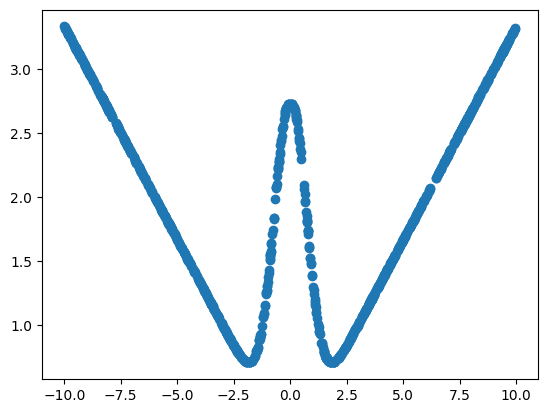

a) sqrt(x+10) + 1/3 * x 
b) sin(x)+cos(x)
c) |sin(x/2)|
d) arctan(x) + sin(x)
e) exp(-x^2+1)+ 1/3 * |x|
--------------------------------------------------------------------------------


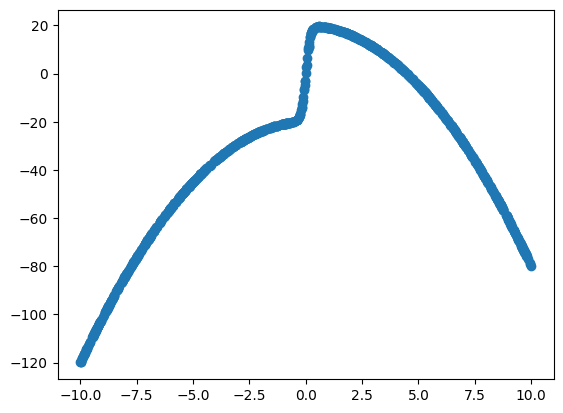

a) log(x+10) + 1/3 * x 
b) abs(x ** 2 - 20)
c) -x ** 2 + 20 * tanh(5*x)
d) exp(-x+1)+ 2000 * abs(x+1)
e) sin(x) + sin(0.5 * x)
--------------------------------------------------------------------------------


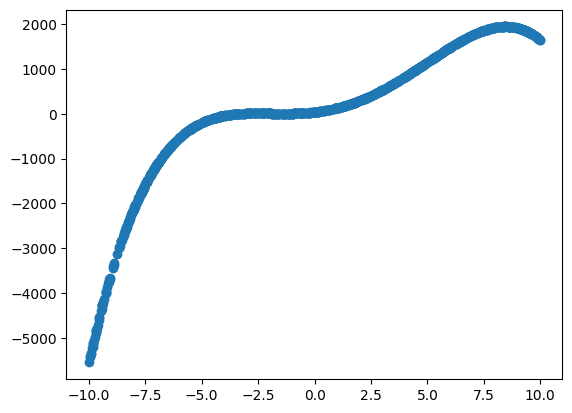

a) abs(x) ** (1/10)
b) exp(x)+ 4000 * sign(x)
c) -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
d) sin(x) + sin(3*x)
e) sign(x) + cos(x)
--------------------------------------------------------------------------------


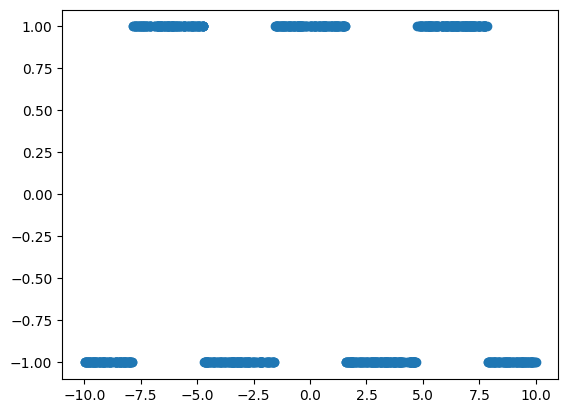

a) exp(-x+1)+ 2000 * abs(x+1)
b) sign(cos(x))
c) sign(x ** 2 - 15)
d) -tanh(x) + 1/4 * x
e) sign(x) + cos(x)
--------------------------------------------------------------------------------


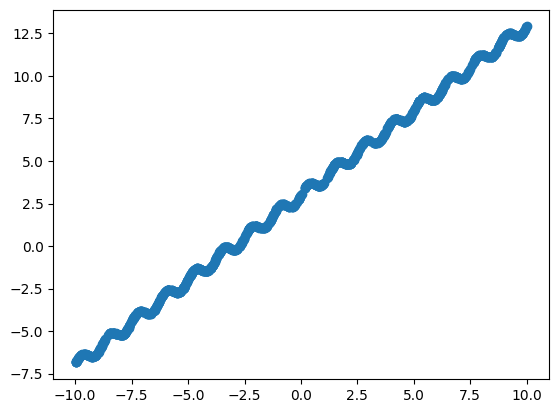

a) tanh(x+10) - 1/3 * x 
b) sin(x)+cos(x)
c) exp(x)+ 2000 * abs(x)
d) sign(x) + cos(x)
e) x + 1/3 * sin(5*x) + 3
--------------------------------------------------------------------------------


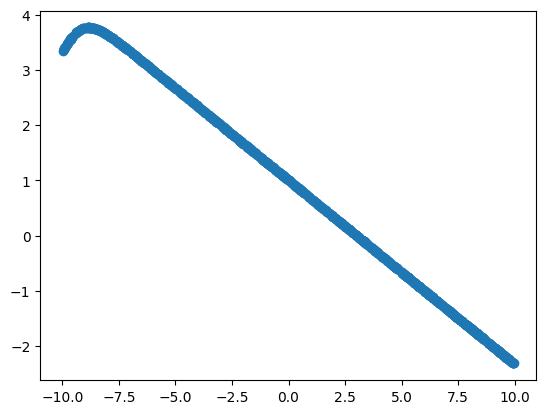

a) sin(x)+sin(2*x)
b) abs(x) ** (1/10)
c) log(x+10) + 1/3 * x 
d) -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
e) tanh(x+10) - 1/3 * x 
--------------------------------------------------------------------------------


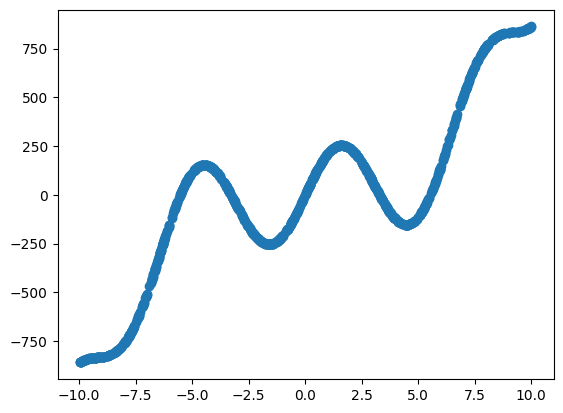

a) sin(x)+sin(2*x)
b) -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
c) exp(x) + 4000* sin(x)
d) abs(x) ** (1/10)
e) x ** 3 + 250 * sin(x)
--------------------------------------------------------------------------------


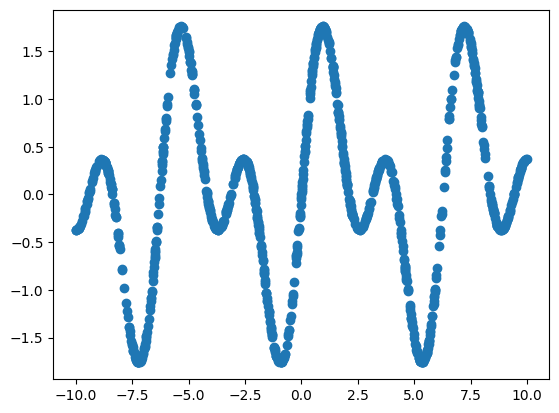

a) exp(x)+ 2000 * abs(x)
b) sin(x)+cos(x)
c) abs(x) + cos(x)
d) sin(x)+sin(2*x)
e) abs(x ** 2 - 20)
--------------------------------------------------------------------------------


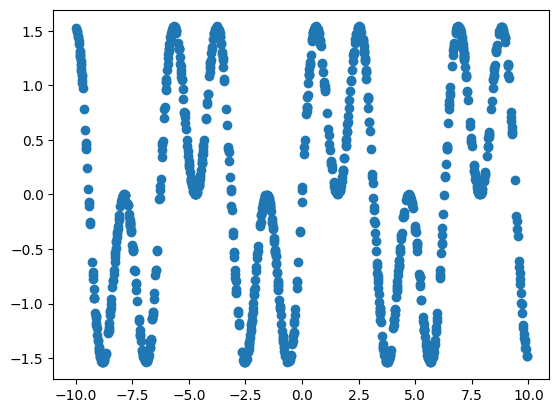

a) sin(x) + sin(3*x)
b) exp(-x^2+1)+ 1/3 * |x|
c) x + 1/3 * sin(5*x) + 3
d) -1/10 * x ** 3 + 20 * tanh(2*x)
e) exp(-x+1)+ 2000 * abs(x+1)
--------------------------------------------------------------------------------


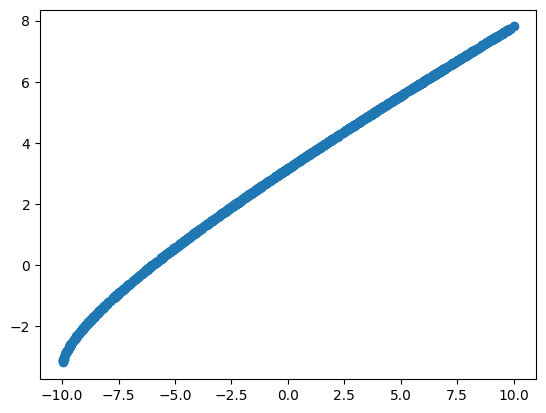

a) abs(x) + cos(x)
b) sqrt(x+10) + 1/3 * x 
c) log(x+10) + 1/3 * x 
d) exp(-x^2+1)+ 1/3 * |x|
e) exp(-x+1)+ 2000 * abs(x+1)
--------------------------------------------------------------------------------


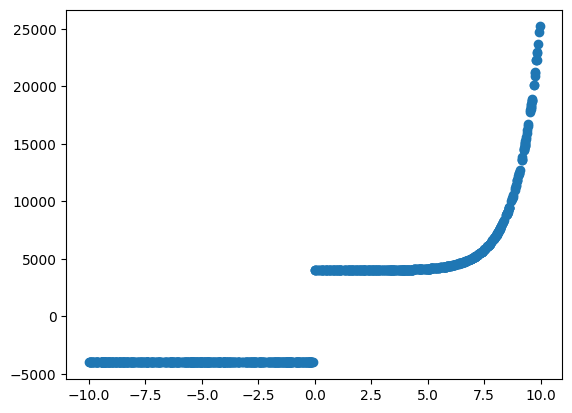

a) exp(x)+ 4000 * sign(x)
b) sign(x ** 2 - 15)
c) |sin(x/2)|
d) -tanh(x) + 1/4 * x
e) abs(x) + sin(x)
--------------------------------------------------------------------------------


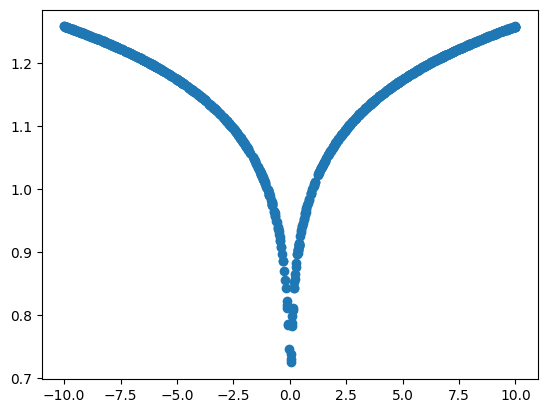

a) abs(x) ** (1/10)
b) -tanh(x) + 1/4 * x
c) sin(x)+sin(2*x)
d) sin(x) + sin(0.5 * x)
e) sign(cos(x))
--------------------------------------------------------------------------------


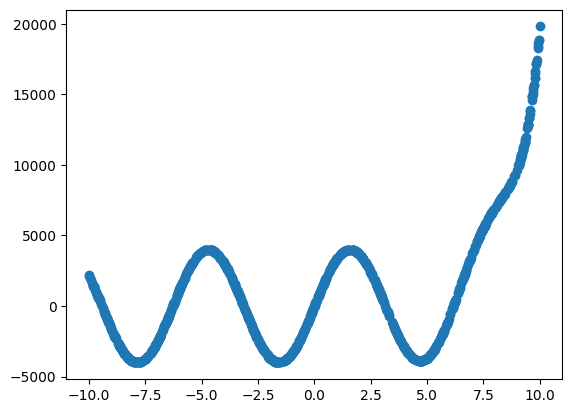

a) tanh(x+10) - 1/3 * x + 1/8 * sin(5*x)
b) sign(sin(x))
c) sign(cos(x))
d) exp(x)+ 2000 * abs(x)
e) exp(x) + 4000* sin(x)
--------------------------------------------------------------------------------


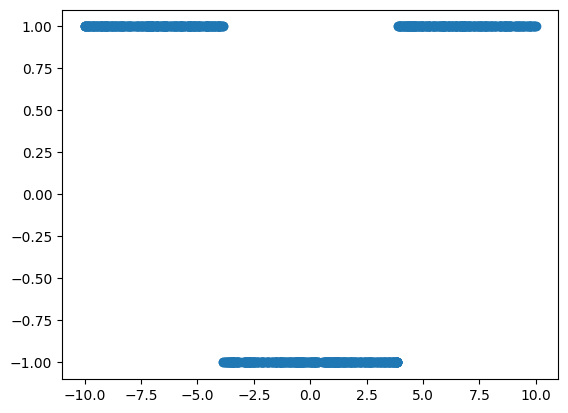

a) exp(x)+ 4000 * sign(x)
b) -tanh(x) + 1/4 * x
c) sin(x) + sin(3*x)
d) sign(x ** 2 - 15)
e) -1/10 * x ** 3 + 20 * tanh(2*x)
--------------------------------------------------------------------------------


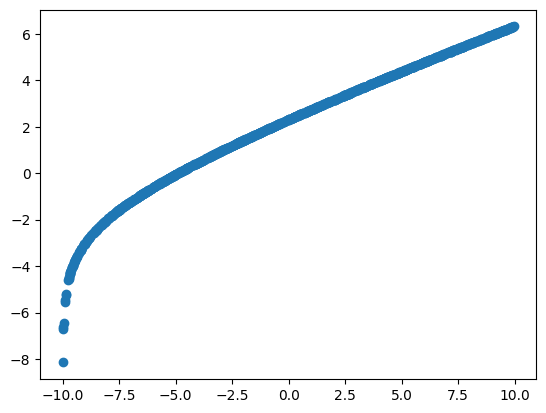

a) log(x+10) + 1/3 * x 
b) -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
c) exp(x)+ 2000 * abs(x)
d) exp(-x+1)+ 2000 * abs(x+1)
e) sin(x)+sin(2*x)
--------------------------------------------------------------------------------


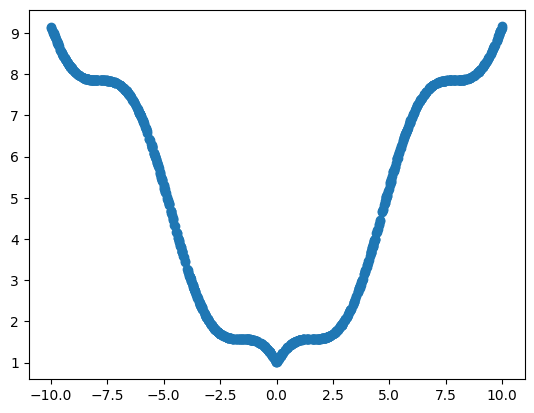

a) x ** 3 + 250 * sin(x)
b) abs(x) + sin(x)
c) abs(x) + cos(x)
d) sin(x)+cos(x)
e) -tanh(x) + 1/4 * x
--------------------------------------------------------------------------------


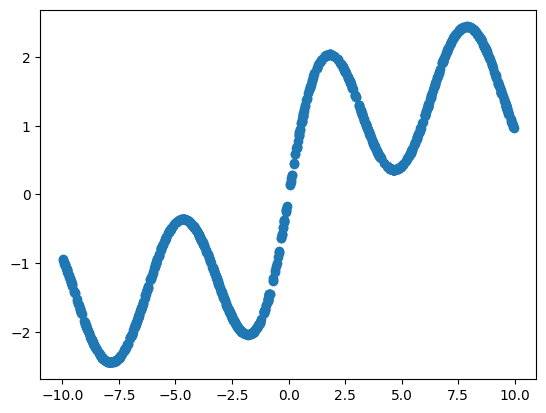

a) sign(x) + cos(x)
b) sin(x) + sin(0.5 * x)
c) exp(x)+ 2000 * abs(x)
d) sqrt(x+10) + 1/3 * x 
e) arctan(x) + sin(x)
--------------------------------------------------------------------------------


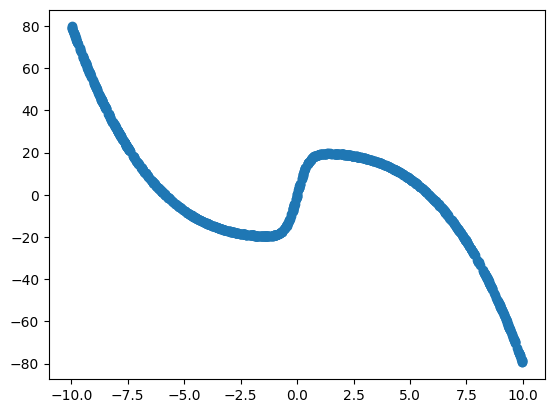

a) exp(-x+1)+ 2000 * abs(x+1)
b) x ** 3 + 250 * sin(x)
c) exp(x)+ 4000 * sign(x)
d) -1/10 * x ** 3 + 20 * tanh(2*x)
e) -x ** 2 + 20 * tanh(5*x)
--------------------------------------------------------------------------------


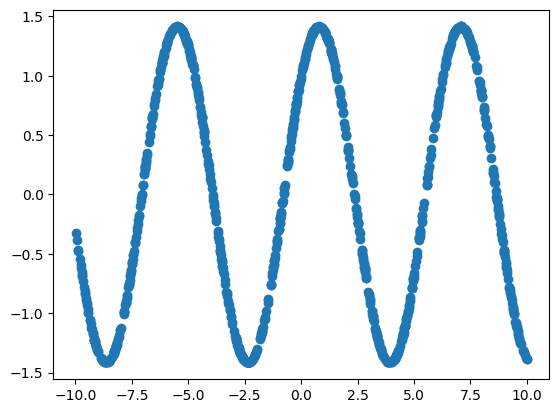

a) sin(x)+cos(x)
b) -tanh(x) + 1/4 * x
c) sqrt(x+10) + 1/3 * x 
d) sign(cos(x))
e) abs(x) + cos(x)
--------------------------------------------------------------------------------


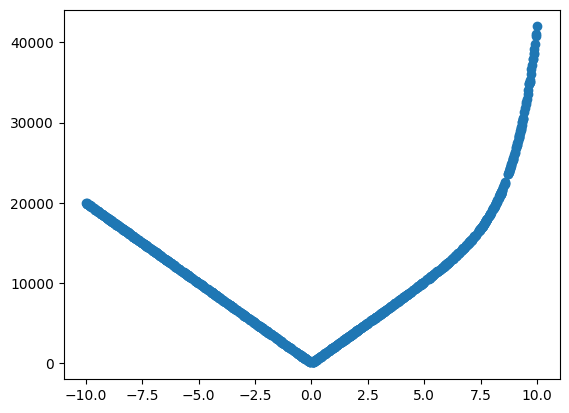

a) exp(-x+1)+ 2000 * abs(x+1)
b) -tanh(x) + 1/4 * x
c) sin(x) + sin(0.5 * x)
d) abs(x ** 2 - 20)
e) exp(x)+ 2000 * abs(x)
--------------------------------------------------------------------------------


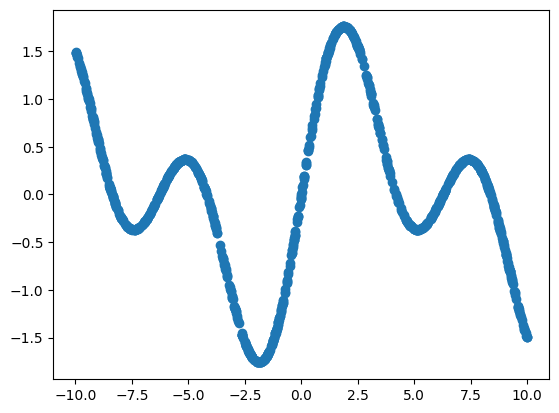

a) x + 1/3 * sin(5*x) + 3
b) sin(x) + sin(0.5 * x)
c) sign(x ** 2 - 15)
d) sin(x) + sin(3*x)
e) abs(x) + cos(x)
--------------------------------------------------------------------------------


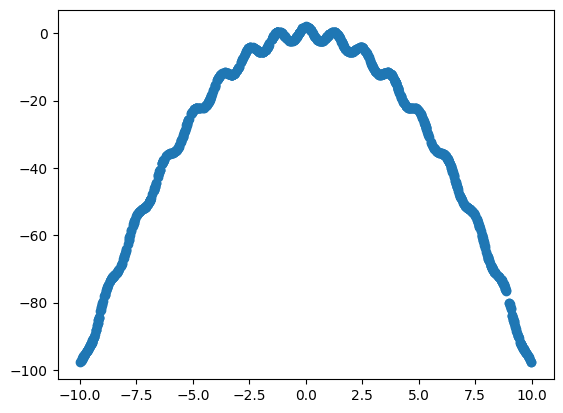

a) abs(x ** 2 - 20)
b) -x ** 2 + 2 * cos(5*x)
c) x ** 3 + 250 * sin(x)
d) sin(x)+sin(2*x)
e) exp(x) + 4000* sin(x)
--------------------------------------------------------------------------------


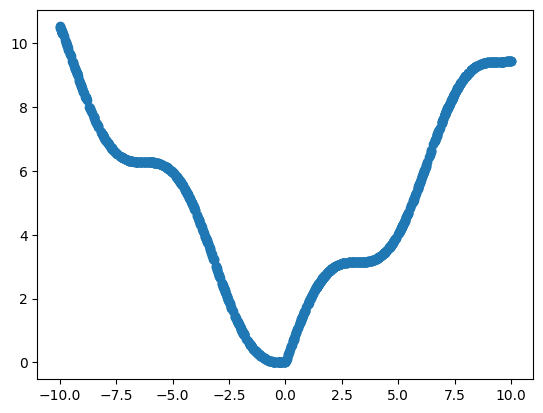

a) sign(cos(x))
b) exp(x) + 4000* sin(x)
c) abs(x) + sin(x)
d) x ** 3 + 250 * sin(x)
e) sin(x)+sin(2*x)
--------------------------------------------------------------------------------


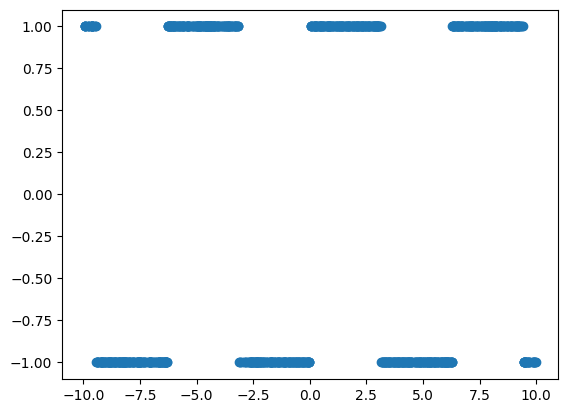

a) sign(sin(x))
b) tanh(x+10) - 1/3 * x 
c) sqrt(x+10) + 1/3 * x 
d) exp(-x+1)+ 2000 * abs(x+1)
e) sin(x)+cos(x)
--------------------------------------------------------------------------------


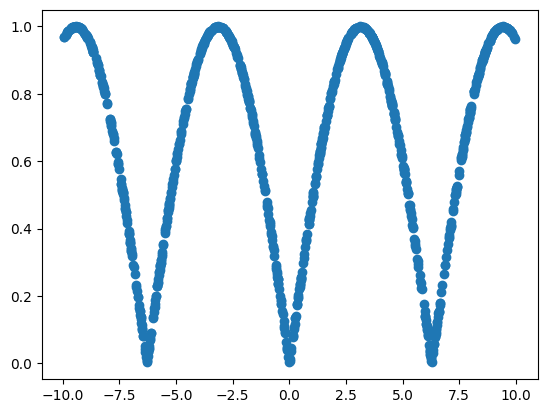

a) -tanh(x) + 1/4 * x
b) exp(-x^2+1)+ 1/3 * |x|
c) -x ** 2 + 2 * cos(5*x)
d) exp(x)+ 2000 * abs(x)
e) |sin(x/2)|
--------------------------------------------------------------------------------


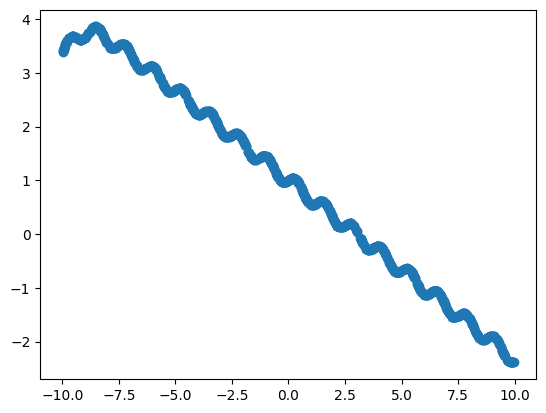

a) x ** 3 + 250 * sin(x)
b) abs(x) ** (1/10)
c) tanh(x+10) - 1/3 * x + 1/8 * sin(5*x)
d) tanh(x+10) - 1/3 * x 
e) -x ** 2 + 2 * cos(5*x)
--------------------------------------------------------------------------------


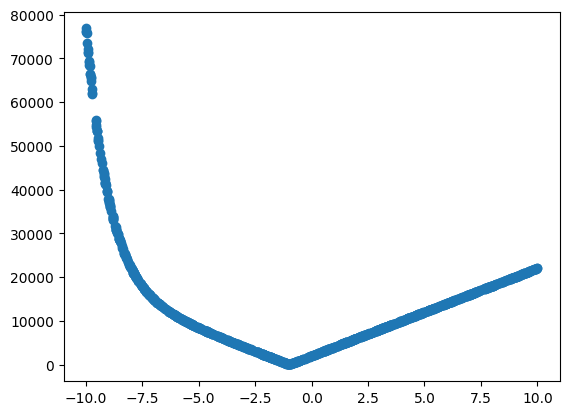

a) exp(x) + 4000* sin(x)
b) abs(x) + cos(x)
c) -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
d) exp(-x+1)+ 2000 * abs(x+1)
e) sign(sin(x))
--------------------------------------------------------------------------------


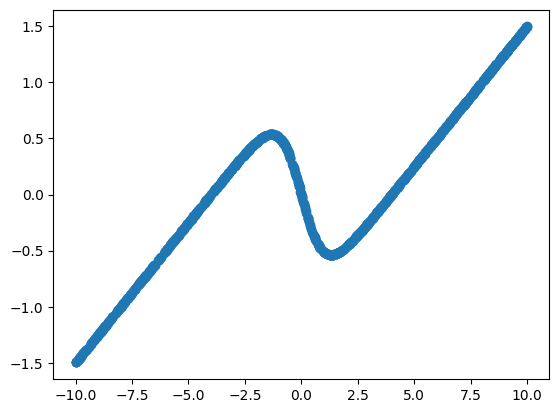

a) -tanh(x) + 1/4 * x
b) abs(x ** 2 - 20)
c) 1/2 * (x+1) ** 4 - 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
d) exp(-x+1)+ 2000 * abs(x+1)
e) sign(x) + cos(x)
--------------------------------------------------------------------------------


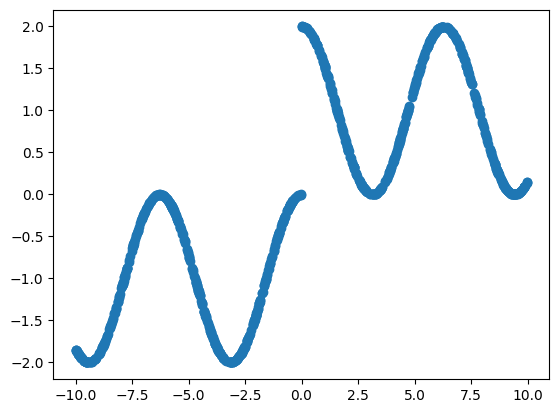

a) exp(x) + 4000* sin(x)
b) sign(x) + cos(x)
c) log(x+10) + 1/3 * x 
d) -1/10 * x ** 3 + 20 * tanh(2*x)
e) -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
--------------------------------------------------------------------------------


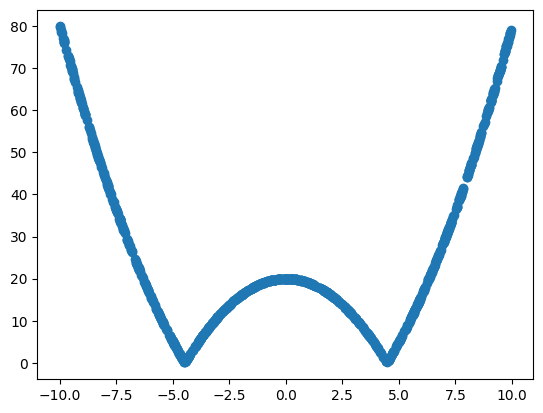

a) sign(cos(x))
b) exp(-x+1)+ 2000 * abs(x+1)
c) -x ** 2 + 20 * tanh(5*x)
d) exp(-x^2+1)+ 1/3 * |x|
e) abs(x ** 2 - 20)
--------------------------------------------------------------------------------


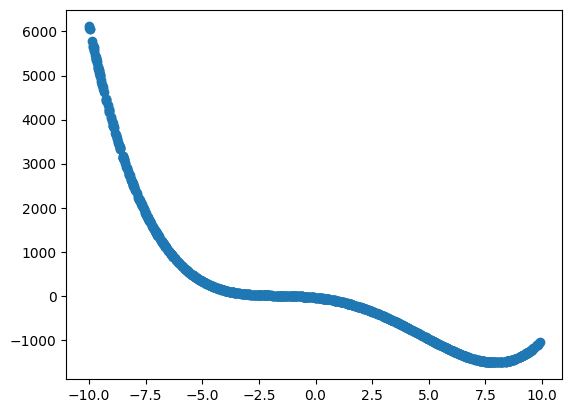

a) 1/2 * (x+1) ** 4 - 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1
b) abs(x) + cos(x)
c) exp(x) + 4000* sin(x)
d) sign(x ** 2 - 15)
e) abs(x ** 2 - 20)
--------------------------------------------------------------------------------


In [ ]:
for mc_options, solution in fbench_questions:
    # matplotlib draw the graph of the solution
    f, n = fbench[solution]
    x = np.random.uniform(-10, 10, 1000)
    y = f(x)
    plt.scatter(x, y)
    plt.show()
    # print the mc options
    for i, idx in enumerate(mc_options):
        print(f"{cases[i]} {fbench[idx][1]}")
    print('-'*80)


# Generate LLM questions

In [124]:
cases = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)', 'j)', 'k)', 'l)', 'm)', 'n)', 'o)', 'p)', 'q)', 'r)', 's)', 't)', 'u)', 'v)', 'w)', 'x)', 'y)', 'z)']
print(cases)

['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)', 'j)', 'k)', 'l)', 'm)', 'n)', 'o)', 'p)', 'q)', 'r)', 's)', 't)', 'u)', 'v)', 'w)', 'x)', 'y)', 'z)']


In [125]:
llm_questions = []
for mc_options, solution in fbench_questions:
    question = """Consider the following graph. The graph is presented as a JSON object with keys representing the x-axis and values representing the y-axis. The keys are intervals that represent ranges where the function takes the same value.\n"""
    question += f"\n{fbench_functions_as_text[solution]}\n"
    question += "The graph approximately depicts one of the following functions:\n\n"
    question += '\n'.join([f'{case} f(x) = {fbench[option][1]}' for case, option in zip(cases, mc_options)])
    question += "\n\nWhich of these functions is depicted in the graph? Think step by step."
    llm_questions.append((question, cases[mc_options.index(solution)]))

In [126]:
print(llm_questions[0][0])
print('SOLUTION: ', llm_questions[0][1])

Consider the following graph. The graph is presented as a JSON object with keys representing the x-axis and values representing the y-axis. The keys are intervals that represent ranges where the function takes the same value.

Feature Name: x
Feature Type: continuous
Graph: {"(-9.99, -9.87)": -1.497, "(-9.87, -9.71)": -1.461, "(-9.71, -9.58)": -1.423, "(-9.58, -9.45)": -1.393, "(-9.45, -9.32)": -1.358, "(-9.32, -9.17)": -1.326, "(-9.17, -9.05)": -1.287, "(-9.05, -8.9)": -1.257, "(-8.9, -8.79)": -1.223, "(-8.79, -8.67)": -1.193, "(-8.67, -8.54)": -1.163, "(-8.54, -8.38)": -1.126, "(-8.38, -8.25)": -1.095, "(-8.25, -8.13)": -1.054, "(-8.13, -7.97)": -1.023, "(-7.97, -7.84)": -0.989, "(-7.84, -7.72)": -0.958, "(-7.72, -7.6)": -0.927, "(-7.6, -7.49)": -0.896, "(-7.49, -7.35)": -0.866, "(-7.35, -7.24)": -0.836, "(-7.24, -7.13)": -0.806, "(-7.13, -7.0)": -0.776, "(-7.0, -6.84)": -0.746, "(-6.84, -6.72)": -0.707, "(-6.72, -6.59)": -0.676, "(-6.59, -6.44)": -0.643, "(-6.44, -6.29)": -0.608, "(

In [127]:
import json
with open("../benchmark/function-recognition-hard.json", "w") as f:
    json.dump(llm_questions, f, indent=2)

# Benchmark an LLM

In [128]:
# load quesitons
llm_questions = json.load(open("../benchmark/function-recognition-hard.json", "r"))
len(llm_questions)

30

In [131]:
for idx, question in enumerate(llm_questions):
    messages = []
    messages.append({'role': 'system', 'content': "You are an expert statistician and data scientist."})
    messages.append({'role': 'user', 'content': question[0]})
    response = t2ebm.utils.openai_completion_query('gpt-3.5-turbo-0125', messages, temperature=0)
    messages.append({"role": "assistant", "content": response})
    messages.append({"role": "user", "content": "Thanks. Now summarize your response by answering with the function that is depicted in the graph."})
    response = t2ebm.utils.openai_completion_query('gpt-3.5-turbo-0125', messages, temperature=0.0)
    print('LLM RESPONSE: ', response)
    print(f'SOLUTION: {fbench[idx][1]}')
    print('-'*80)

LLM RESPONSE:  The function depicted in the graph is:
e) f(x) = x ** 3 + 250 * sin(x)
SOLUTION: -tanh(x) + 1/4 * x
--------------------------------------------------------------------------------
LLM RESPONSE:  The function that is depicted in the graph is:

b) f(x) = sin(x) + sin(0.5 * x)
SOLUTION: arctan(x) + sin(x)
--------------------------------------------------------------------------------
LLM RESPONSE:  The function depicted in the graph is likely f(x) = exp(-x^2+1) + 1/3 * |x|.
SOLUTION: exp(-x^2+1)+ 1/3 * |x|
--------------------------------------------------------------------------------
LLM RESPONSE:  The function depicted in the graph is likely c) f(x) = -1/2 * (x+1) ** 4 + 5 * (x+2) **3 + 3 * x ** 2 + 2 * x + 1.
SOLUTION: exp(-x+1)+ 2000 * abs(x+1)
--------------------------------------------------------------------------------
LLM RESPONSE:  The function depicted in the graph is: f(x) = exp(x) + 2000 * abs(x)
SOLUTION: exp(x)+ 2000 * abs(x)
-----------------------------

In [132]:
8 / 30

0.26666666666666666

# gpt-4-turbo-2024-04-09 with longer context

In [73]:
for idx, question in enumerate(llm_questions):
    print(f'Graph {fbench[idx][1]}\n')
    messages = []
    messages.append({'role': 'system', 'content': "You are an expert statistician and data scientist."})
    messages.append({'role': 'user', 'content': question})
    response = t2ebm.utils.openai_completion_query('gpt-4-turbo-2024-04-09', messages)
    print(response)
    print('-'*80)

Graph x

To determine which function is depicted by the graph provided in the JSON object, we can follow a step-by-step method to analyze the relationship between the x-axis values (intervals) and their corresponding y-axis values. Let's consider each function option provided:

### Option a: f(x) = x
This is a linear function with a slope of 1. If this were the correct function, values on the y-axis should be equal to their corresponding midpoint x values in each interval.

### Option b: f(x) = sign(x)
This function results in values of -1 for negative x, 0 for x=0, and 1 for positive x. The output is not continuous, but should only output -1, 0, or 1, reflecting the sign of x.

### Option c: f(x) = -3*x^3
This is a cubic function scaled by -3. For increasing x, |y| should increase more dramatically than linearly (rapidly growing as x moves away from zero).

### Option d: f(x) = sign(x+3)
This function shifts the standard sign function to the left by 3 units. Thus, it outputs -1 for x 

In [75]:
19 / 30

0.6333333333333333

# Benchmark gemini-1.5-pro-latest

In [114]:
import google.generativeai as genai
import time
import os

genai.configure(api_key=os.environ['GEMINI_API_KEY'])

model = genai.GenerativeModel(model_name="gemini-1.5-pro-latest")
for idx, question in enumerate(llm_questions):
    print(f'Graph {fbench[idx][1]}\n')
    messages = [{'role':'user', 'parts': [question[0]]}]
    response = model.generate_content(
                messages,
                generation_config=genai.types.GenerationConfig(
                    candidate_count=1,
                    max_output_tokens=500,
                    temperature=0.2),
            )
    try:
        response = response.text
    except:
        print(f"Gemini: Invalid response with parts {response.parts}.")
        response = ""
    print('LLM RESPONSE: ', response)
    print(f'SOLUTION: {fbench[idx][1]}')
    print('-'*80)
    # sleep 20 sec to avoid rate limit
    time.sleep(20)

Graph x

LLM RESPONSE:  Here's how to determine the function depicted in the graph:

**1. Analyze the Graph's Shape:**

* **Symmetry:** The graph appears to be roughly symmetrical about the origin (0,0). This suggests it could be an odd function. Odd functions satisfy the condition f(-x) = -f(x).
* **End Behavior:** As x approaches negative infinity, y approaches positive infinity. As x approaches positive infinity, y approaches negative infinity. This behavior eliminates options c) and d) as they have opposite end behaviors. 
* **General Trend:** The graph has a single inflection point around the origin and resembles a rotated "S" shape.

**2. Evaluate the Functions:**

* **a) f(x) = x:** This is a straight line and doesn't match the graph's shape.
* **b) f(x) = -sinh(x):** The hyperbolic sine function grows exponentially, which is not consistent with the graph's behavior around x = 0.
* **c) f(x) = -3*x^3:**  While an odd function, its shape is more curved than the graph and doesn't 

In [116]:
33 / 50

0.66